# 1. Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

#from sklearnex import patch_sklearn,config_context
#patch_sklearn()


# Load libraries
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation
from sklearn.model_selection import learning_curve
#from sklearn.metrics import log_loss
from time import time

import pickle

from sklearn.preprocessing import StandardScaler

from itertools import product


from sklearn.pipeline import make_pipeline,Pipeline

#import plotly.express as px
from sklearn.model_selection import GridSearchCV as GS
from sklearn.neural_network import MLPClassifier  as NNC


from sklearn.cluster import KMeans #as kmeans
from sklearn.mixture import GaussianMixture as GMM
from sklearn.metrics import silhouette_score as sil_score, f1_score
from sklearn.metrics import adjusted_mutual_info_score as mi_score
from sklearn.metrics import homogeneity_score, completeness_score

import timeit
import time

from sklearn.decomposition import PCA
from sklearn.decomposition import FastICA as ICA
from sklearn.random_projection import SparseRandomProjection as RCA
from sklearn.manifold import Isomap

In [2]:
#setting plot config
plt.rc('font',size=15)
plt.rc('xtick',labelsize=15)
plt.rc('ytick',labelsize=15)

# 2 Setup Datasets

In [3]:
#dataset module
class data_set_module(object):
    def __init__(self,train_data=None,test_data=None,feature_cols=None,target=None, load_data=False, address='', name ='random'):
        
        
        if load_data:
            #try:
            self.load(address,name)
            #except Exception as e:
                #print(e)
        else:        
            
            self.X_train = train_data[feature_cols] # Features
            self.y_train = train_data[target] # Target variable

            self.X_test = test_data[feature_cols] # Features
            self.y_test = test_data[target] # Target variable
            self.name = name
            self.address = address
            self.ADA = dict({})
    
    def load(self,address,name):
        
            object_ = self.load_pickle(loc=address)
            #self.__dict__ = {**self.__dict__ , **object_.__dict__}
            
            for i,j in object_.__dict__.items():
                print(i)
                setattr(self, i, j)
            
            
            
            
            if not hasattr(self,'name'):
                self.name = name
            if not hasattr(self,'address'):
                self.address = address   
                
    def save(self):
        self.save_pickle(self,self.address)
        
    def save_pickle(self,ob,loc=''):
    
        with open(loc, 'wb+') as fh:
            pickle.dump(ob, fh)
        
    
    
    def load_pickle(self,loc='') :   
        with open(loc, 'rb+') as fh:
            ob = pickle.load( fh)

        return ob
    

In [4]:
def save_loss_curve(ax,title):
    
    ax.savefig(r'figure/'+title+'.png', bbox_inches='tight')

    

## 2.1 dataset configs and pickle read

In [5]:
data_set_module_flag = True # this willautomtically fetch the predefined dataobjects
save = True
make_new_d1 =False
make_new_d2 =False
if data_set_module_flag:
    #load_dataset_1
    dataset_1 = data_set_module(load_data=True, address='Dataset/dataset_1_new.pickle', name ='dataset_1_new')
    dataset_2 = data_set_module(load_data=True, address='Dataset/dataset_2_new.pickle', name ='dataset_2_new')

    
    






X_train
y_train
X_test
y_test
name
address
ADA
StandardScaler
X_train_scaled
X_test_scaled
X_train
y_train
X_test
y_test
name
address
ADA
StandardScaler
X_train_scaled
X_test_scaled


## 2.2 Dataset 1

making dataset 1
 
 - Features of data set 1 : wine quality 



Index(['type', 'fixed acidity', 'volatile acidity', 'citric acid',
       'residual sugar', 'chlorides', 'free sulfur dioxide',
       'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol',
       'quality'],
      dtype='object')

 
 - Shape of the dataframe: 
 (6497, 13)
 
 - checking missing values 



type                     0
fixed acidity           10
volatile acidity         8
citric acid              3
residual sugar           2
chlorides                2
free sulfur dioxide      0
total sulfur dioxide     0
density                  0
pH                       9
sulphates                4
alcohol                  0
quality                  0
dtype: int64

 
 - After dropping missing value 



type                    0
fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

- checking number feature type

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6463 entries, 0 to 6496
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   type                  6463 non-null   object 
 1   fixed acidity         6463 non-null   float64
 2   volatile acidity      6463 non-null   float64
 3   citric acid           6463 non-null   float64
 4   residual sugar        6463 non-null   float64
 5   chlorides             6463 non-null   float64
 6   free sulfur dioxide   6463 non-null   float64
 7   total sulfur dioxide  6463 non-null   float64
 8   density               6463 non-null   float64
 9   pH                    6463 non-null   float64
 10  sulphates             6463 non-null   float64
 11  alcohol               6463 non-null   float64
 12  quality               6463 non-null   int64  
dtypes: float64(11), int64(1), object(1)
memory usage: 706.9+ KB

- creating an identifier for w

,count,mean,std,min,25%,50%,75%,max
type,6463.0,0.753520,0.430995,0.00000,1.00000,1.00000,1.000,1.00000
fixed acidity,6463.0,7.217755,1.297913,3.80000,6.40000,7.00000,7.700,15.90000
volatile acidity,6463.0,0.339589,0.164639,0.08000,0.23000,0.29000,0.400,1.58000
citric acid,6463.0,0.318758,0.145252,0.00000,0.25000,0.31000,0.390,1.66000
residual sugar,6463.0,5.443958,4.756852,0.60000,1.80000,3.00000,8.100,65.80000
chlorides,6463.0,0.056056,0.035076,0.00900,0.03800,0.04700,0.065,0.61100
free sulfur dioxide,6463.0,30.516865,17.758815,1.00000,17.00000,29.00000,41.000,289.00000
total sulfur dioxide,6463.0,115.694492,56.526736,6.00000,77.00000,118.00000,156.000,440.00000
density,6463.0,0.994698,0.003001,0.98711,0.99233,0.99489,0.997,1.03898
pH,6463.0,3.218332,0.160650,2.72000,3.11000,3.21000,3.320,4.01000


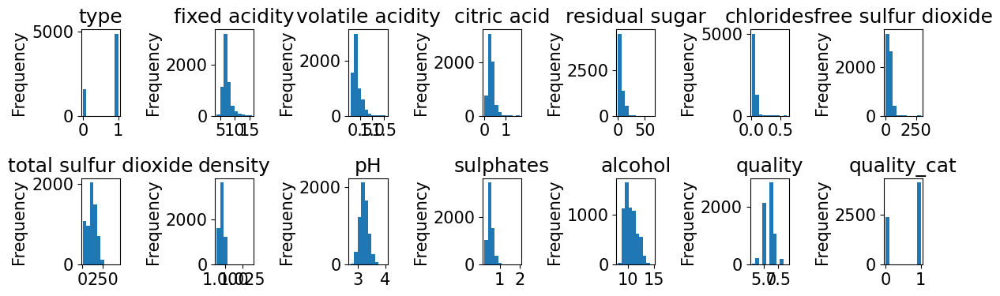

 corrilation


,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,quality_cat
type,1.000000,-0.488552,-0.653374,0.185892,0.349358,-0.512705,0.472653,0.700521,-0.391437,-0.328474,-0.486715,0.035095,0.119185,0.117207
fixed acidity,-0.488552,1.000000,0.221066,0.323744,-0.113442,0.299104,-0.283485,-0.330543,0.459713,-0.251121,0.301263,-0.096190,-0.076174,-0.067004
volatile acidity,-0.653374,0.221066,1.000000,-0.377512,-0.196677,0.377995,-0.353402,-0.414729,0.272101,0.260134,0.225656,-0.039528,-0.266677,-0.268071
citric acid,0.185892,0.323744,-0.377512,1.000000,0.142324,0.039412,0.132271,0.194398,0.097068,-0.327860,0.059070,-0.010056,0.084926,0.075442
residual sugar,0.349358,-0.113442,-0.196677,0.142324,1.000000,-0.128814,0.403449,0.495684,0.551494,-0.266481,-0.185616,-0.359132,-0.034654,-0.030123
chlorides,-0.512705,0.299104,0.377995,0.039412,-0.128814,1.000000,-0.195428,-0.279602,0.363108,0.044653,0.396240,-0.257664,-0.200553,-0.182352
free sulfur dioxide,0.472653,-0.283485,-0.353402,0.132271,0.403449,-0.195428,1.000000,0.721476,0.025113,-0.145164,-0.188947,-0.179477,0.054924,0.044354
total sulfur dioxide,0.700521,-0.330543,-0.414729,0.194398,0.495684,-0.279602,0.721476,1.000000,0.031419,-0.237204,-0.275878,-0.264385,-0.041598,-0.047390
density,-0.391437,0.459713,0.272101,0.097068,0.551494,0.363108,0.025113,0.031419,1.000000,0.012525,0.260019,-0.687432,-0.304447,-0.267802
pH,-0.328474,-0.251121,0.260134,-0.327860,-0.266481,0.044653,-0.145164,-0.237204,0.012525,1.000000,0.190864,0.120473,0.018403,0.017713


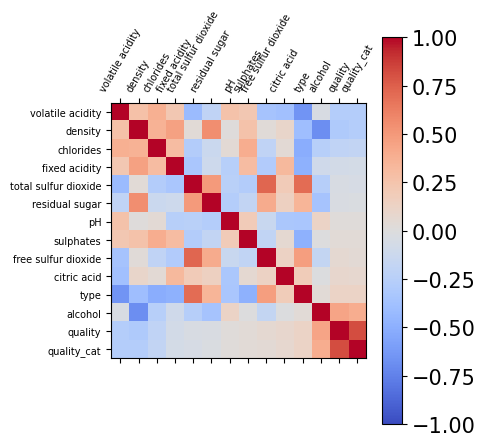

In [7]:
# this will only process if creating new data

if not data_set_module_flag:

    ###### Dataset 1
    print('making dataset 1')
    
    
    data_1_wine_qt = pd.read_csv(r'Raw_data/WineQT_2.csv')#,header=None)
    print(' \n - Features of data set 1 : wine quality \n')
    display(data_1_wine_qt.columns)

    print(' \n - Shape of the dataframe: \n',data_1_wine_qt.shape)
    print(' \n - checking missing values \n')
    display(data_1_wine_qt.apply(lambda x: x.isna().sum(), axis =0))
    data_1_wine_qt = data_1_wine_qt.dropna()
    print(' \n - After dropping missing value \n')
    display(data_1_wine_qt.apply(lambda x: x.isna().sum(), axis =0))
    
    
    print('- checking number feature type\n')
    data_1_wine_qt.info()

    print('\n- creating an identifier for wine quality\n')
    data_1_wine_qt['quality_cat'] = (data_1_wine_qt['quality'] >5).astype(float)

    print('\n- converting wine type to a dummy boolian as there are only two possible values\n')
    data_1_wine_qt['type'] = (data_1_wine_qt['type'].isin(['white'])).astype(float)

    print('\n- checking summary\n')
    display(data_1_wine_qt.describe().T)
    
    
    #creating univariates
    num_cols = len(data_1_wine_qt.columns)
    num_rows = (num_cols + 1) // 2  # Two columns of plots

    # Create a new figure and subplots
    fig, axes = plt.subplots(nrows=2, ncols=num_rows, figsize=(12, 4))

    # Flatten the axes array to simplify indexing
    axes = axes.flatten()

    # Loop through each column and plot its distribution
    for i, column in enumerate(data_1_wine_qt.columns):
        ax = axes[i]
        data_1_wine_qt[column].plot(kind='hist', ax=ax, title=column)
        ax.set_ylabel('Frequency')

    # Remove any empty subplots
    if num_cols % 2 != 0:
        fig.delaxes(axes[num_cols])

    # Adjust layout
    plt.tight_layout()

    # Show the plot
    plt.show()

    save_loss_curve(fig,'data_1_summary')    

    
    
    
    
    print(' corrilation')
    
    display(data_1_wine_qt.astype(float).corr())
    
    
    
    
    #correlation chart
    if save:
        fig = plt.figure(figsize = [5,5])




    corr_d1 = data_1_wine_qt.astype(float).corr().loc[data_1_wine_qt.astype(float).corr().quality_cat.sort_values().index.values,
                                            data_1_wine_qt.astype(float).corr().quality_cat.sort_values().index.values]

    plt.matshow(corr_d1, cmap='coolwarm', fignum=0,vmin=-1, vmax=1)

    # Customize the heatmap
    plt.colorbar()  # Add a color bar
    plt.xticks(range(len(corr_d1.columns)), corr_d1.columns, rotation=60,fontsize =7)
    plt.yticks(range(len(corr_d1.columns)), corr_d1.columns,fontsize =7)

    # Adjust layout
    plt.tight_layout()
    # Display the plot
    plt.show()

    if save:
        fig = save_loss_curve(fig,'data_1_summary_corr')



    #spliting data
    
    data_1_splitter = int(np.ceil(data_1_wine_qt.shape[0]*0.8))

    data_1_training, data_1_test = data_1_wine_qt.iloc[:data_1_splitter,:], data_1_wine_qt.iloc[data_1_splitter:,:]


    data_1_feature_cols =['type', 'fixed acidity', 'volatile acidity', 'citric acid',
           'residual sugar', 'chlorides', 'free sulfur dioxide',
           'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol']


    #data_1_feature_cols =['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
    #       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
    #       'pH', 'sulphates', 'alcohol']


    data_1_target = 'quality_cat'

    


    dataset_1 = data_set_module(train_data=data_1_training,test_data=data_1_test,
                                feature_cols=data_1_feature_cols, target=data_1_target,
                                address=r'Dataset/dataset_1_new.pickle', name ='dataset_1_new')

    
    dataset_1.StandardScaler =  StandardScaler()
    dataset_1.StandardScaler.fit(dataset_1.X_train)
    dataset_1.X_train_scaled =   dataset_1.StandardScaler.transform(dataset_1.X_train)
    dataset_1.X_test_scaled =   dataset_1.StandardScaler.transform(dataset_1.X_test)


    
    
    if save:
        dataset_1.save()
    
    


    
    
    
    
    
    
    
    



## 2.3 Dataset 2

making dataset 2


'\nfeatures'

Index(['long_hair', 'forehead_width_cm', 'forehead_height_cm', 'nose_wide',
       'nose_long', 'lips_thin', 'distance_nose_to_lip_long', 'gender'],
      dtype='object')

'\nrecord_shape'

(5001, 8)


- check for missing data values



long_hair                    0
forehead_width_cm            0
forehead_height_cm           0
nose_wide                    0
nose_long                    0
lips_thin                    0
distance_nose_to_lip_long    0
gender                       0
dtype: int64

(5001, 8)


 -no missing data found

- checking number feature type

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5001 entries, 0 to 5000
Data columns (total 8 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   long_hair                  5001 non-null   int64  
 1   forehead_width_cm          5001 non-null   float64
 2   forehead_height_cm         5001 non-null   float64
 3   nose_wide                  5001 non-null   int64  
 4   nose_long                  5001 non-null   int64  
 5   lips_thin                  5001 non-null   int64  
 6   distance_nose_to_lip_long  5001 non-null   int64  
 7   gender                     5001 non-null   float64
dtypes: float64(3), int64(5)
memory usage: 312.7 KB

- checking summary



,count,mean,std,min,25%,50%,75%,max
long_hair,5001.0,0.869626,0.336748,0.0,1.0,1.0,1.0,1.0
forehead_width_cm,5001.0,13.181484,1.107128,11.4,12.2,13.1,14.0,15.5
forehead_height_cm,5001.0,5.946311,0.541268,5.1,5.5,5.9,6.4,7.1
nose_wide,5001.0,0.493901,0.500013,0.0,0.0,0.0,1.0,1.0
nose_long,5001.0,0.507898,0.499988,0.0,0.0,1.0,1.0,1.0
lips_thin,5001.0,0.493101,0.500002,0.0,0.0,0.0,1.0,1.0
distance_nose_to_lip_long,5001.0,0.498900,0.500049,0.0,0.0,0.0,1.0,1.0
gender,5001.0,0.499900,0.500050,0.0,0.0,0.0,1.0,1.0


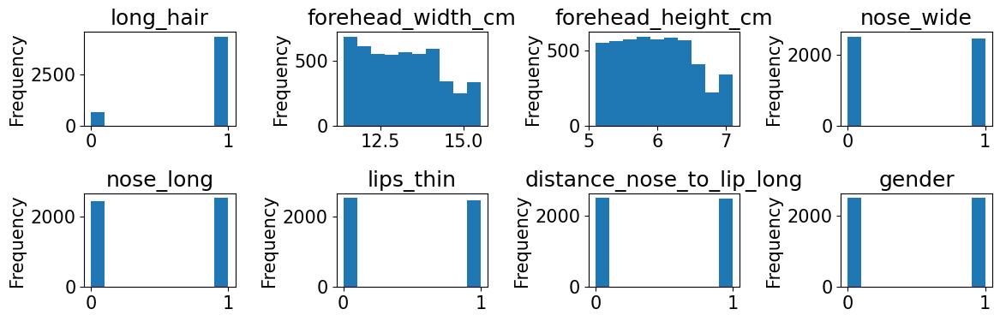

correlation


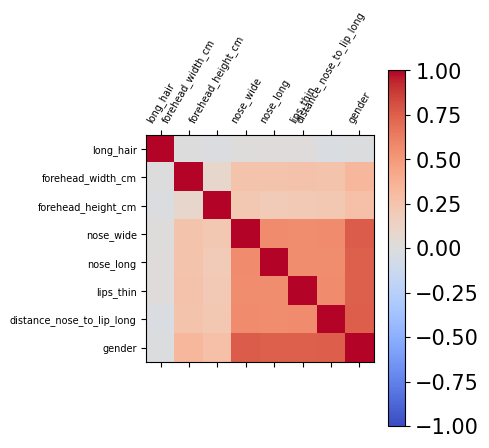

In [8]:
#https://www.kaggle.com/datasets/elakiricoder/gender-classification-dataset


if not data_set_module_flag:

    ###### Dataset 1
    print('making dataset 2')
    


    data_2_gender = pd.read_csv(r'Raw_data/genderclass.csv')
    display('\nfeatures',data_2_gender.columns )
    display('\nrecord_shape',data_2_gender.shape)
    print('\n- check for missing data values\n')
    display(data_2_gender.apply(lambda x: x.isna().sum(), axis =0),data_2_gender.shape)
    print('\n -no missing data found\n')
    
    #converting gender to boolean, male =1
    data_2_gender['gender']  = (data_2_gender['gender'] == 'Male').astype(float)

    print('- checking number feature type\n')
    data_2_gender.info()

    print('\n- checking summary\n')
    display(data_2_gender.describe().T)

    num_cols = len(data_2_gender.columns)
    num_rows = (num_cols + 1) // 2  # Two columns of plots

    # Create a new figure and subplots
    fig, axes = plt.subplots(nrows=2, ncols=num_rows, figsize=(12, 4))

    # Flatten the axes array to simplify indexing
    axes = axes.flatten()

    # Loop through each column and plot its distribution
    for i, column in enumerate(data_2_gender.columns):
        ax = axes[i]
        data_2_gender[column].plot(kind='hist', ax=ax, title=column)
        ax.set_ylabel('Frequency')

    # Remove any empty subplots
    if num_cols % 2 != 0:
        fig.delaxes(axes[num_cols])

    # Adjust layout
    plt.tight_layout()

    # Show the plot
    plt.show()

    
    if save :
        save_loss_curve(fig,'data_2_summary')  
    
    
    print('correlation')
    
    data_2_gender.astype(float).corr()
    

    #data_1_wine_qt.corr()

    fig = plt.figure(figsize = [5,5])

    plt.matshow(data_2_gender.astype(float).corr(), cmap='coolwarm', fignum=0,vmin=-1, vmax=1)

    # Customize the heatmap
    plt.colorbar()  # Add a color bar
    plt.xticks(range(len(data_2_gender.columns)), data_2_gender.columns, rotation=60,fontsize =7)
    plt.yticks(range(len(data_2_gender.columns)), data_2_gender.columns,fontsize =7)

    # Adjust layout
    plt.tight_layout()
    # Display the plot
    plt.show()
    
    if save :
        fig = save_loss_curve(fig,'data_2_summary_corr')    
    

    

    data_2_feature_cols = [ 'long_hair', 'forehead_width_cm', 'forehead_height_cm', 'nose_wide',
           'nose_long', 'lips_thin', 'distance_nose_to_lip_long']
    data_2_target = 'gender'

    data_2_splitter = int(np.ceil(data_2_gender.shape[0]*0.8))

    data_2_training, data_2_test = data_2_gender.iloc[:data_2_splitter,:], data_2_gender.iloc[data_2_splitter:,:]






    dataset_2 = data_set_module(train_data=data_2_training,
                                test_data=data_2_test,feature_cols=data_2_feature_cols,
                                target=data_2_target, address='Dataset/dataset_2_new.pickle', name ='dataset_2_new')

    dataset_2.StandardScaler =  StandardScaler()
    dataset_2.StandardScaler.fit(dataset_2.X_train)
    dataset_2.X_train_scaled =   dataset_2.StandardScaler.transform(dataset_2.X_train)
    dataset_2.X_test_scaled =   dataset_2.StandardScaler.transform(dataset_2.X_test)

    if save :
        dataset_2.save()    
    
    
    

# 3 Functions definitions

## 3.1 Clustering

### 3.1.1 K means

In [817]:
dataset_1.save()
dataset_2.save()

In [967]:
def run_kmeans(dataset,cluster_list =[2,3,4,5,6],train = 'X_train_scaled',
               test = 'X_test_scaled',
               random_state= 42,n_init=10, return_labels = False, save_labels = False,
              
              Dataset_name = 'Dataset_1', misc ='',
              plot_config = dict({})):
    
    kmens_object = dict({})
    
    

    data = dict({})
    time = []
    Train_labels = []
    Test_labels = []
    cluster_centers_ = []
    Squared_error = []
    sil_score_lis = []
    homogeneity_list = []
    Completeness_list = []
    Adj_Mutual_info_list = []
    
    
    X_train_ = dataset.__getattribute__(train)
    X_test_ = dataset.__getattribute__(test)
    
    
    y_train = dataset.y_train    
    
    
    
    
    #loop through cluster list
    for k in cluster_list:
        #data[k] = dict({})
        #setting init kmeans algo
        km_clust = KMeans(n_clusters=k,n_init=n_init,random_state=random_state)
        start_time = timeit.default_timer()
        km_clust.fit(X_train_)
        end_time = timeit.default_timer()
        
        time.append(end_time - start_time)
        
        
        predicted = km_clust.labels_
        Train_labels.append( {k:km_clust.labels_})
        
        cluster_centers_.append( {k:km_clust.cluster_centers_})
        Test_labels.append( {k:km_clust.predict(X_test_)})
            
        #new########
        
        km_clust.fit(X_train_,y_train)



        homogeneity = homogeneity_score(y_train,predicted)
        Completeness = completeness_score(y_train,predicted)
        Adj_Mutual_info = mi_score(y_train,predicted)
        
        homogeneity_list.append(homogeneity)
        Completeness_list.append(Completeness)
        Adj_Mutual_info_list.append(Adj_Mutual_info)
        ########
        
        
        
        
        Squared_error.append(km_clust.inertia_)
        sil_score_lis.append(sil_score(
                                        X_train_,
                                        Train_labels[-1][k],
                                        metric='euclidean',
                                        #sample_size=None,
                                        random_state=random_state,
                                    ))
        
        
    train_label_df = pd.DataFrame({j:list(i.values())[0]  for i,j in zip(Train_labels,cluster_list) },
                                 
                                 index = dataset.X_train.index
                                 )
    test_label_df = pd.DataFrame({j:list(i.values())[0]  for i,j in zip(Test_labels,cluster_list) },
                                index = dataset.X_test.index)
    #cluster_centers_df = pd.DataFrame({'values' : list(i.values())[0]  for i,j in zip(cluster_centers_,cluster_list) })
    
    score_df = pd.DataFrame({'Squared_error':Squared_error ,
                 'sil_score':sil_score_lis ,
                 'Cluster' :cluster_list,
                 'time' : time,
                 "homogeneity" : homogeneity_list,
                 "Completeness" : Completeness_list,
                 "Adj_Mutual_info" : Adj_Mutual_info_list
                 
                 
                 })#

    
    
    fig,ax = plt.subplots()
    title = 'Homogeneity - Kmeans - '+Dataset_name+misc
    abx = score_df.plot(x = 'Cluster',y ='homogeneity',linestyle='-', marker='o',
                  
                  title = title, ylabel = 'Homogeneity',ax = ax,**plot_config)
    plt.show()
    
    save_loss_curve(fig,title)        
    
    
    
    fig,ax = plt.subplots()
    title = 'Completeness - Kmeans - '+Dataset_name+misc
    abx = score_df.plot(x = 'Cluster',y ='Completeness',linestyle='-', marker='o',
                  
                  title = title, ylabel = 'Completeness',ax = ax,**plot_config)
    plt.show()
    
    save_loss_curve(fig,title)        
    
    
        
    
    fig,ax = plt.subplots()
    title = 'Adj_Mutual_info - Kmeans - '+Dataset_name+misc
    abx = score_df.plot(x = 'Cluster',y ='Adj_Mutual_info',linestyle='-', marker='o',
                  
                  title = title, ylabel = 'Adj_Mutual_info',ax = ax,**plot_config)
    plt.show()
    
    save_loss_curve(fig,title)        
        
    
    
    
    
    
    
    
    
    
    fig,ax = plt.subplots()
    title = 'Elbow Curve - Kmeans - '+Dataset_name+misc
    abx = score_df.plot(x = 'Cluster',y ='Squared_error',linestyle='-', marker='o',
                  
                  title = title, ylabel = 'SSE',ax = ax,**plot_config)
    plt.show()
    
    save_loss_curve(fig,title)    
    
    fig,ax = plt.subplots()
    title = 'Silhouette score - Kmeans - '+Dataset_name+misc
    adx = score_df.plot(x = 'Cluster',y ='sil_score',linestyle='-', marker='o',
                  
                  title = title, ylabel = 'Silhouette_score',ax = ax,**plot_config)
    
    ax.axvline(x=score_df.iloc[score_df['sil_score'].argmax()].Cluster,linestyle='--',c='grey',
               label ='Best K:'+str(score_df.iloc[score_df['sil_score'].argmax()].Cluster))
    
    plt.show()
    
    save_loss_curve(fig,title)
    
    
    
    
    fig,ax = plt.subplots()
    title = 'Fit_time - Kmeans - '+Dataset_name+misc
    abx = score_df.plot(x = 'Cluster',y ='time',linestyle='-', marker='o',
                  
                  title = title, ylabel = 'Fit_time',ax = ax,**plot_config)
    plt.show()
    
    save_loss_curve(fig,title)     
    
    
    
    #plt.savefig('')
     
        
    train_label_df.to_csv('ADA//Kmeans_Train_labels '+Dataset_name+misc+'.csv')
    test_label_df.to_csv('ADA//Kmeans_Test_labels '+Dataset_name+misc+'.csv')
    score_df.to_csv('ADA//Kmeans_score'+Dataset_name+misc+'.csv')   
    
        
    return { 'cluster_list': cluster_list, 'Train_labels':train_label_df
            , 'Test_labels': test_label_df
            , 'clusters': cluster_centers_
            , 'score_df': score_df}
        

### 3.1.2 Expectation maximization

In [968]:


def run_EM(dataset,cluster_list =[2,3,4,5,6],train = 'X_train_scaled',
               test = 'X_test_scaled',
               random_state= 42,n_init=10, return_labels = False, save_labels = False,
              
              Dataset_name = 'Dataset_1', misc ='',
              plot_config = dict({}),
              EM_params = dict({})
          ):
    
    kmens_object = dict({})
    
    

    data = dict({})
    time = []
    Train_labels = []
    Test_labels = []
    cluster_centers_ = []
    BIC = []
    AIC = []
    sil_score_lis = []
    homogeneity_list = []
    Completeness_list = []
    Adj_Mutual_info_list = []
    
    
    X_train_ = dataset.__getattribute__(train)
    X_test_ = dataset.__getattribute__(test)
    
    y_train = dataset.y_train
    
    
    #loop through cluster list
    for k in cluster_list:
        #data[k] = dict({})
        #setting init kmeans algo
        
        gmm_cust = GMM(n_components=k,covariance_type='diag',
                n_init=n_init,random_state=random_state,**EM_params)
        
        start_time = timeit.default_timer()
        gmm_cust.fit(X_train_)
        end_time = timeit.default_timer()
        
        
        predicted = gmm_cust.predict(X_train_)
        
        
        Train_labels.append( {k:predicted})
        #end_time = timeit.default_timer()
        
        time.append(end_time - start_time)
        

        unique_pred = np.unique(predicted)
        

        homogeneity = homogeneity_score(y_train,predicted)
        Completeness = completeness_score(y_train,predicted)
        Adj_Mutual_info = mi_score(y_train,predicted)
        
        homogeneity_list.append(homogeneity)
        Completeness_list.append(Completeness)
        Adj_Mutual_info_list.append(Adj_Mutual_info)        
        
        
        
        
        
        
        #cluster_centers_.append( {k:gmm_cust.cluster_centers_})
        Test_labels.append( {k:gmm_cust.predict(X_test_)})
            
            
        
        BIC.append(gmm_cust.bic(X_train_))
        AIC.append(gmm_cust.aic(X_train_))
        sil_score_lis.append(sil_score(
                                        X_train_,
                                        Train_labels[-1][k],
                                        metric='euclidean',
                                        #sample_size=None,
                                        random_state=random_state,
                                    ))
        #n_iter_
        
    train_label_df = pd.DataFrame({j:list(i.values())[0]  for i,j in zip(Train_labels,cluster_list) },
                                 
                                 index = dataset.X_train.index
                                 )
    test_label_df = pd.DataFrame({j:list(i.values())[0]  for i,j in zip(Test_labels,cluster_list) },
                                index = dataset.X_test.index)
    #cluster_centers_df = pd.DataFrame({'values' : list(i.values())[0]  for i,j in zip(cluster_centers_,cluster_list) })
    
    score_df = pd.DataFrame({'BIC':BIC ,
                             'AIC':AIC ,
                 'sil_score':sil_score_lis ,
                 'Cluster' :cluster_list,
                 'time' : time,
                 
                 "homogeneity" : homogeneity_list,
                 "Completeness" : Completeness_list,
                 "Adj_Mutual_info" : Adj_Mutual_info_list
                                  
                 
                 })#

    
    
    fig,ax = plt.subplots()
    title = 'Homogeneity - EM - '+Dataset_name+misc
    abx = score_df.plot(x = 'Cluster',y ='homogeneity',linestyle='-', marker='o',
                  
                  title = title, ylabel = 'Homogeneity',ax = ax,**plot_config)
    plt.show()
    
    save_loss_curve(fig,title)        
    
    
    
    fig,ax = plt.subplots()
    title = 'Completeness - EM - '+Dataset_name+misc
    abx = score_df.plot(x = 'Cluster',y ='Completeness',linestyle='-', marker='o',
                  
                  title = title, ylabel = 'Completeness',ax = ax,**plot_config)
    plt.show()
    
    save_loss_curve(fig,title)        
    
    
        
    
    fig,ax = plt.subplots()
    title = 'Adj_Mutual_info - EM - '+Dataset_name+misc
    abx = score_df.plot(x = 'Cluster',y ='Adj_Mutual_info',linestyle='-', marker='o',
                  
                  title = title, ylabel = 'Adj_Mutual_info',ax = ax,**plot_config)
    plt.show()
    
    save_loss_curve(fig,title)        
            
    
    
    
    
    
    
    
    
    
    
    
    
    
    fig,ax = plt.subplots()
    title = 'AIC Curve - EM - '+Dataset_name+misc
    abx = score_df.plot(x = 'Cluster',y ='AIC',linestyle='-', marker='o',
                  
                  title = title, ylabel = 'AIC',ax = ax,**plot_config)
    plt.show()
    
    save_loss_curve(fig,title)    

    fig,ax = plt.subplots()
    title = 'BIC Curve - EM - '+Dataset_name+misc
    abx = score_df.plot(x = 'Cluster',y ='BIC',linestyle='-', marker='o',
                  
                  title = title, ylabel = 'BIC',ax = ax,**plot_config)
    plt.show()
    
    save_loss_curve(fig,title)      
    
    fig,ax = plt.subplots()
    title = 'Fit_time - EM - '+Dataset_name+misc
    abx = score_df.plot(x = 'Cluster',y ='time',linestyle='-', marker='o',
                  
                  title = title, ylabel = 'Fit_time',ax = ax,**plot_config)
    plt.show()
    
    save_loss_curve(fig,title)     
    
    
    
    fig,ax = plt.subplots()
    title = 'Silhouette score - EM - '+Dataset_name+misc
    adx = score_df.plot(x = 'Cluster',y ='sil_score',linestyle='-', marker='o',
                  
                  title = title, ylabel = 'Silhouette_score',ax = ax,**plot_config)
    ax.axvline(x=score_df.iloc[score_df['sil_score'].argmax()].Cluster,linestyle='--',c='grey',
              
               label ='Best K:'+str(score_df.iloc[score_df['sil_score'].argmax()].Cluster)
              )
    
    plt.show()
    
    save_loss_curve(fig,title)
    
    
    
    
    
    #plt.savefig('')
     
        
    train_label_df.to_csv('ADA//EM_Train_labels '+Dataset_name+misc+'.csv')
    test_label_df.to_csv('ADA//EM_Test_labels '+Dataset_name+misc+'.csv')
    score_df.to_csv('ADA//EM_score'+Dataset_name+misc+'.csv')   
    
        
    return { 'cluster_list': cluster_list, 'Train_labels':train_label_df
            , 'Test_labels': test_label_df
            #, 'clusters': cluster_centers_
            , 'score_df': score_df}
        

## 3.2 Dimensionality Reduction

### 3.2.1 Linear

#### 3.2.1.a PCA

In [479]:
def run_PCA(dataset,
            train = 'X_train_scaled',
               test = 'X_test_scaled',
               random_state= 42,
            Dataset_name = 'Dataset_1', 
            misc ='',
            plot_config = dict({}), explained_variance = 0.85):
    
    X_train_ = dataset.__getattribute__(train)
    X_test_ = dataset.__getattribute__(test)
    
    

    pca = PCA(random_state=random_state)
    start_time = timeit.default_timer()
    pca.fit(X_train_)
    total_time = timeit.default_timer() - start_time
    X_train_pca = pd.DataFrame(pca.transform(X_train_))
    X_test_pca = pd.DataFrame(pca.transform(X_test_))
    
    dataset.X_train_pca = X_train_pca
    dataset.X_test_pca = X_test_pca
    
    
    
    cum_explained_var_ratio = np.cumsum(pca.explained_variance_ratio_)

    pca_df = pd.DataFrame({'Cumulative Explianed Variance' : cum_explained_var_ratio,
                 'Explianed Variance Ratio' : pca.explained_variance_ratio_,
                  'Eigen values' : pca.singular_values_,
                           
                 }, index = (np.arange(len(cum_explained_var_ratio))+1))
    
    best_pca_df = int((pca_df['Cumulative Explianed Variance']>=explained_variance).argmax())
    
    
    
    dataset.X_train_pca_sel = X_train_pca.iloc[:,0:best_pca_df+1]
    dataset.X_test_pca_sel = X_test_pca.iloc[:,0:best_pca_df+1]    
    
    
    
    
    X_train_pca.to_csv('ADA//PCA//X_train'+Dataset_name+misc+'.csv')
    X_test_pca.to_csv('ADA//PCA//X_test'+Dataset_name+misc+'.csv')
    pca_df.to_csv('ADA//PCA//pca_df'+Dataset_name+misc+'.csv')
    
    
    
    fig, ax = plt.subplots()
    
    axb = pca_df.plot(y = 'Cumulative Explianed Variance',ax = ax,xlabel='Principal N Components',
                     ylabel ='Cumulative Explianed Variance',
                     **plot_config
                     )
    ax.axvline(x=best_pca_df+1,linestyle='--',c='grey',label ='best_N_comp:'+str(best_pca_df+1))
    
    axc = pca_df.plot(y = 'Eigen values',ax = ax, secondary_y = True,
                      ylabel ='Eigen values'
                      ,xlabel='Principal N Components',**plot_config)
    
    title = "PCA Explained Variance and Eigenvalues_ " + Dataset_name + misc
    plt.title(title)
    fig.tight_layout()
    plt.show()    
    
    save_loss_curve(fig,title)
    
    return { 'X_train_pca': X_train_pca,  'X_test_pca': X_test_pca , 'pca_df': pca_df, 'total_fit_time' : total_time}
    


#### 3.2.1.b ICA

In [480]:
def run_ICA(dataset,
            train = 'X_train_scaled',
               test = 'X_test_scaled',
               random_state= 42,
            Dataset_name = 'Dataset_1', 
            misc ='',
            plot_config = dict({})):
    
    
    X_train_ = dataset.__getattribute__(train)
    X_test_ = dataset.__getattribute__(test)
    
    n_components_list = np.arange(2,X_train_.shape[1]+1)
    ica = ICA(random_state=random_state)
    kurt_list = []

    
    start_time = timeit.default_timer()

    
    
    for dim in n_components_list:
        
        ica.set_params(n_components=dim)
        ica.fit(X_train_)
        X_train_tranformed_temp = pd.DataFrame(ica.transform(X_train_)).kurt(axis=0).abs().mean()
        kurt_list.append(X_train_tranformed_temp)

    total_time = timeit.default_timer() - start_time    
        
    Kur_df = pd.DataFrame({'Kurtosis' : kurt_list, 'Independent N Components' : n_components_list})

    #best_k
    best_n = Kur_df.iloc[Kur_df.Kurtosis.argmax()]     
    
    
    fig,ax = plt.subplots()
    title = "ICA Kurtosis Vs N Components " + Dataset_name + misc
    Kur_df.plot(x = 'Independent N Components',y = 'Kurtosis',xlabel ="Independent N Components" , 
                ylabel = "Mean Kurtosis over Components" ,title =title ,**plot_config,ax =ax)

    

    
    ax.axvline(x=best_n['Independent N Components'],linestyle='--',c='grey',
               label ='best_N_comp:'+str(best_n['Independent N Components']))
    
    fig.tight_layout()
    plt.show()
    
    save_loss_curve(fig,title)
    
    
    
    
    
    
    
    ica = ICA(random_state=random_state,n_components=int(best_n['Independent N Components']))
    
    ica.fit(X_train_)
    X_train_ica = pd.DataFrame(ica.transform(X_train_))
    X_test_ica = pd.DataFrame(ica.transform(X_test_))
    
    dataset.X_train_ica  = X_train_ica
    dataset.X_test_ica = X_test_ica
    
    X_train_ica.to_csv('ADA//ICA//X_train'+Dataset_name+misc+'.csv')
    X_test_ica.to_csv('ADA//ICA//X_test'+Dataset_name+misc+'.csv')
    Kur_df.to_csv('ADA//ICA//kur_df'+Dataset_name+misc+'.csv')
    
 
    
    
    
    
    return {'kur_df': Kur_df,"best_kurt_n_comp" : best_n,
           'X_train_ica':X_train_ica,
            'X_test_ica':X_test_ica,
            'total_fit_time' : total_time
           }
    
def tranform_ica(dataset,
            train = 'X_train_scaled',
               test = 'X_test_scaled',
               random_state= 42,
            Dataset_name = 'Dataset_1', 
            misc ='',config = dict(config = 2,)):
    
    
    X_train_ = dataset.__getattribute__(train)
    X_test_ = dataset.__getattribute__(test)    
    
    ica = ICA(random_state=random_state,**config)
    
    ica.fit(X_train_)
    
    
    
    return ica.transform(X_train_), ica.transform(X_test_)
    
    
    
    
    


#### 3.2.1.c RPA

In [537]:
def run_RPA(dataset,
            train = 'X_train_scaled',
               test = 'X_test_scaled',
               random_state= 42,
            Dataset_name = 'Dataset_1', 
            misc ='',
            plot_config = dict({}),
            threshold = 0.20
           ):

    
    
    
    X_train_ = dataset.__getattribute__(train)
    X_test_ = dataset.__getattribute__(test)
    
    n_components_list = np.arange(2,X_train_.shape[1]+1)
    MSE_list = dict({})
    
    RECON_error_mean = []
    RECON_std_mean = []
    
    best_seed_per_dim = []
    
    
    start_time = timeit.default_timer()
    
    for dim in n_components_list:
        MSE_list[dim] = []
        
        for i in range(5):

            rpa_ = RCA(random_state=i, n_components=dim,compute_inverse_components=True)



            X_new_train = rpa_.fit_transform(X_train_)
            X_new_inversed_train = rpa_.inverse_transform(X_new_train)

            mean_squared_residuals = np.sum((X_train_ - X_new_inversed_train)**2,axis =1).mean()

            MSE_list[dim].append(mean_squared_residuals)
            
        
        best_seed_per_dim.append(np.argmin(MSE_list[dim]))
            
            
            
        RECON_error_mean.append(np.mean(MSE_list[dim]))
        RECON_std_mean.append(np.std(MSE_list[dim]))

    total_time = timeit.default_timer() - start_time 
    
    Recon_df = pd.DataFrame({
    'Mean Recon Error' : RECON_error_mean,
    'Recon Error Std' : RECON_std_mean,
    'Random N Components':n_components_list
    })
    
   # https://scikit-learn.org/stable/modules/random_projection.html
    
    #selection based on threshold;    
    
    display(Recon_df['Mean Recon Error']/Recon_df['Mean Recon Error'].max())
    
    shifted_df = Recon_df[((Recon_df['Mean Recon Error']/Recon_df['Mean Recon Error'].max() )
                                 <=threshold)]
    
    
    
    best_RCA = shifted_df.iloc[shifted_df['Random N Components'].argmin()]
    
    print(int(shifted_df['Random N Components'].min()),int(shifted_df['Random N Components'].min())-2)
    display(best_RCA)
    rpa_ = RCA(random_state=best_seed_per_dim[int(shifted_df['Random N Components'].min())-
                                             
                                             n_components_list[0]
                                             
                                             ], 
               n_components=int(best_RCA['Random N Components']),compute_inverse_components=True)

    
    
    X_train_rpa = pd.DataFrame(rpa_.fit_transform(X_train_)  )
    X_test_rpa = pd.DataFrame(rpa_.transform(X_test_)  )
    
    
    
    X_train_rpa.to_csv('ADA//RPA//X_train'+Dataset_name+misc+'.csv')
    X_test_rpa.to_csv('ADA//RPA//X_test'+Dataset_name+misc+'.csv')
    Recon_df.to_csv('ADA//RPA//Recon_df'+Dataset_name+misc+'.csv')
    
    
    dataset.X_train_rpa = X_train_rpa
    dataset.X_test_rpa = X_test_rpa
    
    fig, ax = plt.subplots()
    
    axb = Recon_df.plot(x = 'Random N Components',y = 'Mean Recon Error',ax = ax,xlabel='Random N Components',
                     ylabel ='Mean Recon Error (MSE)',
                     **plot_config
                     )
    ax.axvline(x=best_RCA['Random N Components'],linestyle='--',c='grey',
              
              label ='best_N_comp:'+str(best_RCA['Random N Components'])
              )
    
    axc = Recon_df.plot(x = 'Random N Components',y = 'Recon Error Std',ax = ax, secondary_y = True,
                      ylabel ='Recon. Error Std.'
                      ,xlabel='Random N Components',**plot_config)
    
    title = "RPA Reconstruction Error and STD RE " + Dataset_name + misc
    plt.title(title)
    fig.tight_layout()
    plt.show()    
    
    save_loss_curve(fig,title)
    
    return dict(Best_RCA = best_RCA, X_train_rpa=  X_train_rpa, X_test_rpa=X_test_rpa ,Recon_df =Recon_df   
               , total_fit_time=total_time)
    

### 3.2.2 Non-Linear

#### 3.2.2.a Manifold Learning -IsoMap

In [1122]:
def run_IsoMap(dataset,
            train = 'X_train_scaled',
               test = 'X_test_scaled',
               random_state= 42,
            Dataset_name = 'Dataset_1', 
            misc ='',
            plot_config = dict({})
              , k_neighbour_list = np.arange(10,51,10)
              
              ,threshold =0.15
              
              ):

    
    
    
    X_train_ = dataset.__getattribute__(train)
    X_test_ = dataset.__getattribute__(test)
    
    n_components_list = np.arange(2,X_train_.shape[1]+1)
    MSE_list = dict({})
    
    RECON_error = []
    
    
    n_neighbour_list__ = []
    n_components_list__ = []
    
    start_time = timeit.default_timer()
    for n_neighbor,n_comp in product(k_neighbour_list,n_components_list):
        #MSE_list[dim] = []
        

        isomap_ = Isomap( n_neighbors=n_neighbor, 
                         radius=None, 
                         n_components=n_comp, 
                         eigen_solver='auto', 
                         tol=0,
                         max_iter=None, 
                         path_method='auto', 
                         neighbors_algorithm='auto', 
                         n_jobs=-1, 
                         metric='minkowski', p=2, 
                         metric_params=None)
    
        isomap_.fit(X_train_)
        recon_error = isomap_.reconstruction_error()
        n_neighbour_list__.append(n_neighbor)
        n_components_list__.append(n_comp)
        RECON_error.append(recon_error)
        print('neighbour:',n_neighbor,' n comp :', n_comp,' recon_error:',recon_error)
        
    total_time = timeit.default_timer() - start_time 
            
            
            

    
    Recon_df = pd.DataFrame({
    'Recon Error' : RECON_error,
    'K neighbours'    : n_neighbour_list__,
    'N Components':n_components_list__
    })
    
   # https://scikit-learn.org/stable/modules/random_projection.html
    
    #best_iso = Recon_df.iloc[Recon_df['Recon Error'].argmin()]
    
    
    lower_filter = ((Recon_df['Recon Error']/Recon_df['Recon Error'].max()

    )<= threshold)
    
    if sum(lower_filter)>0:
    
        kop = Recon_df[lower_filter]    

        best_iso =  Recon_df.iloc[
            kop[ kop['N Components']  == kop['N Components'].min()]['K neighbours'].idxmin()
                                                ]    

    else:
        best_iso = Recon_df.iloc[Recon_df['Recon Error'].argmin()]
    
    
    
    
    
    isomap_ = Isomap( n_neighbors=int(best_iso['K neighbours']), 
                     radius=None, 
                     n_components=int(best_iso['N Components']), 
                     eigen_solver='auto', 
                     tol=0,
                     max_iter=None, 
                     path_method='auto', 
                     neighbors_algorithm='auto', 
                     n_jobs=-1, 
                     metric='minkowski', p=2, 
                     metric_params=None)
    
    
    
    X_train_isomap = pd.DataFrame(isomap_.fit_transform(X_train_)  )
    X_test_isomap = pd.DataFrame(isomap_.transform(X_test_)  )
    
    
    
    X_train_isomap.to_csv('ADA//ISOMAP//X_train'+Dataset_name+misc+'.csv')
    X_test_isomap.to_csv('ADA//ISOMAP//X_test'+Dataset_name+misc+'.csv')
    Recon_df.to_csv('ADA//ISOMAP//Recon_df'+Dataset_name+misc+'.csv')
    
    
    dataset.X_train_isomap = X_train_isomap
    dataset.X_test_isomap = X_test_isomap
    
    fig, ax = plt.subplots()
    
    

    
    
    axb = Recon_df[
                    Recon_df['K neighbours'] == best_iso['K neighbours']
    
                ].plot(x = 'N Components',y = 'Recon Error',ax = ax,xlabel='N Components',
                     ylabel ='Reconstruction Error',
                     **plot_config
                     )
    
    title = "IsoMap Reconstruction Error vs N components _"+str(int(best_iso['K neighbours']))+'_Neighbours _' + Dataset_name + misc
    plt.title(title)#,fontsize =8)
    fig.tight_layout()
    plt.show()    
    
    save_loss_curve(fig,title)
    
    
    fig, ax = plt.subplots()
    axb = Recon_df[Recon_df['N Components'] == best_iso['N Components']].plot(x = 'K neighbours',y = 'Recon Error',ax = ax,xlabel=' K neighbours',
                     ylabel ='Reconstruction Error',
                     **plot_config
                     )
    
    title = "IsoMap Reconstruction Error vs K Neighbours _ "+str(int(best_iso['N Components']))+'_Components _' + Dataset_name + misc
    plt.title(title)#,fontsize =8)
    fig.tight_layout()
    plt.show()    
        
    save_loss_curve(fig,title)
    
    return dict(best_iso = best_iso, 
                X_train_isomap=  X_train_isomap,
                X_test_isomap=X_test_isomap ,
                Recon_df =Recon_df ,
                total_fit_time = total_time)
    

## 3.3 Neural Network implimentation

In [711]:
#please note this was created after creating loss curves, 



def GS_get_best_estimator(X_train,y_train,parameters,model,GS=GS, GS_params = dict(
                                                            cv = 5 ,
                                                            n_jobs = -1,
                                                            scoring = 'roc_auc',
                                                            return_train_score=True
                                                        )
                         ):
    
    clf = GS(model, parameters, **GS_params)
    clf.fit(X_train, y_train)

    print({'best_score':clf.best_score_ , 
                'best_params':clf.best_params_})
    return clf
    






NN_all_hyps_curves_all= {'hidden_layer_sizes':[
                        (16,),
                        (32,), (64,),
                        (32,16,),
                        (32,32,),
                        (64,32,),
                        #(128,64,32,),
                        ]
 
                     ,'learning_rate_init' : np.logspace(-4,-1,5).astype(np.float32)
                     ,'batch_size': [8,16,32,64]
                     ,'momentum' : np.logspace(-4,-0.05,5).astype(np.float32)
                        
                        , 'random_state':[1]
                        }
                    

learning_curve_config = dict(cv=5, 
                            train_sizes=np.linspace(0.1, 1.0, 20),
                         n_jobs=-1,return_times =True,shuffle=True,
                        scoring = 'neg_log_loss',
                        #random_state = 1
                            )

NN_early_stopping = True



NN_pipe = NNC(early_stopping=NN_early_stopping,
                                  
                                  hidden_layer_sizes=(32, 16)
                                   ,learning_rate_init= 0.001
                                    ,batch_size= 24
                                    ,momentum= 0,
                                    random_state=1
                                  
                                  )



NN_2_GS_params = dict(
                            cv = 5 ,
                            n_jobs = -1,
                            scoring = 'neg_log_loss',
                            return_train_score=True
                        )


plt.rc('xtick', labelsize=10) 

def handle_nn(dataset,NN_all_hyps_curves_all=NN_all_hyps_curves_all,
              NN_2_GS_params=NN_2_GS_params,
             NN_pipe = NN_pipe, GS=GS, type_='', dataset_name='dataset_1',
              misc ="NN_with_DIM"
             ,train = 'X_train_scaled',
               test = 'X_test_scaled',
              plot_config = dict({})             
             ):
    
    
    
    X_train_ = dataset.__getattribute__(train)
    X_test_ = dataset.__getattribute__(test)
    y_train = dataset.y_train
    y_test = dataset.y_test
    
    ret = GS_get_best_estimator(GS=GS, 
                        model=NN_pipe, 
                                  X_train=X_train_,
                                   y_train=y_train,
           parameters =NN_all_hyps_curves_all ,
           GS_params =NN_2_GS_params
          )
    

    df_te = pd.concat([pd.DataFrame(dict(
    mean_fit_time  = ret.cv_results_['mean_fit_time'],
    #params,
    mean_test_score  = ret.cv_results_['mean_test_score'],
    mean_train_score  = ret.cv_results_['mean_train_score']
    )),pd.DataFrame(ret.cv_results_['params'])],axis =1)


    df_te_best_match = df_te[ret.best_params_.keys()].apply( lambda x: 
                             pd.Series(list(ret.best_params_.keys()))[np.where([i==j for i,j in  
                                  zip(x,
                              (ret.best_params_.values()))])[0]], axis =1

                )

    for i,j in enumerate(ret.best_params_.keys()):
        df_te['best_match_'+j] = (df_te_best_match[[i]] == j) 
    
    
    y_pred_train_prob = ret.predict_proba(X_train_)
    y_pred_test_prob = ret.predict_proba(X_test_)

    
    y_pred_train = ret.predict(X_train_)
    y_pred_test = ret.predict(X_test_)    
    
    
    homogeneity = homogeneity_score(y_train,y_pred_train)
    Completeness = completeness_score(y_train,y_pred_train)
    Adj_Mutual_info = mi_score(y_train,y_pred_train)
    
    
    scorer_for_testing = ret.scorer_
    
    
    best_test_accuracy= scorer_for_testing(ret.best_estimator_,
                                            X_test_,
                                            y_test)
    
    
    
    ret_object = dict(
    homogeneity = homogeneity
    ,Completeness = Completeness
    ,Adj_Mutual_info = Adj_Mutual_info
    ,best_test_accuracy = best_test_accuracy
    ,cv_df = df_te
    ,clf = ret
    ,y_pred_train_prob = y_pred_train_prob
    ,y_pred_test_prob = y_pred_test_prob
    ,y_pred_train = y_pred_train
    ,y_pred_test = y_pred_test
    )
    


    
    
    
    print('------',dataset_name + '_'+misc)
    
    
    print(dict(
    homogeneity = homogeneity
    ,Completeness = Completeness
    ,Adj_Mutual_info = Adj_Mutual_info
    ,best_test_accuracy = best_test_accuracy))
    
    
    
    
    df_te.to_csv('ADA//NN//CV_df_'+dataset_name + '_'+misc+'.csv')   
    
    
    
    
    
    
    return ret_object
    
    #dataset_2.ADA['NN_test']['best_model_whole_data'] 
    


In [ ]:
#model tuning

#loss curve


# nn configurations


def loss_curve( X_train,y_train,parameters,model,GS=GS, GS_params = dict(
                                                            cv = 5 ,
                                                            n_jobs = -1,
                                                            scoring = 'roc_auc',
                                                            return_train_score=True
                                                        ),algorithm='random'
                                                                      ,data_set='random',
              
              plot_config = dict(marker= '.',logx =False),misc =''
              
              ,ylim=[dict(ymax=None,ymin=None)], save = True, rot = False
              ):
    
    
    GS_list = dict({})
    dataframe_list = dict({})
    
    fig,ax = plt.subplots(1,len(parameters),figsize = ([7,4]
                          if len(parameters) == 1 else [15,7.5/len(parameters)])
                         
                         
                         )
    
    return_records = dict({})
    
    
    over_all_title = ('Loss Curve-'+algorithm+' - '+ data_set+'-'+GS_params['scoring']+misc)
    
    if len(ylim) != len(parameters):
        ylim = [ylim[0] for i in range(len(parameters))]
    
    
    for ax_c,i in enumerate(parameters):
        
        #print(j)
        
        j = list(i.keys())[0]
        #print(i)
        clf = GS(model, i, **GS_params)#'neg_log_loss')
        
        clf.fit(X_train, y_train)
        GS_list[j] = clf
        
        
        
        
        return_records[j] = {'best_estimator':clf.best_estimator_,
                             'best_score':clf.best_score_    ,
                             'best_params':clf.best_params_
            
                            }
        
        
        
        
        print(j,{'best_score':clf.best_score_ , 
                    'best_params':clf.best_params_}, misc)
        dataframe_list[j] = pd.DataFrame(
            {'mean_train_score':clf.cv_results_['mean_train_score'],
             'mean_CV_score':clf.cv_results_['mean_test_score'],

             j:clf.param_grid[j]
            }).set_index(j)
        
        if len(parameters) == 1:
            sel_ax = ax
            y_lim_selected = ylim[0]
        else:
            sel_ax = ax[ax_c]
            y_lim_selected = ylim[ax_c]
        dataframe_list[j].plot(**plot_config,ax=sel_ax)
        title = ('Loss Curve|'+algorithm+' - '+ data_set+'\n'+GS_params['scoring']+' - '+j+'-'+misc)
        sel_ax.set_title(title,size=10)
        
        sel_ax.set_ylabel(GS_params['scoring'])
        
        sel_ax.set_ylim(**y_lim_selected)
        
        
        if rot:
            plt.xticks(rotation=60)
        
        print(clf.best_params_)
        
        
        
        if np.char.isnumeric(str(clf.best_params_[j])) or ( type(clf.best_params_[j]) in [float,int,np.float64,np.float32,np.int32,np.int64]):
        
            sel_ax.axvline(x=(clf.best_params_[j]
                           
                           #if np.char.isnumeric(str(clf.best_params_[j]))
                           #else str(clf.best_params_[j])
                         )
                       
                       
                       
                       , color='grey', ls='--', lw=1,label='best estimator')

        # multiple lines all full height
        #plt.vlines(x=[37, 37.25, 37.5], ymin=0, ymax=len(xs), colors='purple', ls='--', lw=2, label='vline_multiple - full height')

    if save:
        save_loss_curve(fig,over_all_title)
        
        
        
        
        
    return return_records, GS_list, dataframe_list



#learning curve


In [ ]:

def epoch_learning_curve(model,
                         dataset,
                         scorer,
                        
                        
                        
              scoring = 'neg_log_loss',
              #algorithm='random',
              #data_set_name='dataset_2',
              

                dataset_name='dataset_2',
                 misc ="NN_with_PCA"
                 ,train = 'X_train_pca_sel',
                   test = 'X_test_pca_sel',                         


                         
                         
              plot_config = dict(marker= '.',logx =False),
              
              ylim=dict(ymax=None,ymin=None), save = True
            
                         
                         
                         
                        ):

    
    
    
    
    
    
    
    
    Training_loss = []
    Validation_loss = []
    
    #t = StandardScaler()

    #t.fit(data_set.X_train)
    #X_train = t.transform(data_set.X_train)
    #X_test = t.transform(data_set.X_test)
    
    X_train = dataset.__getattribute__(train)
    X_test = dataset.__getattribute__(test)
    y_train = dataset.y_train
    y_test = dataset.y_test
    
    
    for i in range(model.max_iter):
        model.partial_fit(X_train,y_train, 
                          classes= np.unique(y_train))


        Training_loss.append(scorer(model,X_train ,y_true=y_train))
        Validation_loss.append(scorer(model,X_test ,y_true=y_test))
    
    #dataset_name
    #misc
    
    
    over_all_title = ('Learning Curve-Epoch - '+misc+' - '+ dataset_name+'-'+
                  scoring)  
    
    epoch_df = pd.DataFrame({'Training_loss':Training_loss, 'Validation_loss':Validation_loss})
    
    fig,ax = plt.subplots(figsize = [7.5,4])
    ax.ylim = ylim
    epoch_df.plot(y= ['Training_loss','Validation_loss'],**plot_config,title =over_all_title,ax = ax)
    print('val',max(Validation_loss),'epoch',np.where(Validation_loss == max(Validation_loss)))
    ax.axvline(x=np.where(Validation_loss == max(Validation_loss)), color='grey',ls='--',lw=1)
    if save:
        save_loss_curve(fig,over_all_title)
    
    
    return epoch_df



def plot_learning_curve(X,y,model,
                        learning_curve_config=dict(cv=10, 
                            train_sizes=np.linspace(0.1, 1.0, 500),
                         n_jobs=-1,return_times =True,shuffle=True,

                        random_state = 1)
                       , algorithm='random',data_set='random',
                       plot_config=dict(logx =False)
                       
                       ,misc =''
                       ,ylim=dict(ymax=0.25,ymin=-6), save = True,random_state=1
                       ):
    
          
                             
    
    
    
    
    
    (train_sizes, train_scores, test_scores,fit_times,
     _) = learning_curve(estimator=model,
                                        X=X,
                                       y=y,
                                   **learning_curve_config
                                    #exploit_incremental_learning=True

                                )
    fig,(ax1,ax2) = plt.subplots(1,2,figsize = [15,3.25])
    
    learning_curve_table = pd.DataFrame(
        dict(train_sizes=train_sizes,
             mean_train_score=train_scores.mean(axis =1),
             Std_train_score=train_scores.std(axis =1),
             Max_train_score=train_scores.max(axis =1),
             Min_train_score=train_scores.min(axis =1),
             mean_validation_scores=test_scores.mean(axis =1),
             Std_validation_scores=test_scores.std(axis =1),
             Max_validation_scores=test_scores.max(axis =1),
             Min_validation_scores=test_scores.min(axis =1),
             mean_fit_times=fit_times.mean(axis =1),
             #Std_fit_times=fit_times.std(axis =1)
             
            ))
    
    learning_curve_table.set_index('train_sizes'
                                  )[['mean_train_score',
                                     'mean_validation_scores']].plot(
        
        **plot_config,ax=ax1)
        
    ax1.set_title('Learning Curve|'+algorithm+' - '+ data_set+'\n'+
                  learning_curve_config['scoring']+'- steps'+misc)

    ax1.set_ylabel(learning_curve_config['scoring'])
    
    ax1.fill_between(
    learning_curve_table['train_sizes'], 
        learning_curve_table['Max_train_score'],
        learning_curve_table['mean_train_score']-learning_curve_table['Std_train_score'], 
        where=(learning_curve_table['Max_train_score'] >
               learning_curve_table['Min_train_score']), 
    interpolate=True, color=u'#1f77b4', alpha=0.25, 
    #label="Positive"
    )
    
    ax1.fill_between(
    learning_curve_table['train_sizes'], 
        learning_curve_table['Max_validation_scores'], 
        learning_curve_table['mean_validation_scores']-learning_curve_table['Std_validation_scores'], 
         
        where=(learning_curve_table['Max_validation_scores'] >
               learning_curve_table['Min_validation_scores']), 
    interpolate=True, color=u'#ff7f0e', alpha=0.25, 
    #label="Positive"
    )
    
    
    
    learning_curve_table.plot(
        
        x='mean_fit_times',y='mean_train_score',
        **plot_config,ax=ax2,kind='scatter', 
        color=u'#1f77b4', label='Avg Train Score')
    
    learning_curve_table.plot(
        
        x='mean_fit_times',y='mean_validation_scores',
        **plot_config,ax=ax2,kind='scatter',
        color=u'#ff7f0e', label='Avg Validation Score')
    

    
    ax2.set_title('Learning Curve|'+algorithm+' - '+ data_set+'\n'+
                  learning_curve_config['scoring']+'- Time'+misc,size =10)

    ax2.set_ylabel(learning_curve_config['scoring'])    
    
    #specify x-axis and y-axis labels
    ax2.set_xlabel('Fit Time')
    
    
    
    ax1.set_ylim(**ylim)
    ax2.set_ylim(**ylim)
    
    over_all_title = ('Learning Curve-'+algorithm+' - '+ data_set+'-'+
                  learning_curve_config['scoring']+'-'+misc)    
    
    if save:
        save_loss_curve(fig,over_all_title)
    
    
    
    return {'learning_df' : learning_curve_table, 
            'plt':(fig,(ax1,ax2))}    
 
    

def learning_curve_cover(
                    dataset,
                    scorer,
                    learning_curve_config_NN_2,
                    NN_pipe_epochs_2_before_optim ,
                    NN_pipe_epochs_2_after_optim ,

                    scoring = 'neg_log_loss',
                    dataset_name='dataset_2',
                     misc ="NN_with_PCA"
                     ,train = 'X_train_pca_sel',
                       test = 'X_test_pca_sel',   

                    plot_config = dict(marker= '.',logx =False,grid = True),
                    ylim=dict(ymax=None,ymin=-0.5), save = True

                    ):
    
    
    
    X_train = dataset.__getattribute__(train)
    X_test = dataset.__getattribute__(test)
    y_train = dataset.y_train
    y_test = dataset.y_test    
    
    
    ret  = {
    
    
    
                'bf_opt':plot_learning_curve( X=X_train,
                     y=y_train, 
                    model = NN_pipe_epochs_2_before_optim,
                    learning_curve_config=learning_curve_config_NN_2,
                    algorithm=misc,
                    data_set=dataset_name,
                    misc ='-before optimization',ylim=ylim,
                                             
                    plot_config = plot_config
                                             
                   ),
    
                'af_opt': plot_learning_curve( X=X_train,
                     y=y_train,
                    model = NN_pipe_epochs_2_after_optim,
                    learning_curve_config=learning_curve_config_NN_2,
                    algorithm=misc,
                    data_set=dataset_name,misc ='-after optimization',ylim=ylim,
                                             
                    plot_config = plot_config
                   )
    
    
                    }    

    return ret

## 3.4 Visualization modules

In [ ]:

#correlation chart
#if save:
#    fig = plt.figure(figsize = [5,5])


def create_corr_graphs(dataset, train, dataset_name = 'dataset_1',algo = 'PCA'):
    
    X = dataset.__getattribute__(train)
    y = dataset.y_train
    
    dummy_data__ = pd.concat([X,y],axis =1)

    var = y.name

    corr_d1_temp = dummy_data__.astype(float).corr().loc[
                    dummy_data__.astype(float).corr()[var].sort_values().index.values,
                    dummy_data__.astype(float).corr()[var].sort_values().index.values]

    
    fig,ax = plt.subplots()
    plt.matshow(corr_d1_temp, cmap='coolwarm', fignum=0,vmin=-1, vmax=1)

    # Customize the heatmap
    plt.colorbar()  # Add a color bar
    plt.xticks(range(len(dummy_data__.columns)), dummy_data__.columns, rotation=60,fontsize =7)
    plt.yticks(range(len(dummy_data__.columns)), dummy_data__.columns,fontsize =7)

    
    title = 'Correlation Chart -'+algo +' - ' +dataset_name
    plt.title(title)
    # Adjust layout
    plt.tight_layout()
    # Display the plot
    plt.show()
    save_loss_curve(fig,title)

#if save:
#    fig = save_loss_curve(fig,'data_1_summary_corr')

# 4. Modules

## Init ADA objects

In [ ]:
if not data_set_module_flag:
    dataset_1.Dim_red = dict({})
    dataset_2.Dim_red = dict({})
    dataset_1.Clustring_without_dim_red = dict({})
    dataset_2.Clustring_without_dim_red = dict({})

    dataset_1.Clustring_with_dim_red = dict({'Kmeans':dict(),

                                           'EM':dict() 
                                            })
    dataset_2.Clustring_with_dim_red = dict({'Kmeans':dict(),
                                           'EM':dict() 

                                            })

    dataset_2.NN_with_dim_red = dict({})
    dataset_2.NN_with_clusters =dict()

## 4.1 Clustering on Datasets - without Dim. Red.

### 4.1.1 K means

#### 4.1.1.a Dataset 1

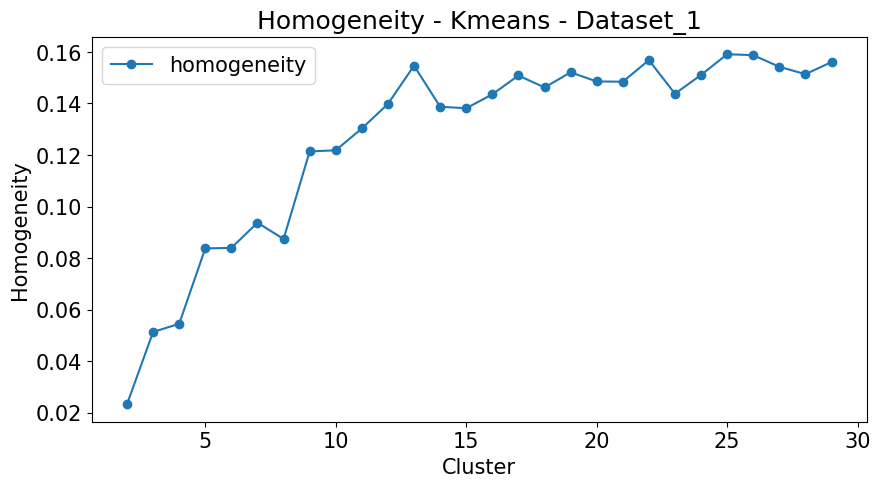

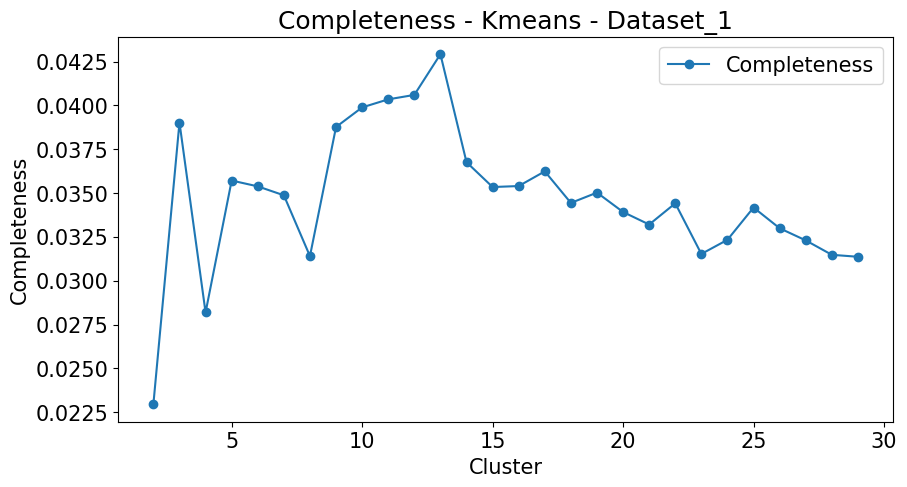

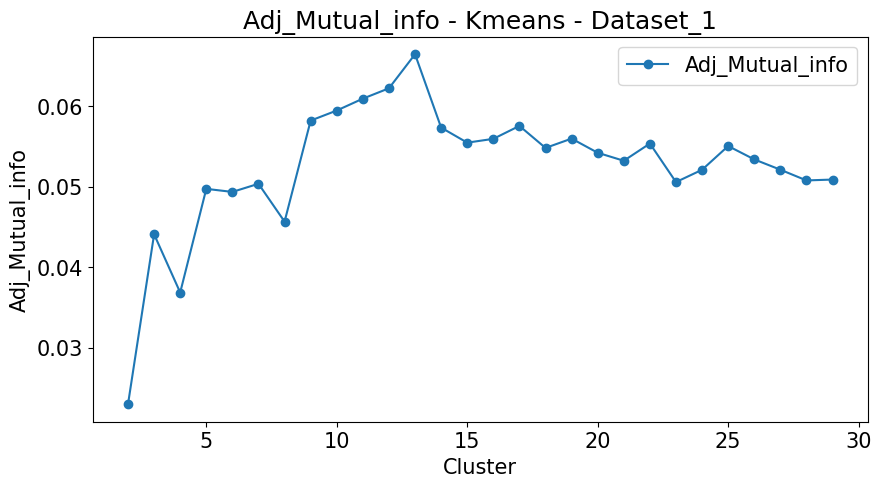

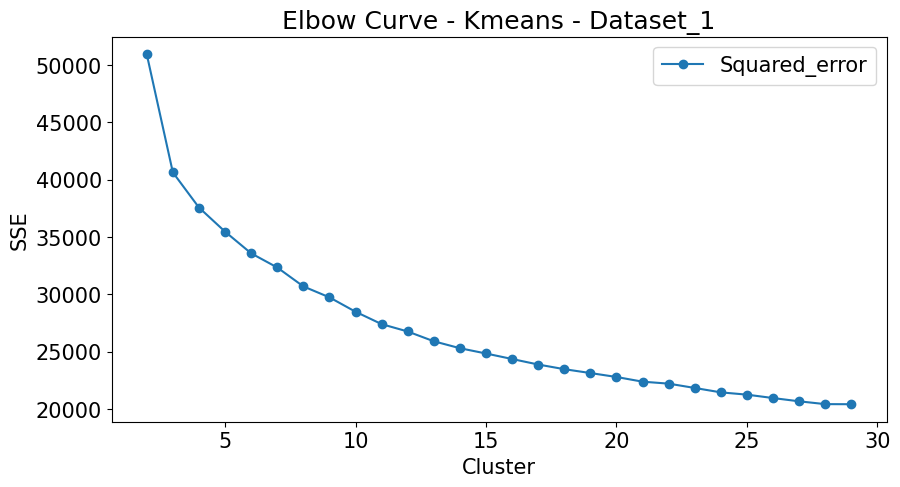

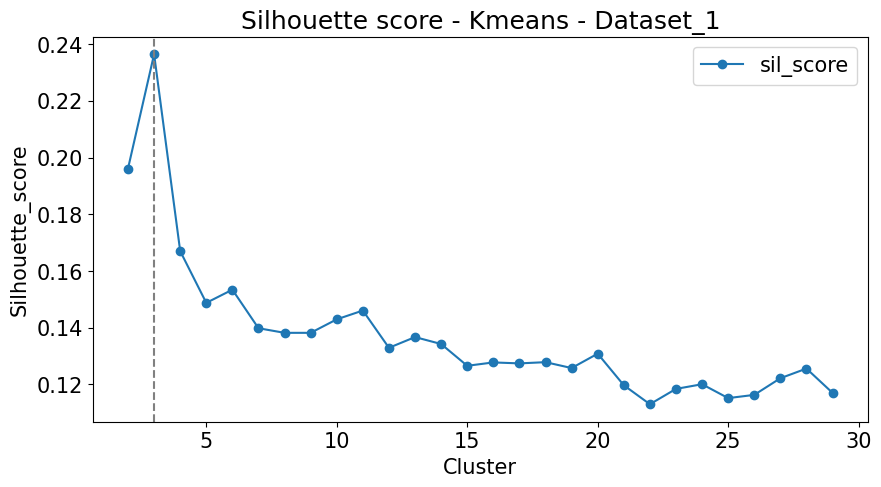

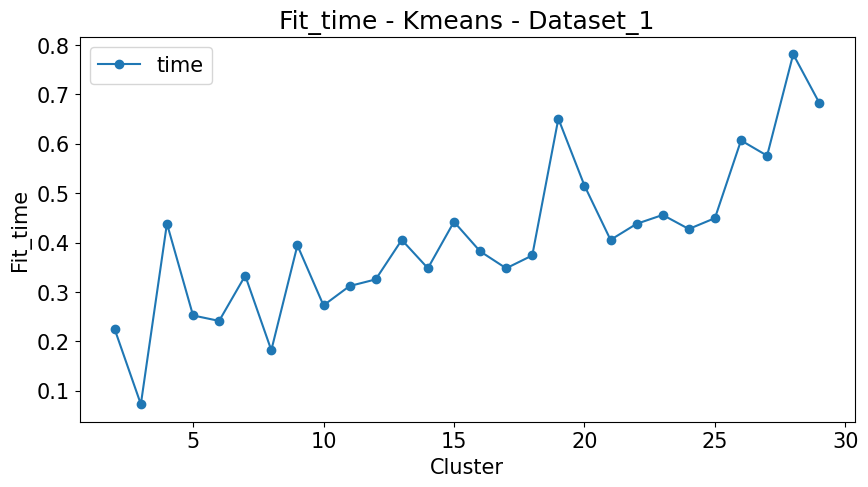

In [969]:
#dataset_1.Clustring_without_dim_red = dict({})


dataset_1.Clustring_without_dim_red['Kmeans']= run_kmeans(dataset=dataset_1,
                                                          cluster_list =np.arange(2,30,1),
                                                          random_state= 42,
                                                          n_init=10, 
                                                          return_labels = True,misc = '',
                                                          plot_config = {'figsize' :[10,5]},
                                                         Dataset_name = 'Dataset_1'
                                                         )
    


#### 4.1.1.b Dataset 2

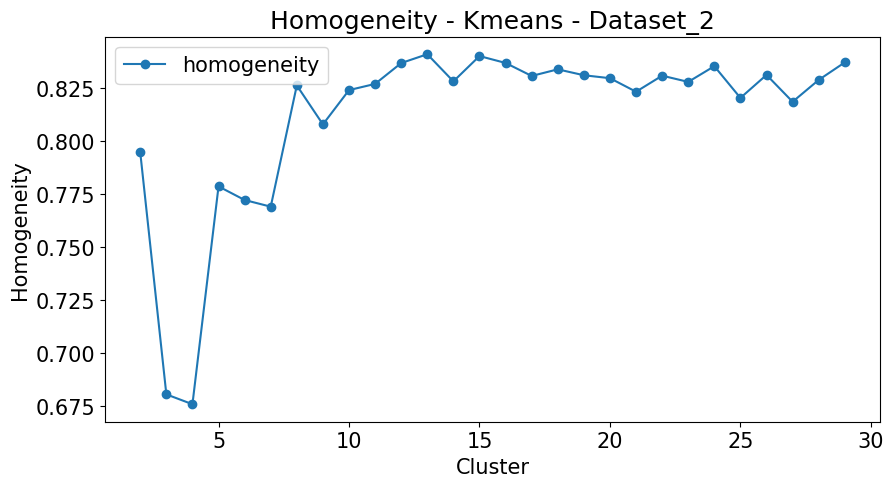

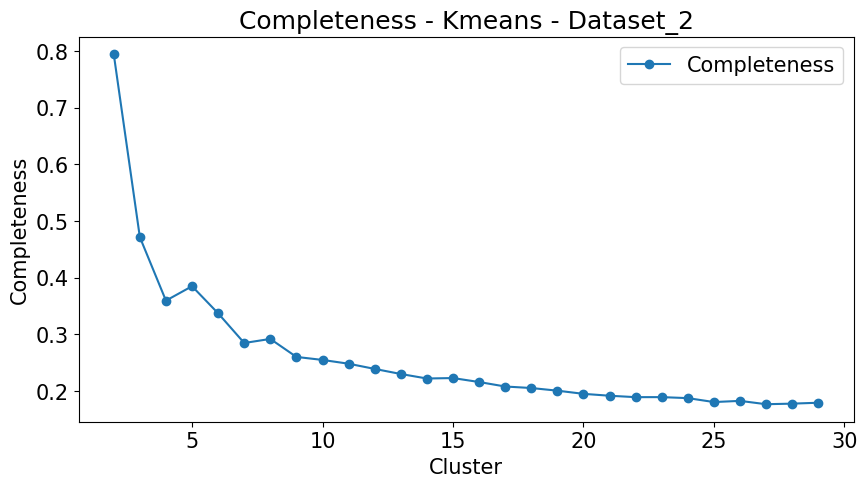

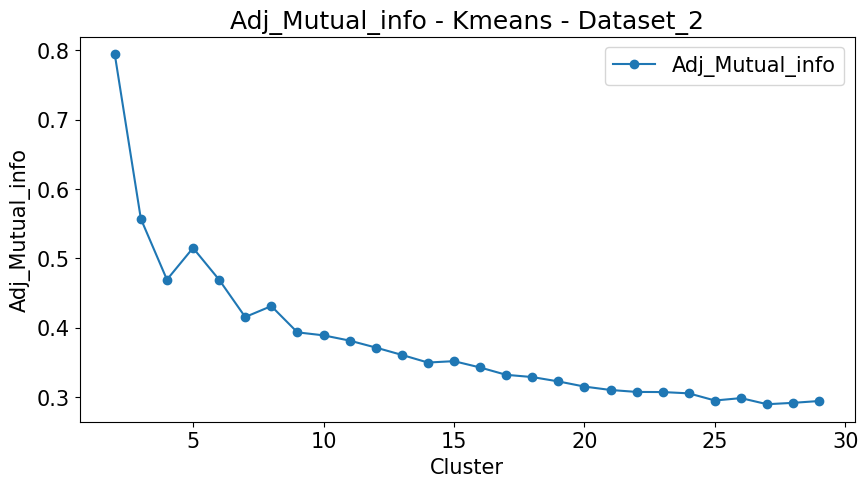

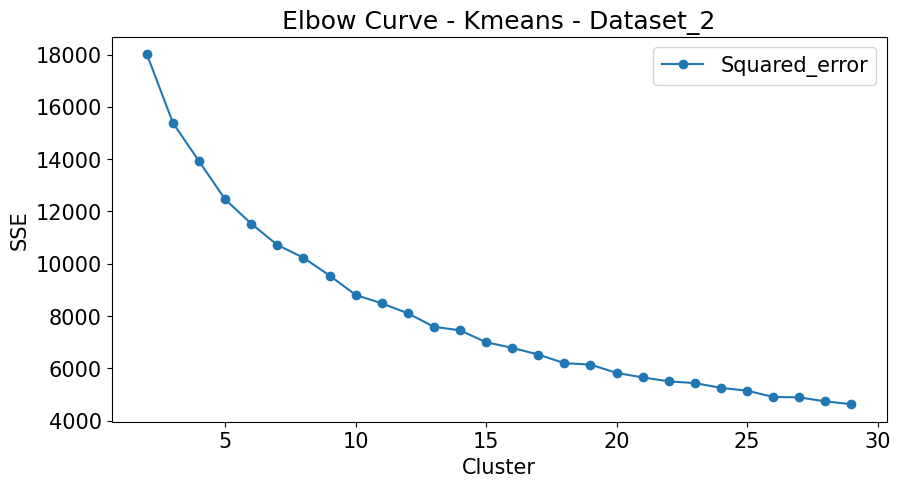

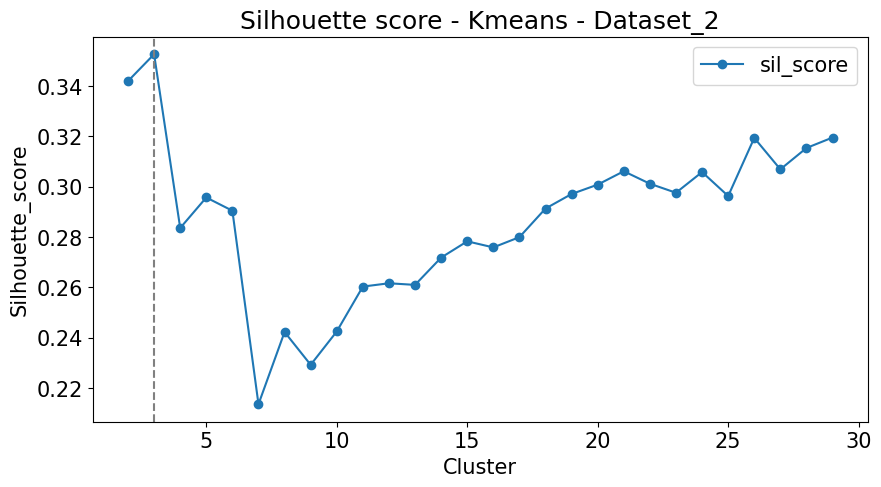

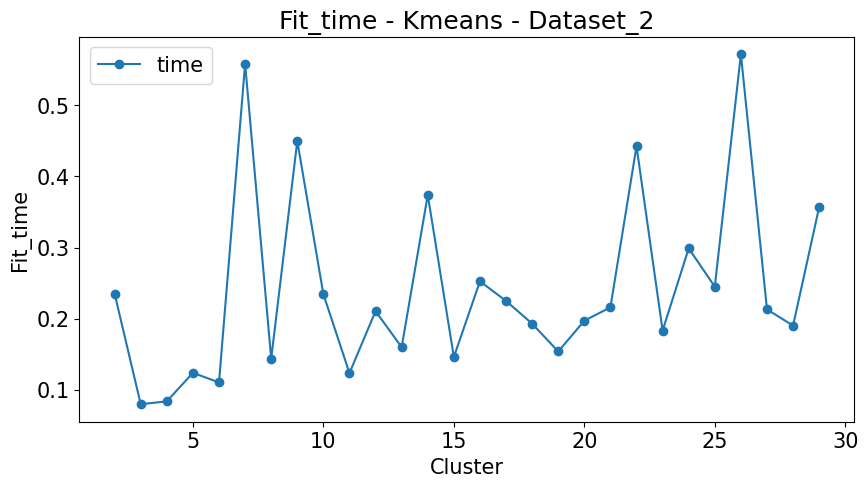

In [970]:



dataset_2.Clustring_without_dim_red['Kmeans']= run_kmeans(dataset=dataset_2,
                                                          cluster_list =np.arange(2,30,1),
                                                          random_state= 42,
                                                          n_init=10, 
                                                          return_labels = True,misc = '',
                                                          plot_config = {'figsize' :[10,5]}
                                                         
                                                         ,Dataset_name = 'Dataset_2'
                                                         )



    

#### Create Combined visualization

/var/folders/vq/040zg8m163g9p8bh9v8lz33m0000gn/T/ipykernel_49889/197975845.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_list_kmeans_dim_red[j]['dataset_1'].rename(columns = {j:'dataset_1'},inplace = True)
/var/folders/vq/040zg8m163g9p8bh9v8lz33m0000gn/T/ipykernel_49889/197975845.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_list_kmeans_dim_red[j]['dataset_2'].rename(columns = {j:'dataset_2'},inplace = True)
/var/folders/vq/040zg8m163g9p8bh9v8lz33m0000gn/T/ipykernel_49889/197975845.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in t

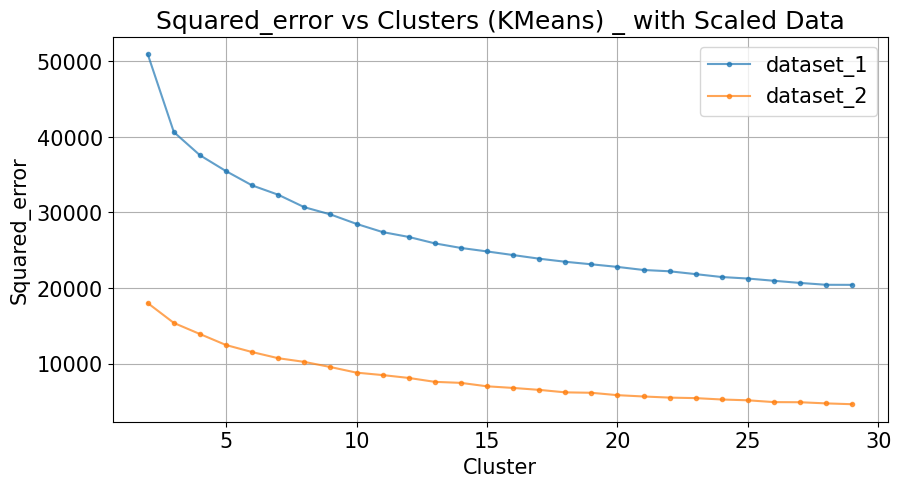

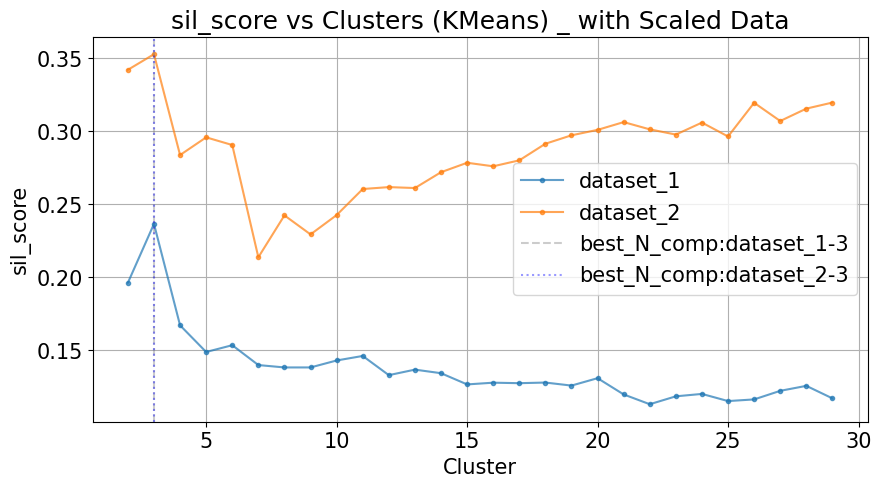

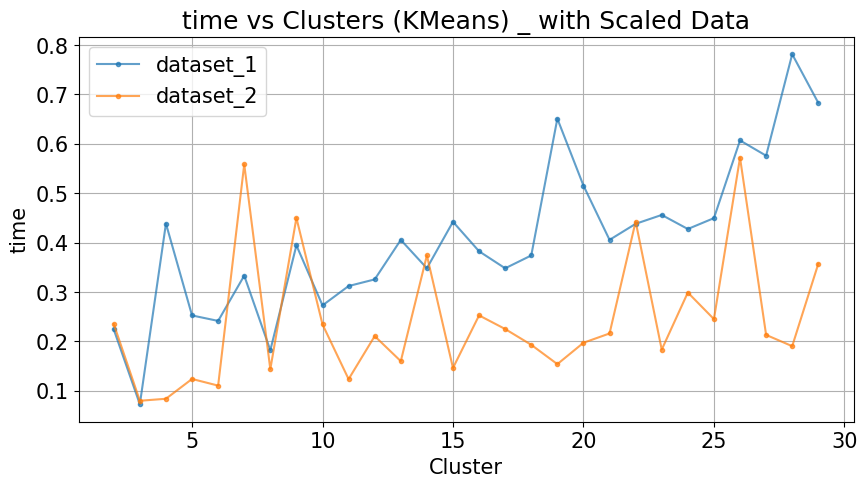

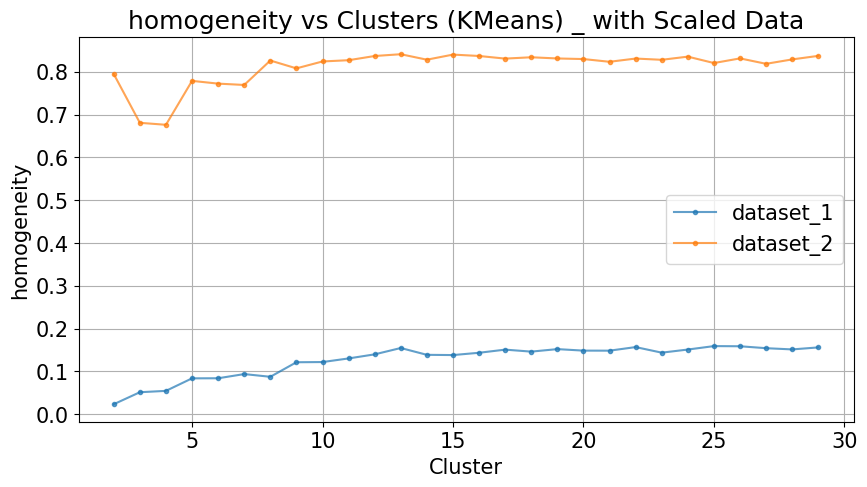

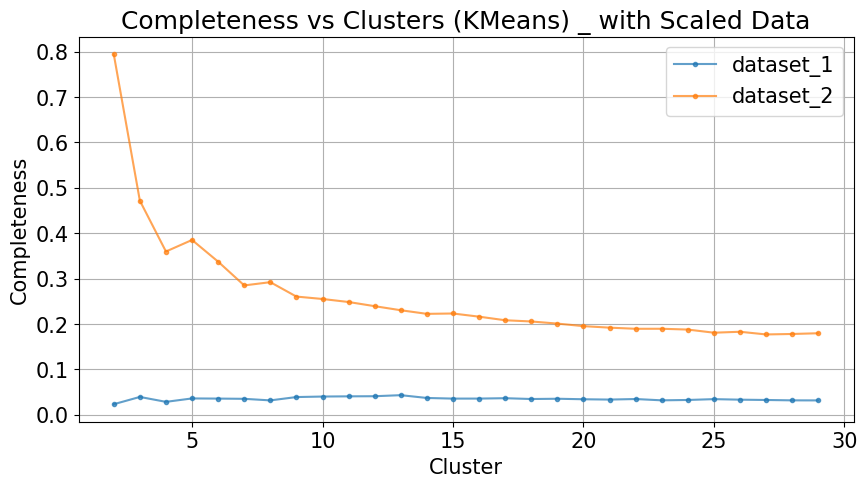

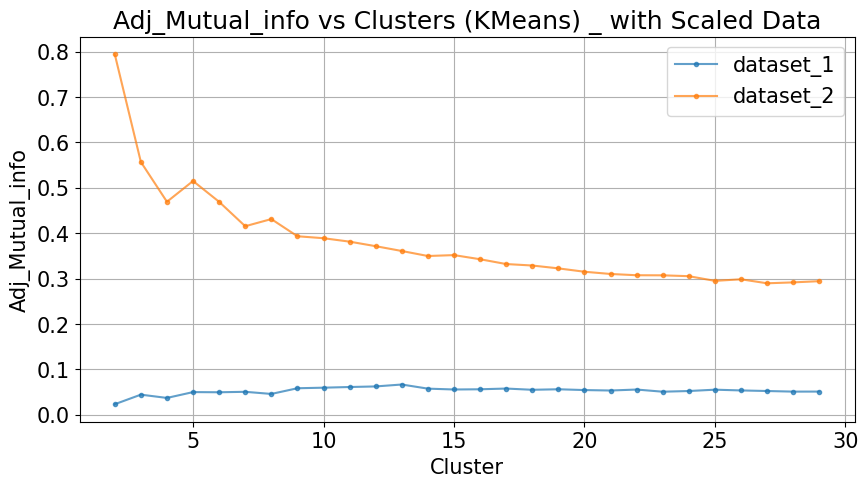

In [1271]:


    
    
df_list_kmeans_dim_red = {
i:dict()
for i in dataset_1.Clustring_without_dim_red['Kmeans']['score_df'].columns if i != 'Cluster'

}

#for i in dataset_1.Clustring_without_dim_red['Kmeans'].keys():

    
#dataset 1    
    
for j in df_list_kmeans_dim_red.keys():



    df_list_kmeans_dim_red[j]['dataset_1'] = dataset_1.Clustring_without_dim_red['Kmeans']['score_df'][[j,'Cluster']]



    #display(df_list_kmeans_dim_red[j][i]['Cluster'].head())
    df_list_kmeans_dim_red[j]['dataset_1'].set_index('Cluster', inplace = True)
    df_list_kmeans_dim_red[j]['dataset_1'].rename(columns = {j:'dataset_1'},inplace = True)


    df_list_kmeans_dim_red[j]['dataset_2'] = dataset_2.Clustring_without_dim_red['Kmeans']['score_df'][[j,'Cluster']]



    #display(df_list_kmeans_dim_red[j][i]['Cluster'].head())
    df_list_kmeans_dim_red[j]['dataset_2'].set_index('Cluster', inplace = True)
    df_list_kmeans_dim_red[j]['dataset_2'].rename(columns = {j:'dataset_2'},inplace = True)






for j in df_list_kmeans_dim_red.keys():


    fig, ax = plt.subplots()

    
    title = j + ' vs ' + 'Clusters (KMeans) _ with Scaled Data'
    
    df__ = pd.concat(list(df_list_kmeans_dim_red[j].values()),axis =1)
    
    df__.plot(

    marker = '.', grid = True, ylabel = j, title = title, ax = ax , alpha = 0.7,
        figsize = [10,5]
    )
    
    if j == 'sil_score':
        for l,k in enumerate(df__.columns):
            b = df__[k].idxmax()
            ax.axvline(x=b,
                       #linestyle='--',
                       label ='best_N_comp:', c=color[l],alpha =0.4,
                       linestyle=linestyle[l])
        
            legend.append('best_N_comp:'+k+'-'+str(b))
        
        
        ax.legend( legend)
            
    
    
    plt.show()
    
    save_loss_curve(fig,title)
    
    

### 4.1.2 Expectation maximization

#### 4.1.2.a Dataset 1

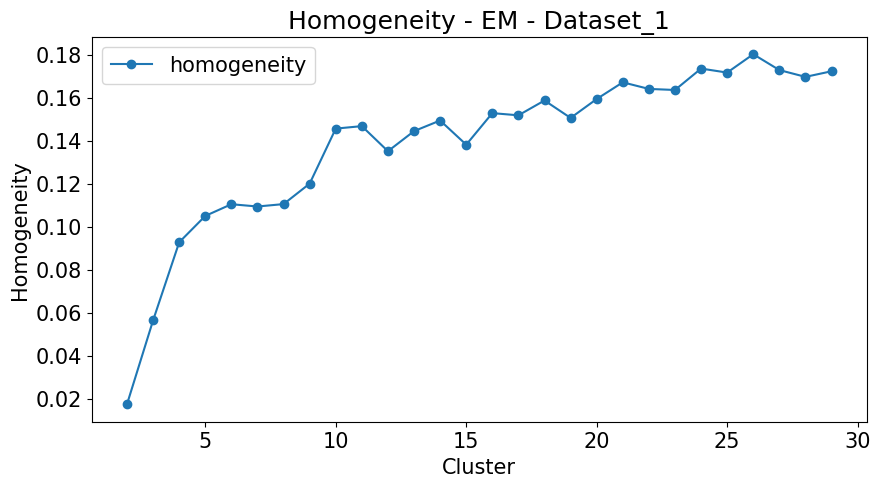

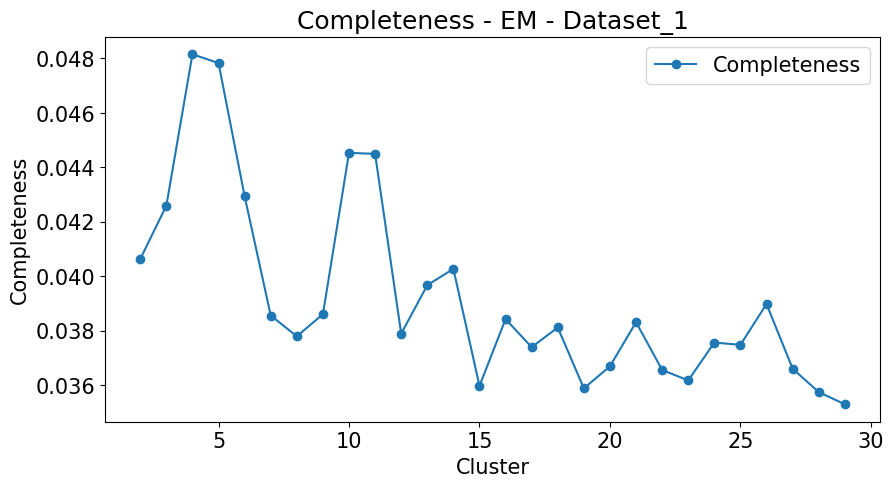

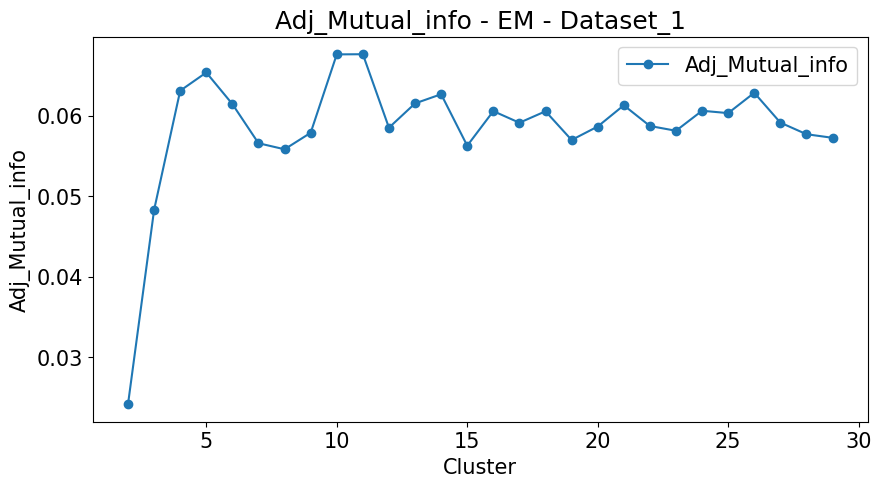

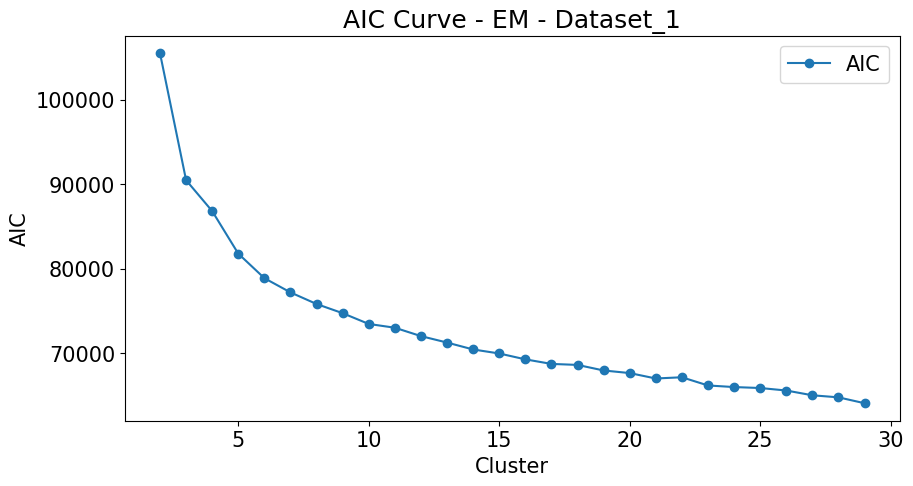

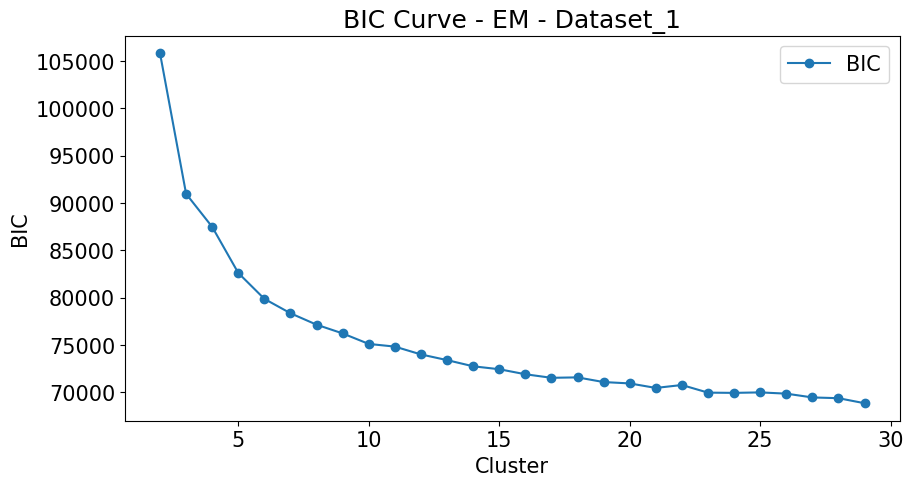

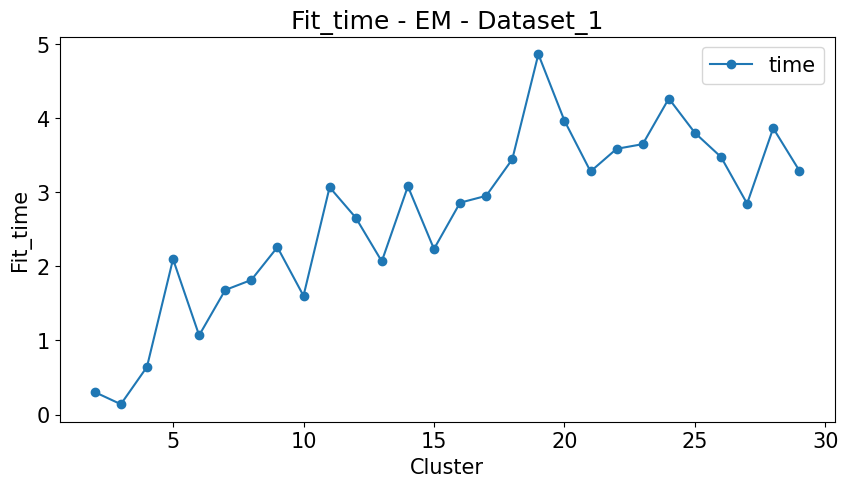

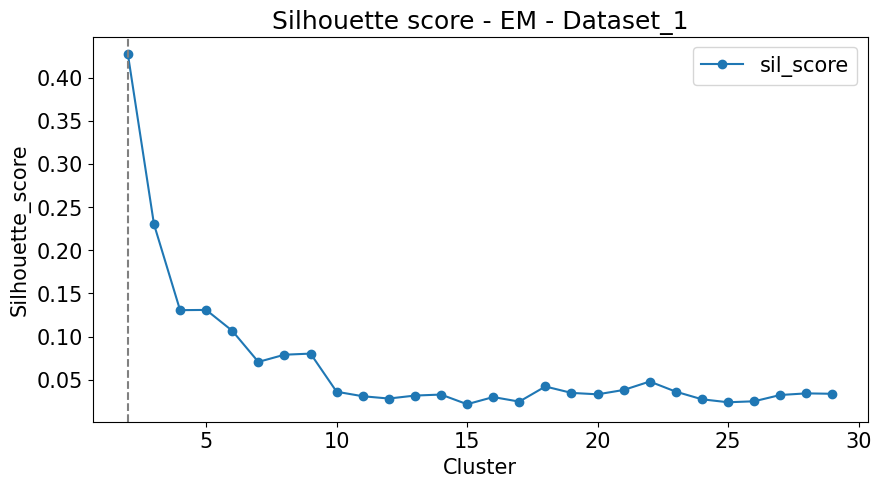

In [971]:



dataset_1.Clustring_without_dim_red['EM']= run_EM(dataset=dataset_1,
                                                          cluster_list =np.arange(2,30,1),
                                                          random_state= 42,
                                                          n_init=10, 
                                                          return_labels = True,misc = '',
                                                          plot_config = {'figsize' :[10,5]},
                                                         Dataset_name = 'Dataset_1',EM_params = dict(reg_covar = 1e-5)
                                                         )
    


#### 4.1.2.b Dataset 2

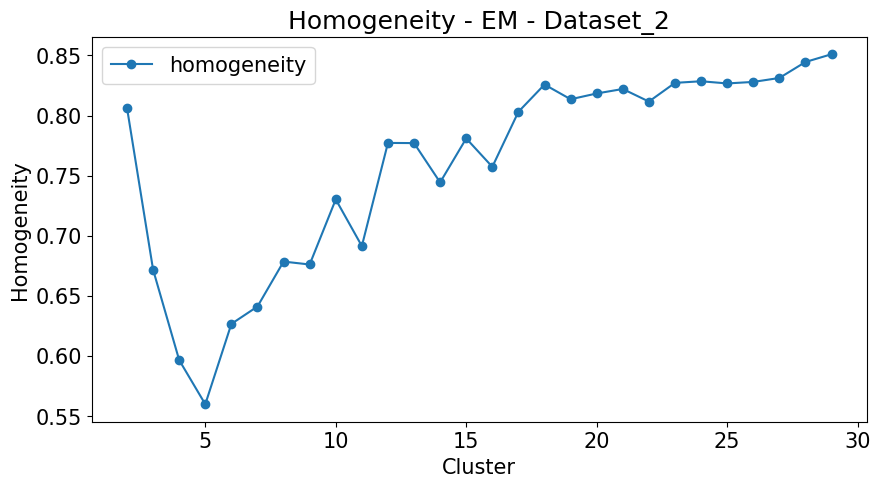

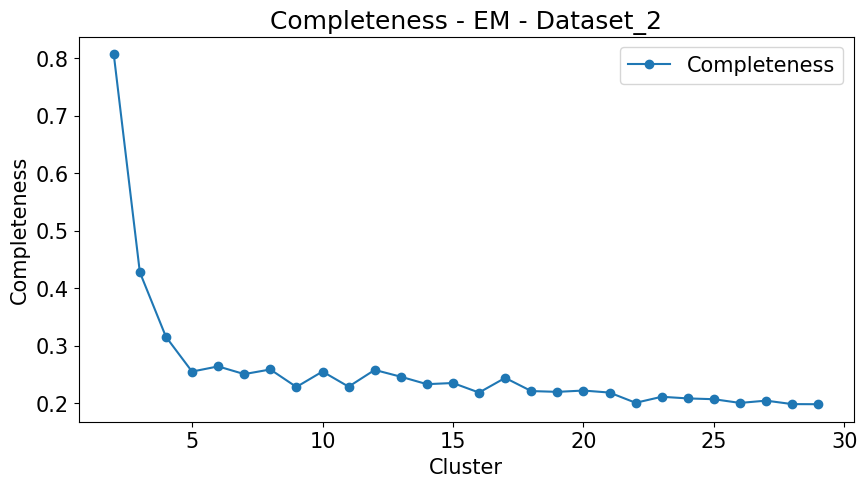

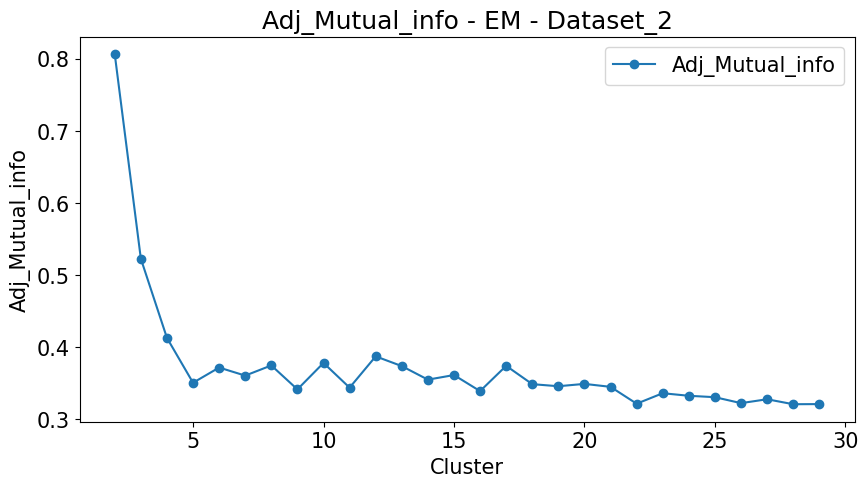

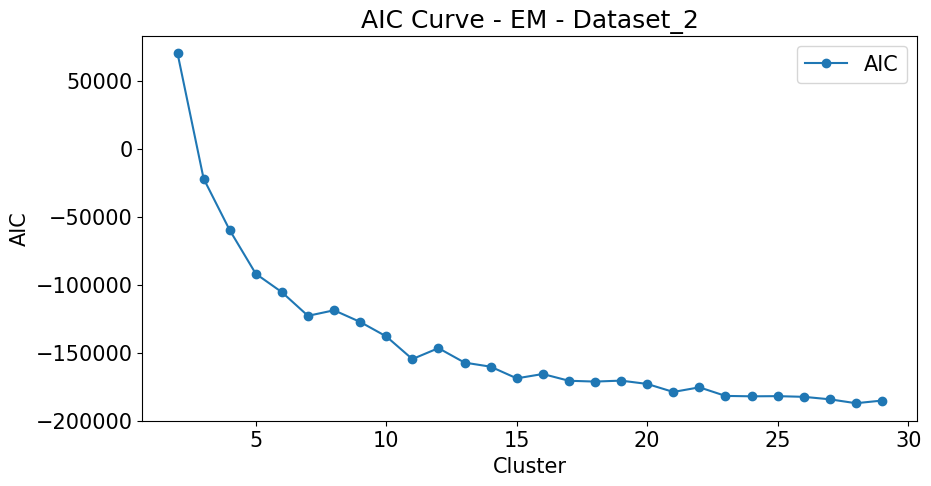

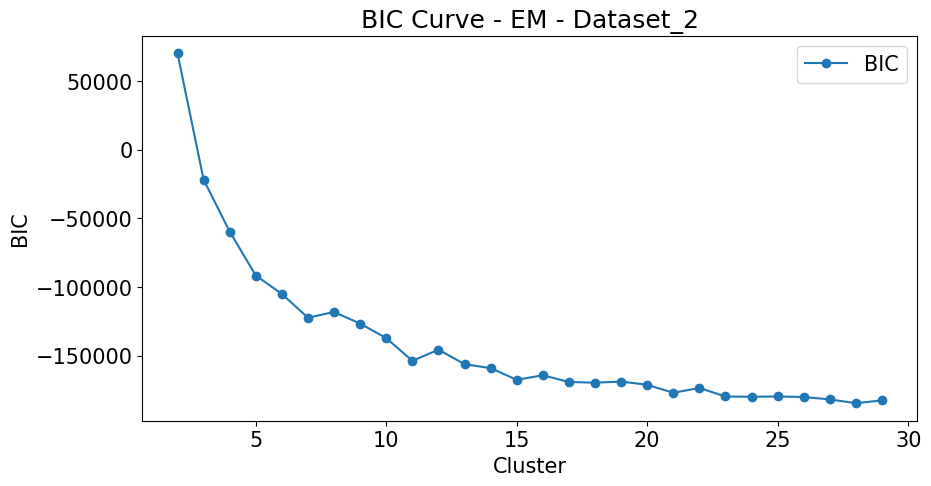

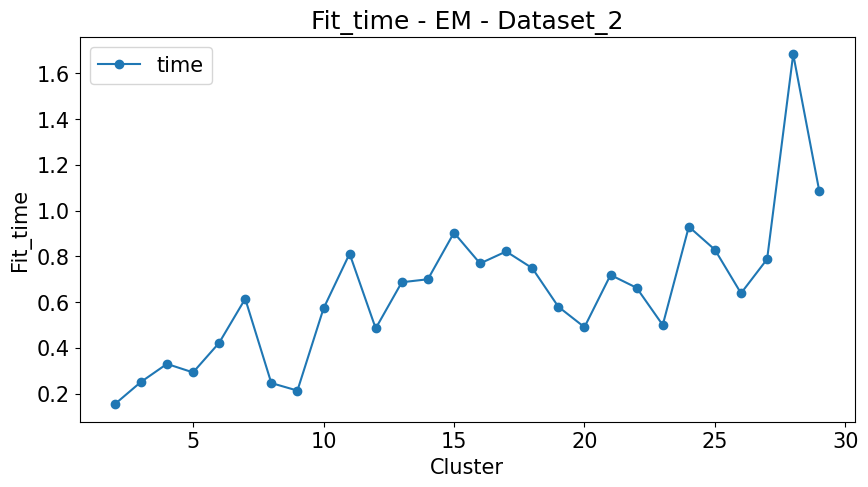

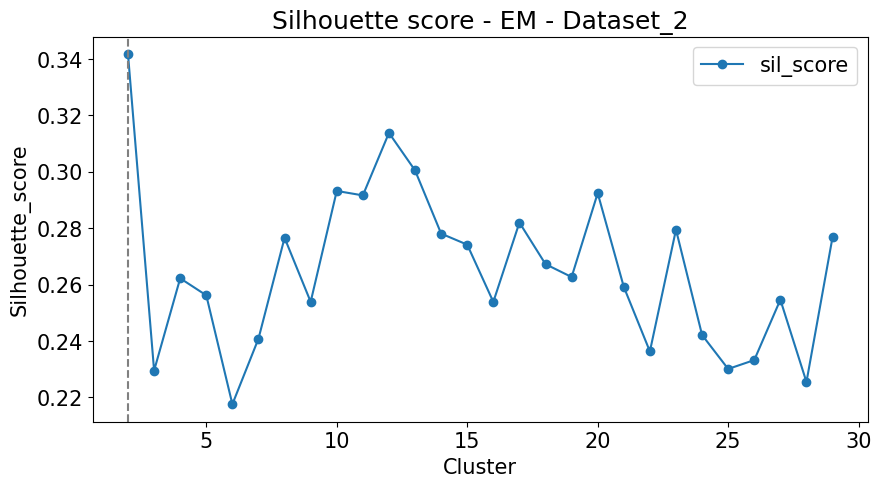

In [972]:



dataset_2.Clustring_without_dim_red['EM']= run_EM(dataset=dataset_2,
                                                          cluster_list =np.arange(2,30,1),
                                                          random_state= 42,
                                                          n_init=10, 
                                                          return_labels = True,misc = '',
                                                          plot_config = {'figsize' :[10,5]},
                                                         Dataset_name = 'Dataset_2'
                                                         )
    


#### Create Combined visualization

/var/folders/vq/040zg8m163g9p8bh9v8lz33m0000gn/T/ipykernel_49889/363660122.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_list_EM_dim_red[j]['dataset_1'].rename(columns = {j:'dataset_1'},inplace = True)
/var/folders/vq/040zg8m163g9p8bh9v8lz33m0000gn/T/ipykernel_49889/363660122.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_list_EM_dim_red[j]['dataset_2'].rename(columns = {j:'dataset_2'},inplace = True)
/var/folders/vq/040zg8m163g9p8bh9v8lz33m0000gn/T/ipykernel_49889/363660122.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docum

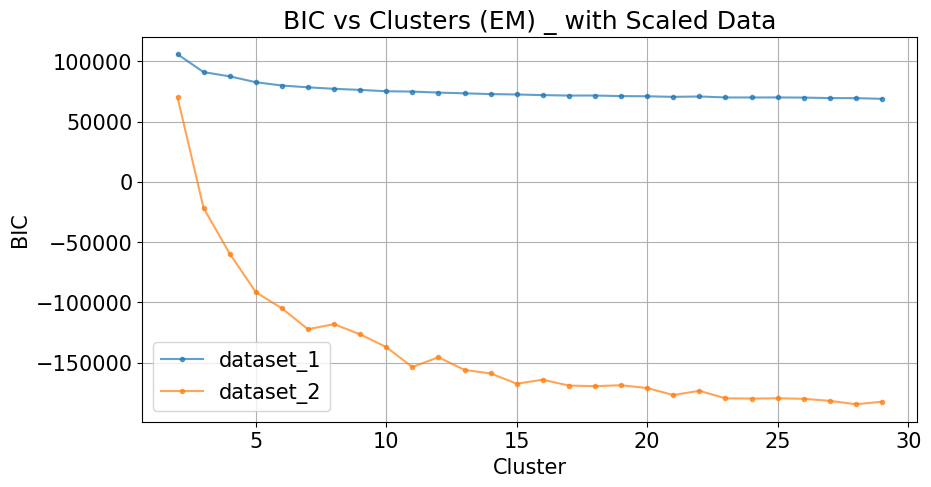

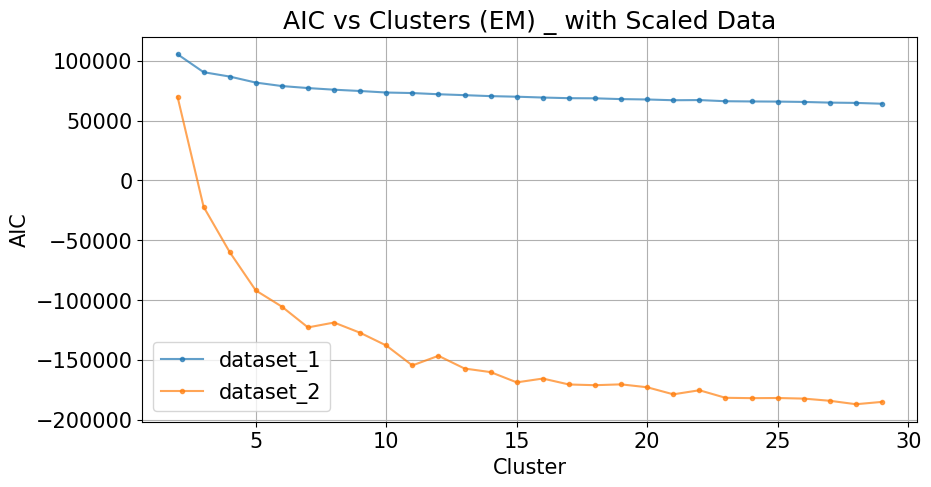

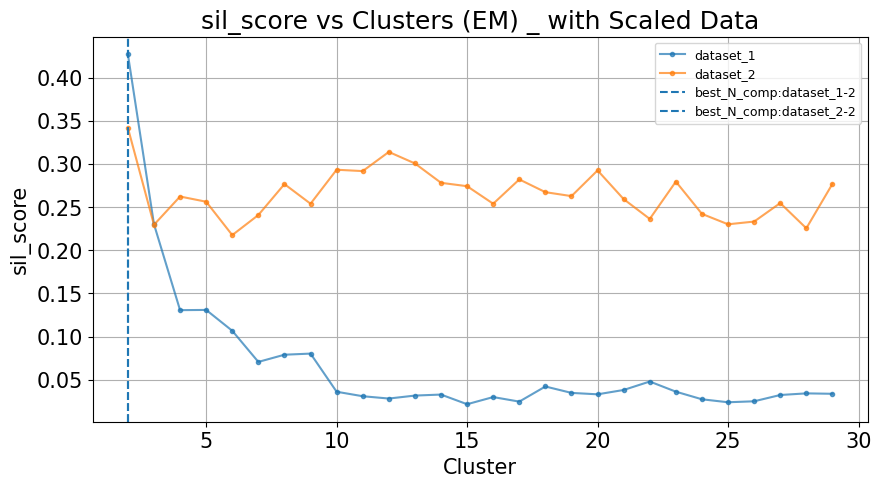

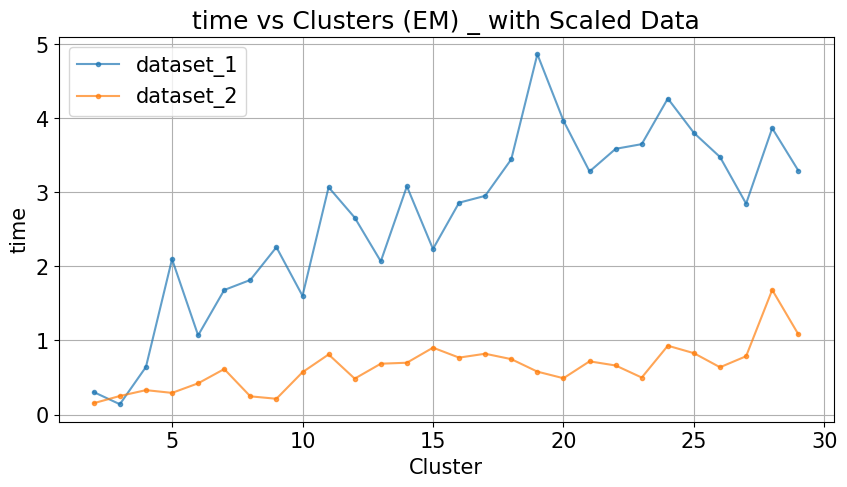

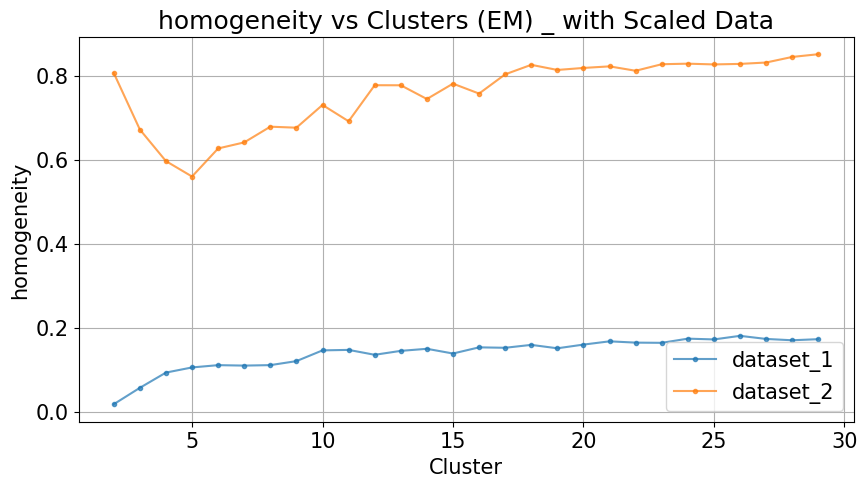

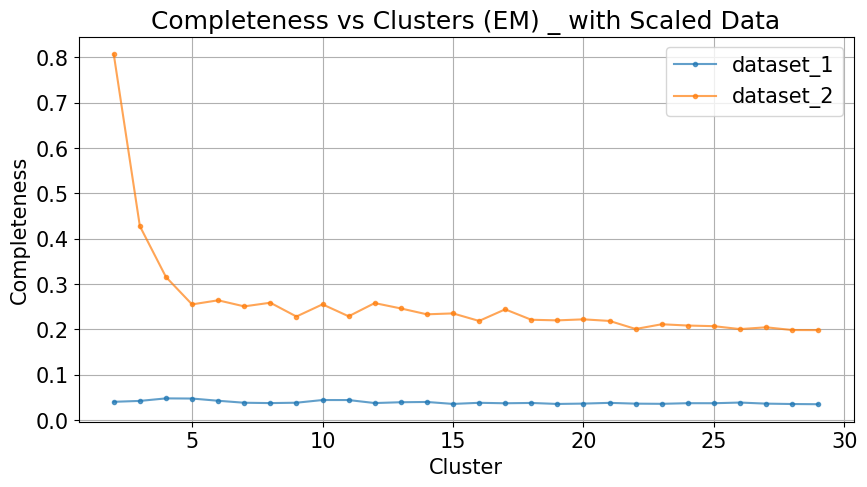

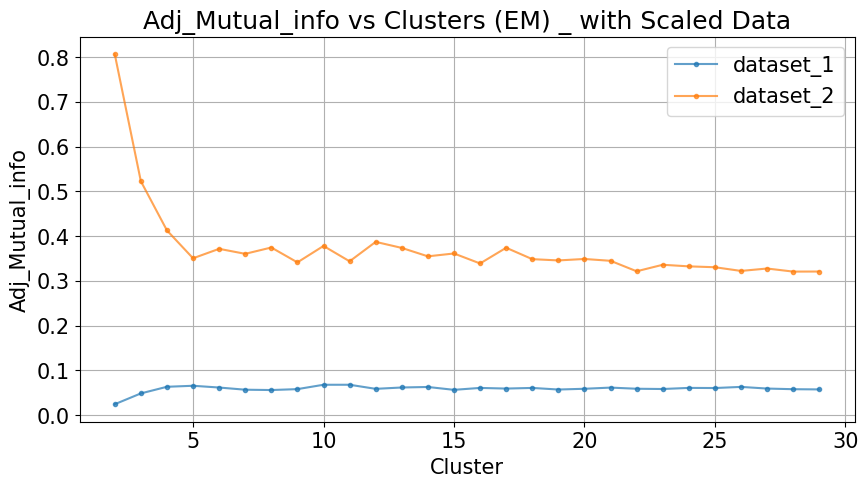

In [1270]:

df_list_EM_dim_red = {
i:dict()
for i in dataset_1.Clustring_without_dim_red['EM']['score_df'].columns if i != 'Cluster'

}

#for i in dataset_1.Clustring_without_dim_red['Kmeans'].keys():

    
#dataset 1    
    
for j in df_list_EM_dim_red.keys():



    df_list_EM_dim_red[j]['dataset_1'] = dataset_1.Clustring_without_dim_red['EM']['score_df'][[j,'Cluster']]



    #display(df_list_kmeans_dim_red[j][i]['Cluster'].head())
    df_list_EM_dim_red[j]['dataset_1'].set_index('Cluster', inplace = True)
    df_list_EM_dim_red[j]['dataset_1'].rename(columns = {j:'dataset_1'},inplace = True)


    df_list_EM_dim_red[j]['dataset_2'] = dataset_2.Clustring_without_dim_red['EM']['score_df'][[j,'Cluster']]



    #display(df_list_kmeans_dim_red[j][i]['Cluster'].head())
    df_list_EM_dim_red[j]['dataset_2'].set_index('Cluster', inplace = True)
    df_list_EM_dim_red[j]['dataset_2'].rename(columns = {j:'dataset_2'},inplace = True)






for j in df_list_EM_dim_red.keys():


    fig, ax = plt.subplots()

    
    title = j + ' vs ' + 'Clusters (EM) _ with Scaled Data'
    
    df__ = pd.concat(list(df_list_EM_dim_red[j].values()),axis =1)
    
    df__.plot(

    marker = '.', grid = True, ylabel = j, title = title, ax = ax , alpha = 0.7,
        figsize = [10,5]
    )
    
    legend = list(df__.columns.values)
    if j == 'sil_score':
        for k in df__.columns:
            b = df__[k].idxmax()
            ax.axvline(x=b,
                       linestyle='--',label ='best_N_comp:')
        
            legend.append('best_N_comp:'+k+'-'+str(b))
        
        
        ax.legend( legend,fontsize = 9)
            
    
    
    plt.show()
    
    save_loss_curve(fig,title)
    

### Create Combined visualization : Kmeans + EM

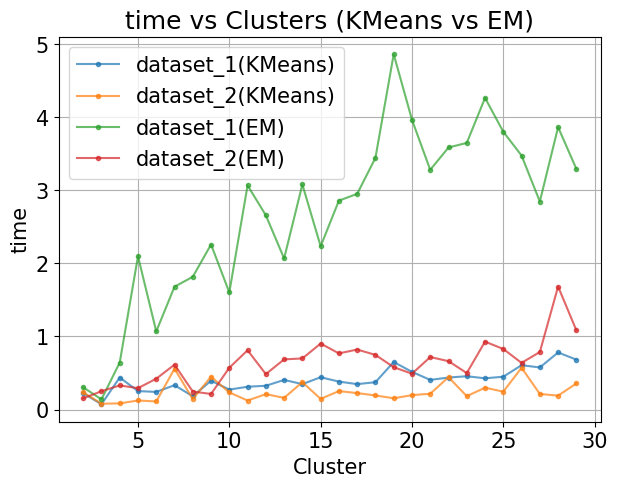

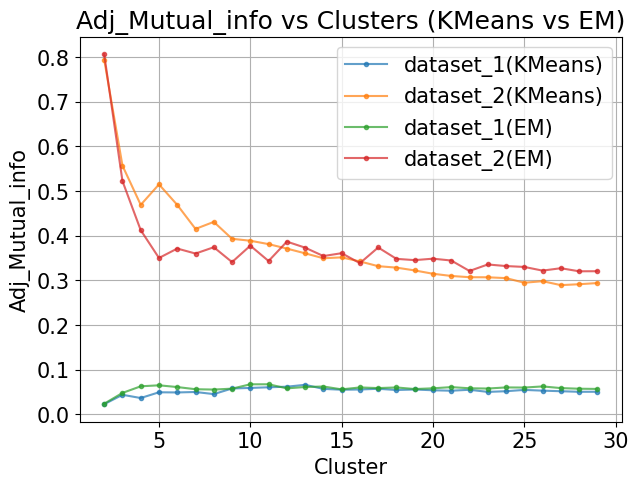

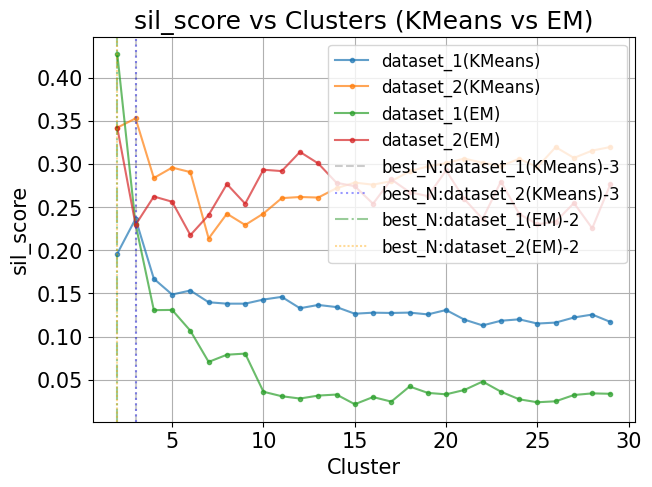

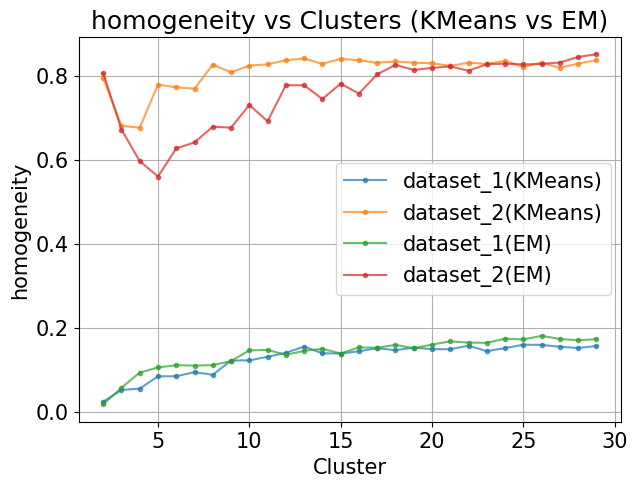

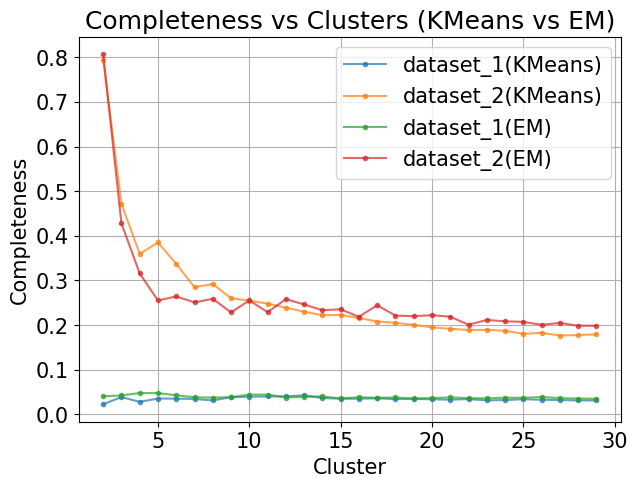

In [1274]:

color = ['grey','blue','green','orange']
linestyle = ['--',':','-.',(0, (1, 1))]

for j in set(df_list_kmeans_dim_red.keys()) & set(df_list_EM_dim_red.keys()):


    fig, ax = plt.subplots()

    
    title = j + ' vs ' + 'Clusters (KMeans vs EM)'# _ with Scaled Data'
    
    df__ = pd.concat(list(df_list_kmeans_dim_red[j].values()),axis =1)
    
    df__.columns = [i + '(KMeans)' for i in df__.columns]
    

    df__2 = pd.concat(list(df_list_EM_dim_red[j].values()),axis =1)
    
    df__2.columns = [i + '(EM)' for i in df__2.columns]    
    
    df__ = pd.concat([df__,df__2],axis =1)
    
    
    
    
    df__.plot(

    marker = '.', grid = True, ylabel = j, title = title, ax = ax , alpha = 0.7,
        figsize = [7,5]
    )
    
    legend = list(df__.columns.values)
    
    
    
    
    if j == 'sil_score':
        for l,k in enumerate(df__.columns):
            b = df__[k].idxmax()
            ax.axvline(x=b,
                       #linestyle='--',
                       label ='best_N:', c=color[l],alpha =0.4,
                       linestyle=linestyle[l])
        
            legend.append('best_N:'+k+'-'+str(b))
        
        
        ax.legend( legend,fontsize = 12)
            
    
    
    plt.show()
    
    save_loss_curve(fig,title)

## 4.2 Dimentionality reduction

### 4.2.1 PCA

#### 4.2.1.a Dataset 1

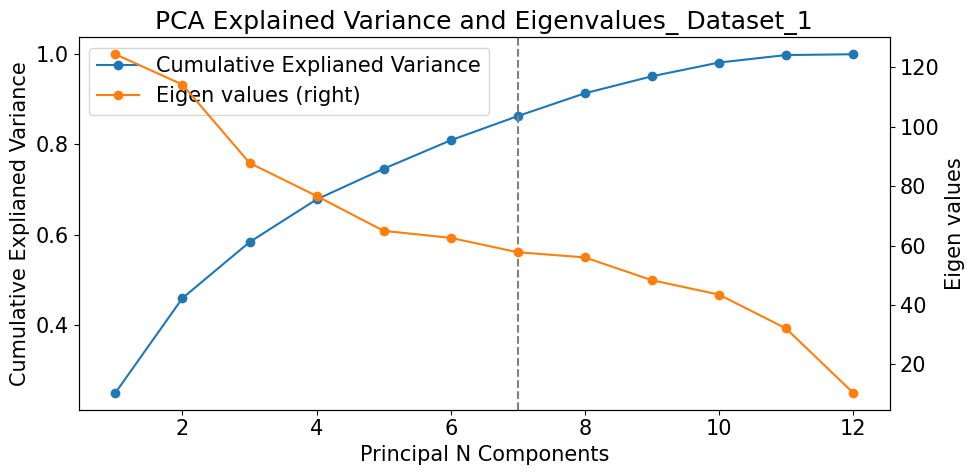

In [490]:



dataset_1.Dim_red['PCA']= run_PCA(dataset=dataset_1,train = 'X_train_scaled',
               test = 'X_test_scaled',random_state= 42,misc = '',plot_config = {'figsize' :[10,5],'marker':'o'},
                Dataset_name = 'Dataset_1'
                                                         )
    


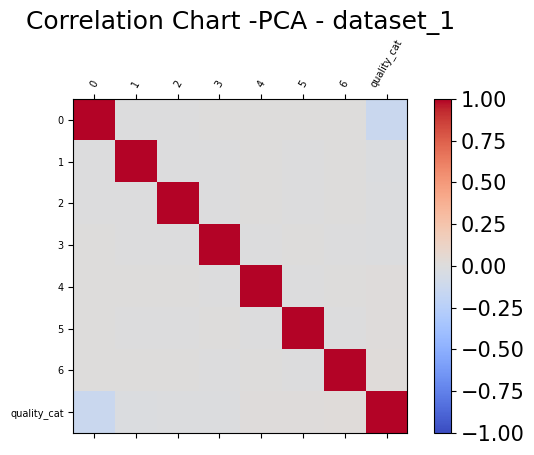

In [1060]:
create_corr_graphs(dataset=dataset_1, train='X_train_pca_sel', dataset_name = 'dataset_1',algo = 'PCA')

#### 4.2.1.b Dataset 2

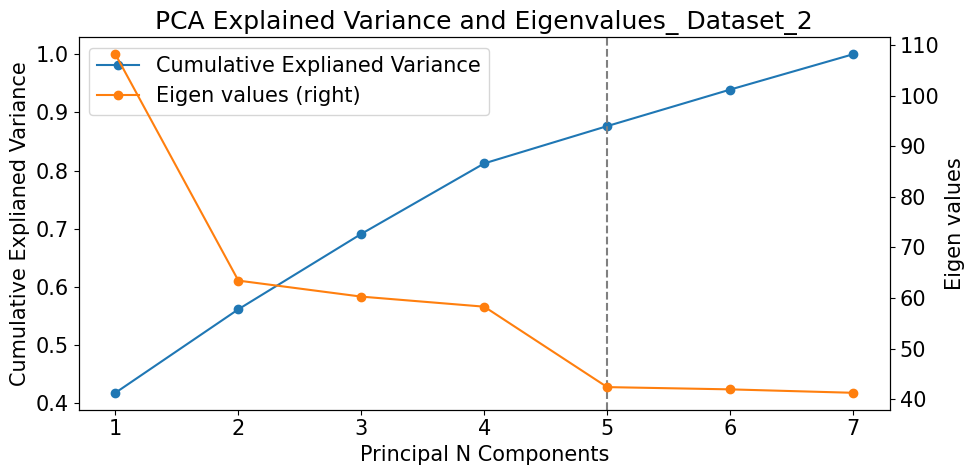

In [491]:




dataset_2.Dim_red['PCA']= run_PCA(dataset=dataset_2,train = 'X_train_scaled',
               test = 'X_test_scaled',random_state= 42,misc = '',plot_config = {'figsize' :[10,5]
                                                                               ,'marker':'o'},
                Dataset_name = 'Dataset_2'
                                                         )
    

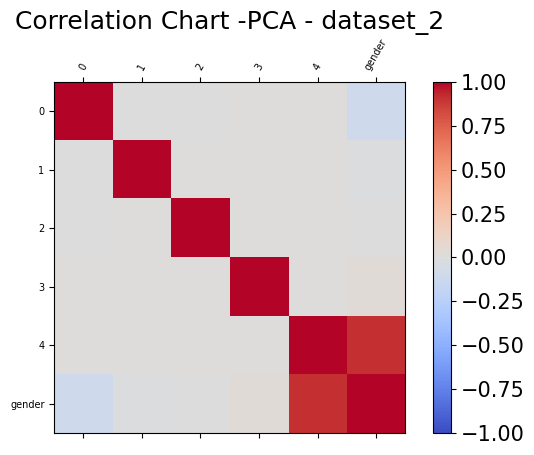

In [1061]:


create_corr_graphs(dataset=dataset_2, train='X_train_pca_sel', dataset_name = 'dataset_2',algo = 'PCA')

### 4.2.2 ICA

#### 4.2.2.a Dataset 1

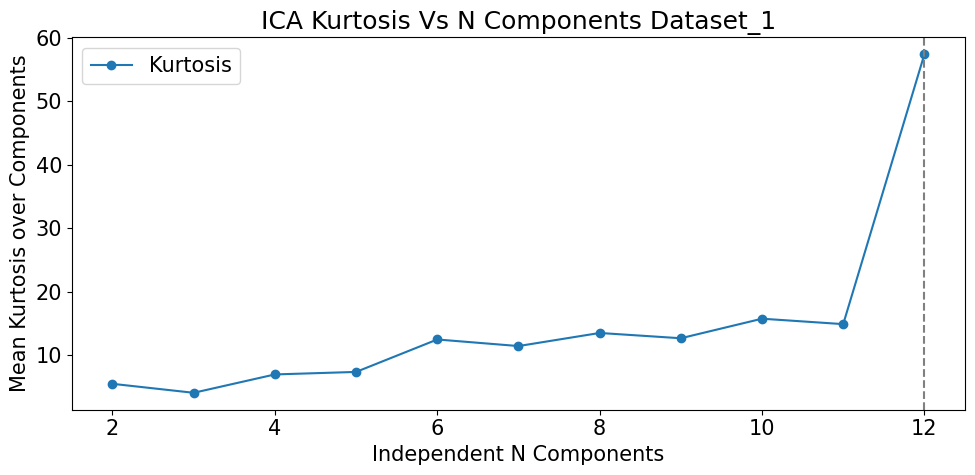

In [576]:

dataset_1.Dim_red['ICA']= run_ICA(dataset=dataset_1,train = 'X_train_scaled',
               test = 'X_test_scaled',random_state= 42,misc = '',plot_config = {'figsize' :[10,5]
                                                                               ,'marker':'o'},
                Dataset_name = 'Dataset_1'
                                                         )

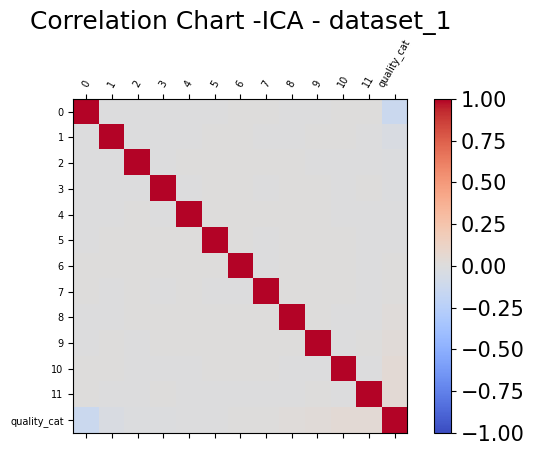

In [1062]:


create_corr_graphs(dataset=dataset_1, train='X_train_ica', dataset_name = 'dataset_1',algo = 'ICA')


In [ ]:
dataset_1.save()

#### 4.2.2.b Dataset 2

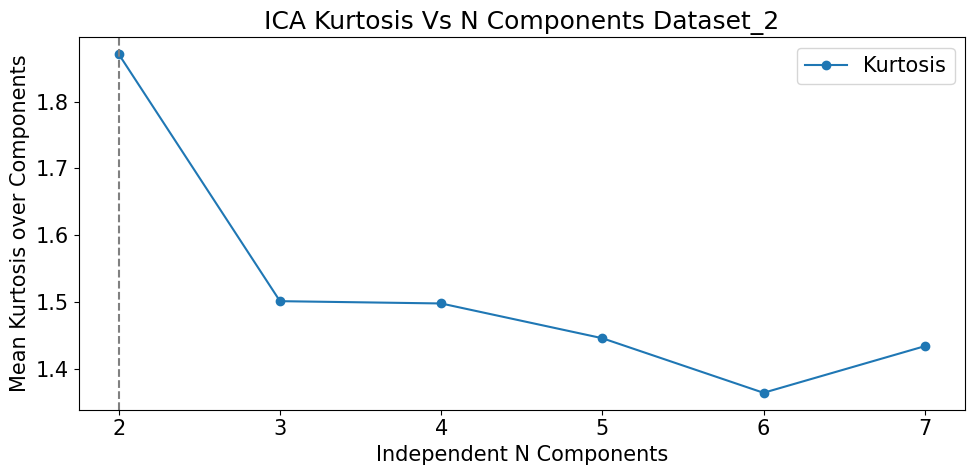

In [577]:
dataset_2.Dim_red['ICA']= run_ICA(dataset=dataset_2,train = 'X_train_scaled',
               test = 'X_test_scaled',random_state= 42,misc = '',plot_config = {'figsize' :[10,5]
                                                                               ,'marker':'o'},
                Dataset_name = 'Dataset_2'
                                                         )

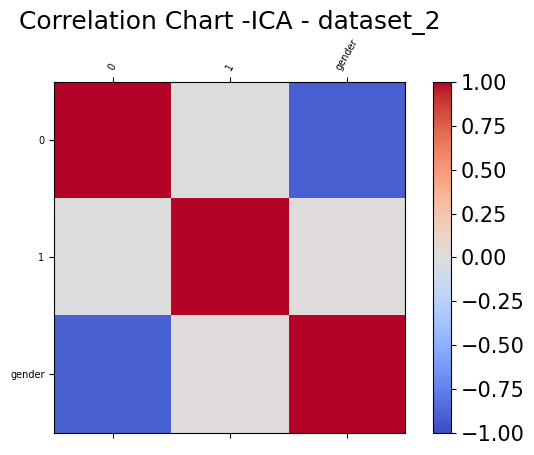

In [1063]:


create_corr_graphs(dataset=dataset_2, train='X_train_ica', dataset_name = 'dataset_2',algo = 'ICA')


In [314]:
dataset_2.save()

### 4.2.3 RPA

#### 4.2.3.a Dataset 1

0     1.000000
1     0.885277
2     0.795732
3     0.676080
4     0.566803
5     0.484688
6     0.389534
7     0.302846
8     0.212323
9     0.099432
10    0.039463
Name: Mean Recon Error, dtype: float32

11 9


Mean Recon Error        1.007854
Recon Error Std         0.186307
Random N Components    11.000000
Name: 9, dtype: float64

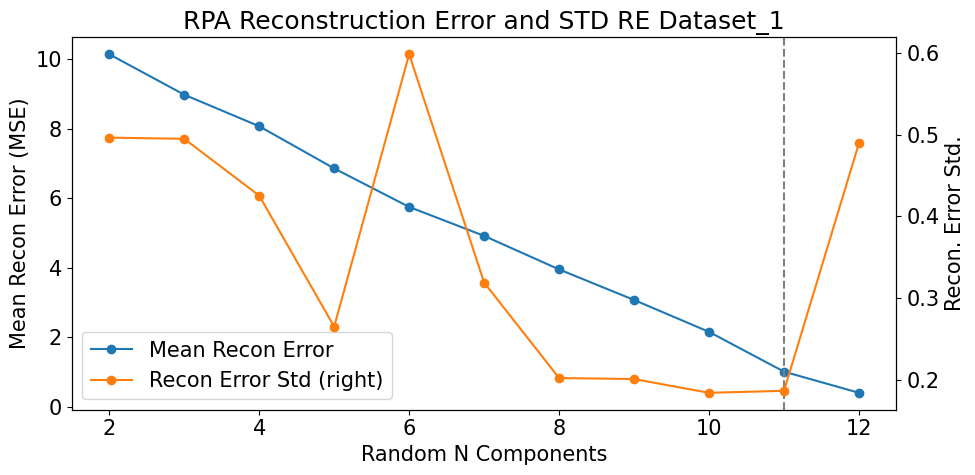

In [578]:
dataset_1.Dim_red['RPA']= run_RPA(dataset=dataset_1,train = 'X_train_scaled',
               test = 'X_test_scaled',random_state= 42,misc = '',plot_config = {'figsize' :[10,5]
                                                                               ,'marker':'o'},
                Dataset_name = 'Dataset_1'
                                                         )


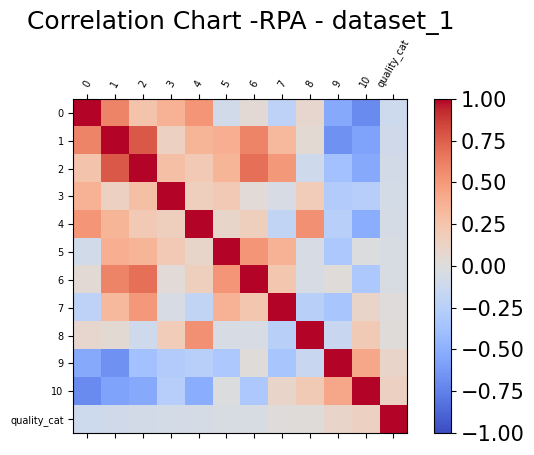

In [1064]:


create_corr_graphs(dataset=dataset_1, train='X_train_rpa', dataset_name = 'dataset_1',algo = 'RPA')


#### 4.2.3.b Dataset 2

0    1.000000
1    0.839842
2    0.635129
3    0.430310
4    0.346754
5    0.157885
Name: Mean Recon Error, dtype: float64

7 5


Mean Recon Error       0.825929
Recon Error Std        0.431006
Random N Components    7.000000
Name: 5, dtype: float64

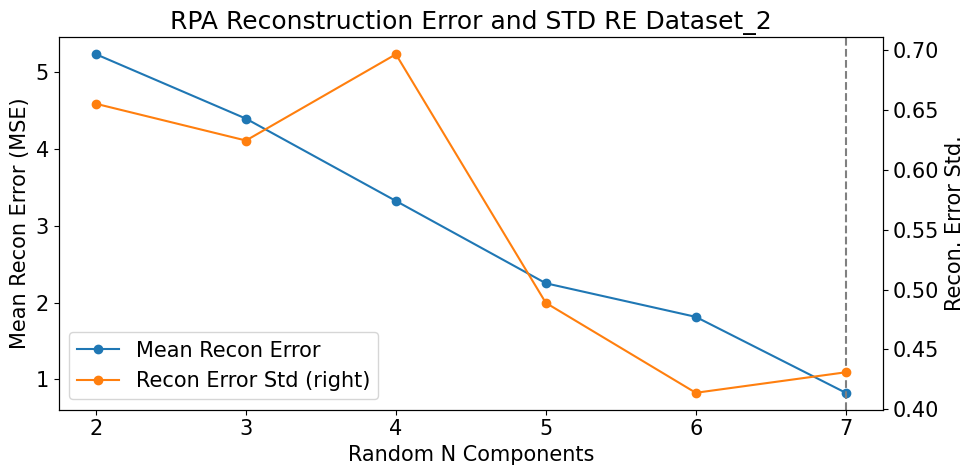

In [579]:
dataset_2.Dim_red['RPA']= run_RPA(dataset=dataset_2,train = 'X_train_scaled',
               test = 'X_test_scaled',random_state= 42,misc = '',plot_config = {'figsize' :[10,5]
                                                                               ,'marker':'o'},
                Dataset_name = 'Dataset_2'
                                                         )

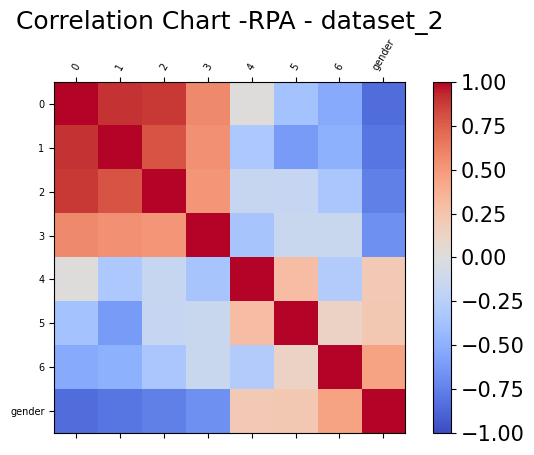

In [1065]:


create_corr_graphs(dataset=dataset_2, train='X_train_rpa', dataset_name = 'dataset_2',algo = 'RPA')


In [1068]:
dataset_1.save()
dataset_2.save()

### 4.2.4 IsoMap

#### 4.2.4.a Dataset 1

In [366]:
dataset_1.X_train_scaled =   np.float32(dataset_1.X_train_scaled)
dataset_1.X_test_scaled =   np.float32(dataset_1.X_test_scaled)

In [985]:
dataset_1.save()
dataset_2.save()

/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/sklearn/manifold/_isomap.py:359: UserWarning: The number of connected components of the neighbors graph is 7 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.
  self._fit_transform(X)
/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])
/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])
/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning: Changing the sparsity st

neighbour: 5  n comp : 2  recon_error: 12.187763639769871


/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/sklearn/manifold/_isomap.py:359: UserWarning: The number of connected components of the neighbors graph is 7 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.
  self._fit_transform(X)
/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])
/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])
/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning: Changing the sparsity st

neighbour: 5  n comp : 3  recon_error: 10.947525865403211


/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/sklearn/manifold/_isomap.py:359: UserWarning: The number of connected components of the neighbors graph is 7 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.
  self._fit_transform(X)
/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])
/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])
/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning: Changing the sparsity st

neighbour: 5  n comp : 4  recon_error: 10.180757922790562


/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/sklearn/manifold/_isomap.py:359: UserWarning: The number of connected components of the neighbors graph is 7 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.
  self._fit_transform(X)
/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])
/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])
/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning: Changing the sparsity st

neighbour: 5  n comp : 5  recon_error: 9.468984934006961


/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/sklearn/manifold/_isomap.py:359: UserWarning: The number of connected components of the neighbors graph is 7 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.
  self._fit_transform(X)
/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])
/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])
/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning: Changing the sparsity st

neighbour: 5  n comp : 6  recon_error: 8.996698081850706


/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/sklearn/manifold/_isomap.py:359: UserWarning: The number of connected components of the neighbors graph is 7 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.
  self._fit_transform(X)
/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])
/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])
/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning: Changing the sparsity st

neighbour: 5  n comp : 7  recon_error: 8.536318833397795


/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/sklearn/manifold/_isomap.py:359: UserWarning: The number of connected components of the neighbors graph is 7 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.
  self._fit_transform(X)
/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])
/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])
/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning: Changing the sparsity st

neighbour: 5  n comp : 8  recon_error: 8.169509040804487


/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/sklearn/manifold/_isomap.py:359: UserWarning: The number of connected components of the neighbors graph is 7 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.
  self._fit_transform(X)
/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])
/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])
/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning: Changing the sparsity st

neighbour: 5  n comp : 9  recon_error: 7.8719269725391605


/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/sklearn/manifold/_isomap.py:359: UserWarning: The number of connected components of the neighbors graph is 7 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.
  self._fit_transform(X)
/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])
/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])
/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning: Changing the sparsity st

neighbour: 5  n comp : 10  recon_error: 7.642144139189712


/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/sklearn/manifold/_isomap.py:359: UserWarning: The number of connected components of the neighbors graph is 7 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.
  self._fit_transform(X)
/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])
/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])
/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning: Changing the sparsity st

neighbour: 5  n comp : 11  recon_error: 7.443779763343647


/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/sklearn/manifold/_isomap.py:359: UserWarning: The number of connected components of the neighbors graph is 7 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.
  self._fit_transform(X)
/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])
/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])
/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning: Changing the sparsity st

neighbour: 5  n comp : 12  recon_error: 7.288687814252563
neighbour: 10  n comp : 2  recon_error: 6.8859716447495645
neighbour: 10  n comp : 3  recon_error: 5.928899224642236
neighbour: 10  n comp : 4  recon_error: 5.249975071311159
neighbour: 10  n comp : 5  recon_error: 4.822792149124927
neighbour: 10  n comp : 6  recon_error: 4.573158903016824
neighbour: 10  n comp : 7  recon_error: 4.353192307459873
neighbour: 10  n comp : 8  recon_error: 4.135601491491007
neighbour: 10  n comp : 9  recon_error: 3.947803858054535
neighbour: 10  n comp : 10  recon_error: 3.859551389358925
neighbour: 10  n comp : 11  recon_error: 3.7857783340988203
neighbour: 10  n comp : 12  recon_error: 3.7260287994343453
neighbour: 20  n comp : 2  recon_error: 6.208147753094179
neighbour: 20  n comp : 3  recon_error: 5.489607380704893
neighbour: 20  n comp : 4  recon_error: 5.04662042520789
neighbour: 20  n comp : 5  recon_error: 4.6911021955376135
neighbour: 20  n comp : 6  recon_error: 4.373939397602011
neighbou

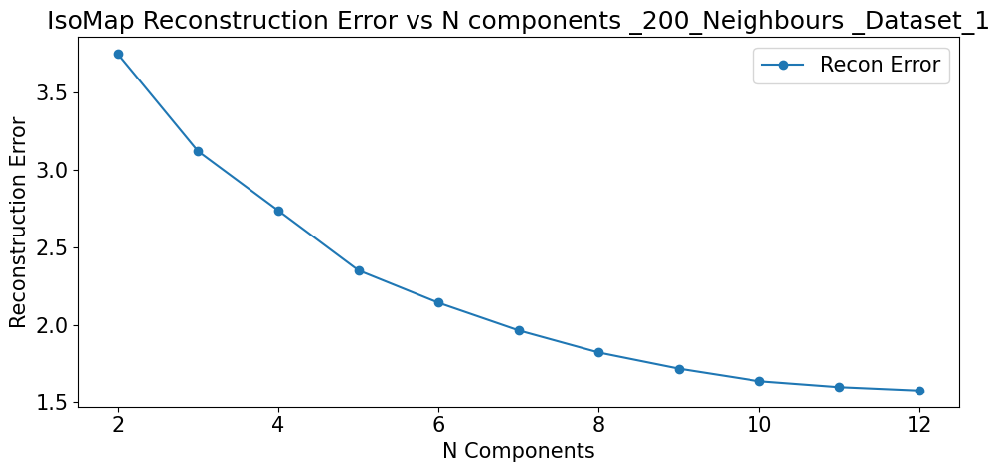

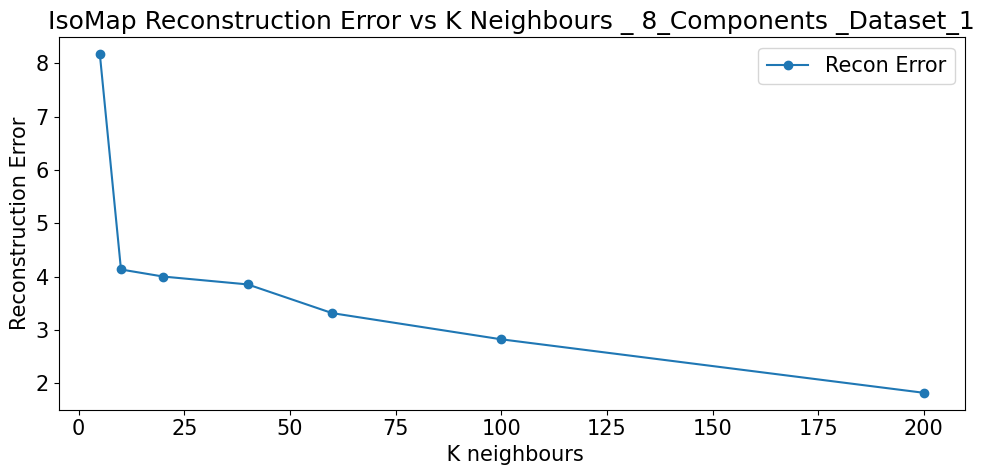

In [586]:

dataset_1.Dim_red['ISOMAP']= run_IsoMap(dataset=dataset_1,train = 'X_train_scaled',
               test = 'X_test_scaled',random_state= 42,misc = '',plot_config = {'figsize' :[10,5]
                                                                               ,'marker':'o'},
                Dataset_name = 'Dataset_1',
                                        k_neighbour_list = np.array([5,10,20,40,60,100,200])
                                                         )


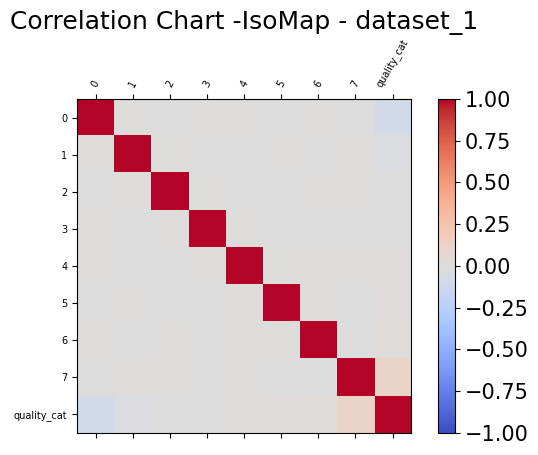

In [1066]:


create_corr_graphs(dataset=dataset_1, train='X_train_isomap', dataset_name = 'dataset_1',algo = 'IsoMap')


#### 4.2.4.b Dataset 2

/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/sklearn/manifold/_isomap.py:359: UserWarning: The number of connected components of the neighbors graph is 2 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.
  self._fit_transform(X)
/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])


neighbour: 40  n comp : 2  recon_error: 4.34808477239771


/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/sklearn/manifold/_isomap.py:359: UserWarning: The number of connected components of the neighbors graph is 2 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.
  self._fit_transform(X)
/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])


neighbour: 40  n comp : 3  recon_error: 3.8825351853150614


/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/sklearn/manifold/_isomap.py:359: UserWarning: The number of connected components of the neighbors graph is 2 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.
  self._fit_transform(X)
/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])


neighbour: 40  n comp : 4  recon_error: 3.410539364553147


/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/sklearn/manifold/_isomap.py:359: UserWarning: The number of connected components of the neighbors graph is 2 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.
  self._fit_transform(X)
/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])


neighbour: 40  n comp : 5  recon_error: 2.920631476219227


/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/sklearn/manifold/_isomap.py:359: UserWarning: The number of connected components of the neighbors graph is 2 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.
  self._fit_transform(X)
/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])


neighbour: 40  n comp : 6  recon_error: 2.4826259567564795


/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/sklearn/manifold/_isomap.py:359: UserWarning: The number of connected components of the neighbors graph is 2 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.
  self._fit_transform(X)
/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])


neighbour: 40  n comp : 7  recon_error: 2.2180743233819786
neighbour: 60  n comp : 2  recon_error: 6.372152506321185
neighbour: 60  n comp : 3  recon_error: 5.536307174457911
neighbour: 60  n comp : 4  recon_error: 4.921801840826569
neighbour: 60  n comp : 5  recon_error: 4.356127066980265
neighbour: 60  n comp : 6  recon_error: 3.811637165138475
neighbour: 60  n comp : 7  recon_error: 3.481712710036223
neighbour: 100  n comp : 2  recon_error: 5.286303527416363
neighbour: 100  n comp : 3  recon_error: 4.6790663125862
neighbour: 100  n comp : 4  recon_error: 4.05702257804462
neighbour: 100  n comp : 5  recon_error: 3.6019906585593735
neighbour: 100  n comp : 6  recon_error: 3.1174723583747452
neighbour: 100  n comp : 7  recon_error: 2.5840003555163413
neighbour: 200  n comp : 2  recon_error: 4.239089750826761
neighbour: 200  n comp : 3  recon_error: 3.8523463180987143
neighbour: 200  n comp : 4  recon_error: 3.4266132621751972
neighbour: 200  n comp : 5  recon_error: 2.9868390846450437


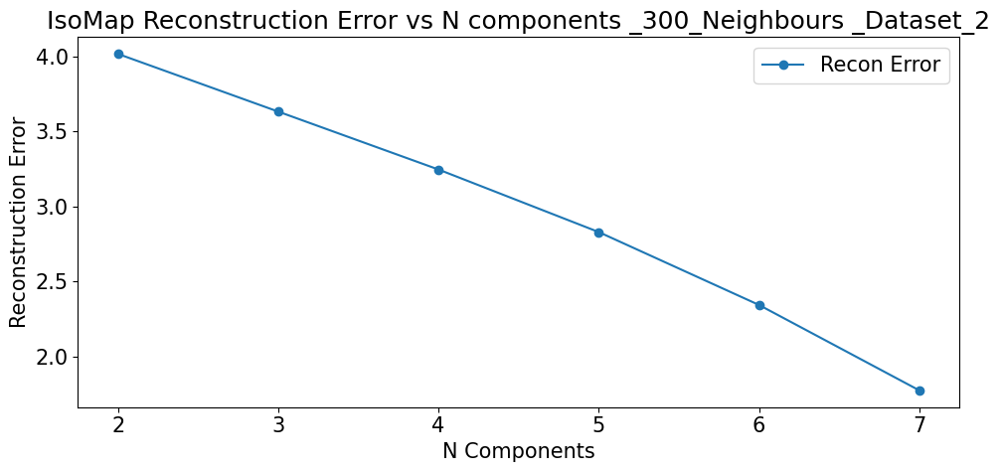

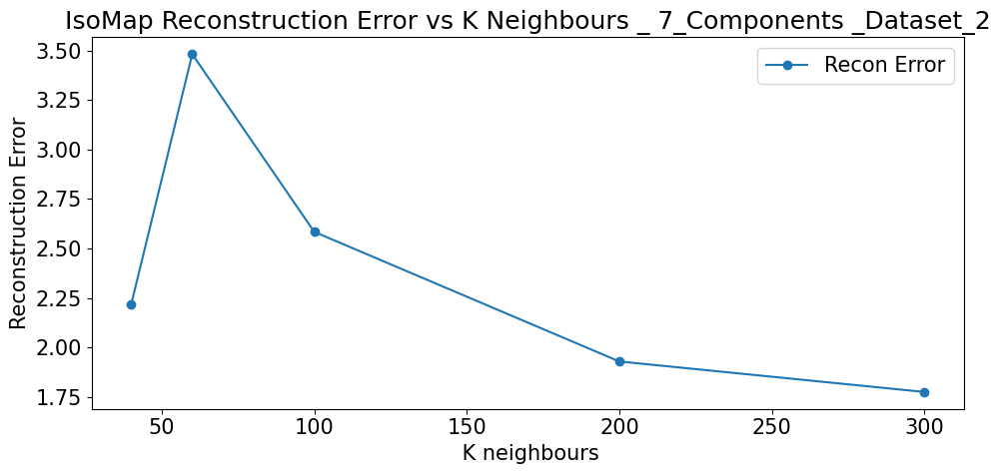

In [ ]:
dataset_2.Dim_red['ISOMAP']= run_IsoMap(dataset=dataset_2,train = 'X_train_scaled',
               test = 'X_test_scaled',random_state= 42,misc = '',plot_config = {'figsize' :[10,5]
                                                                               ,'marker':'o'},
                Dataset_name = 'Dataset_2',k_neighbour_list = np.array([40,60,100,200,300])
                                                         )

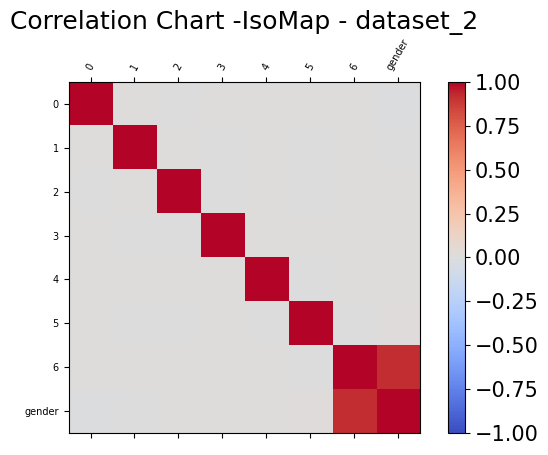

In [1067]:


create_corr_graphs(dataset=dataset_2, train='X_train_isomap', dataset_name = 'dataset_2',algo = 'IsoMap')


# 5. Clustering on Datasets - with Dim. Red.

## 5.1 K means ==============

### 5.1.1 PCA --------

#### 5.1.1.a Dataset 1

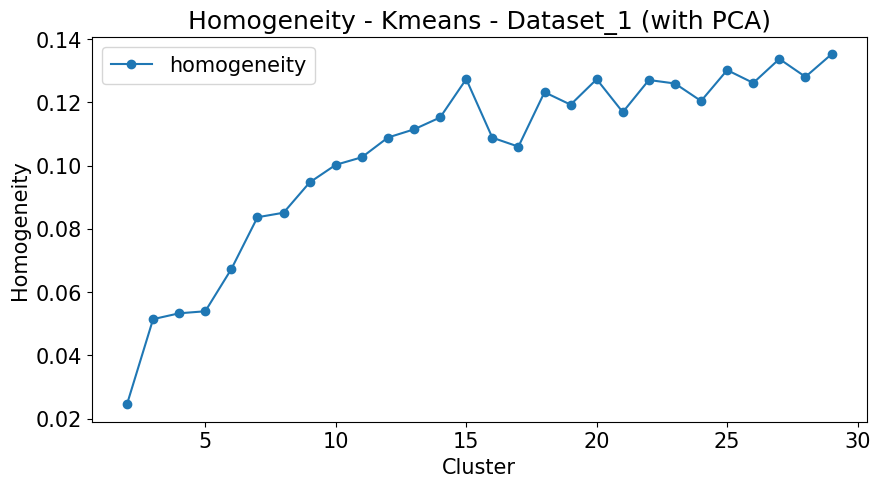

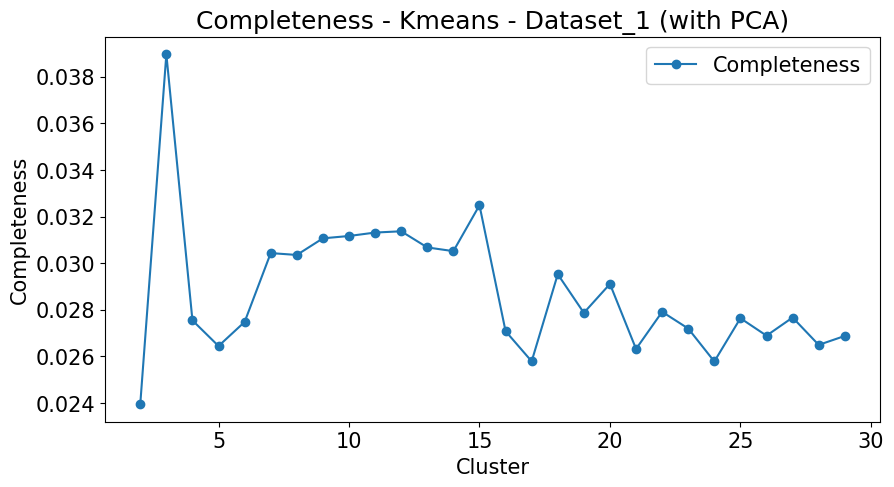

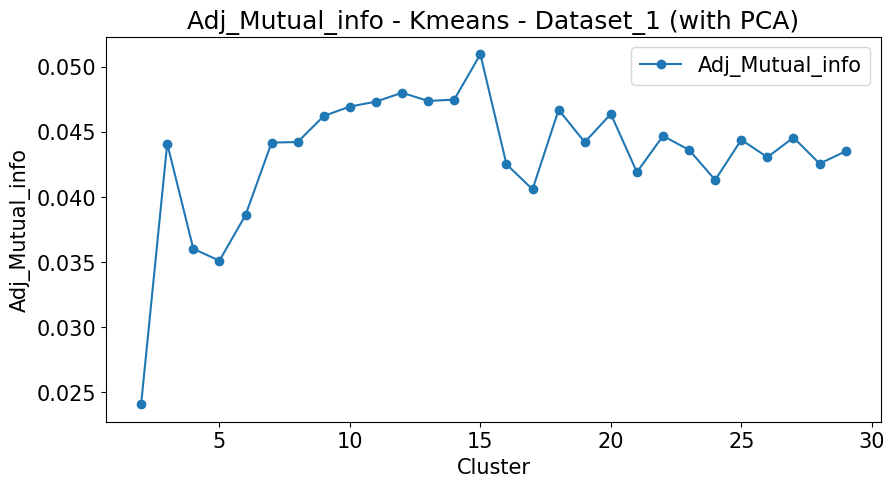

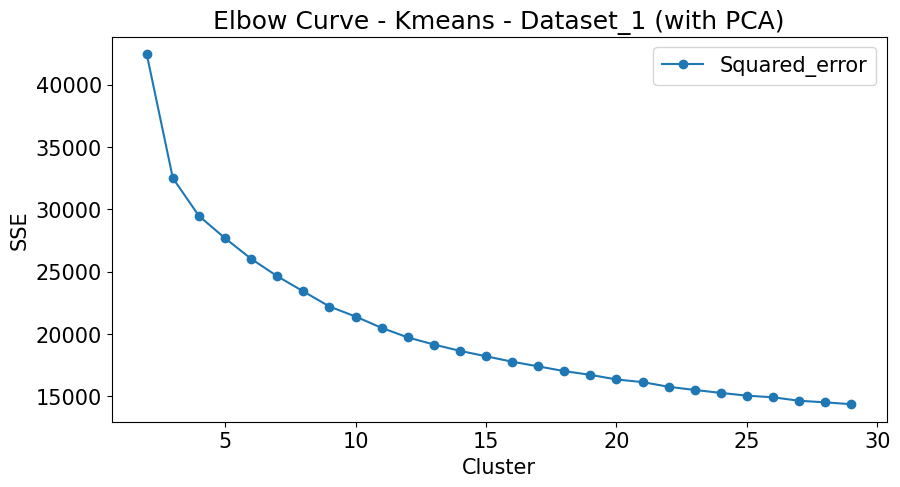

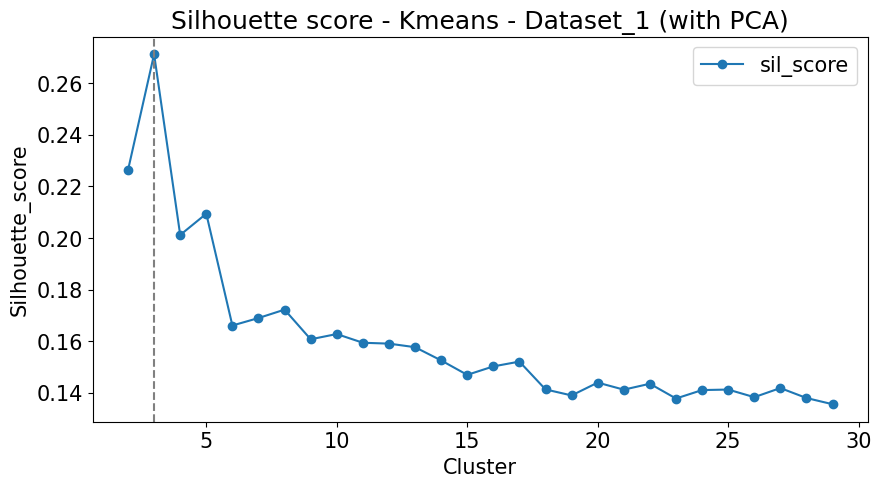

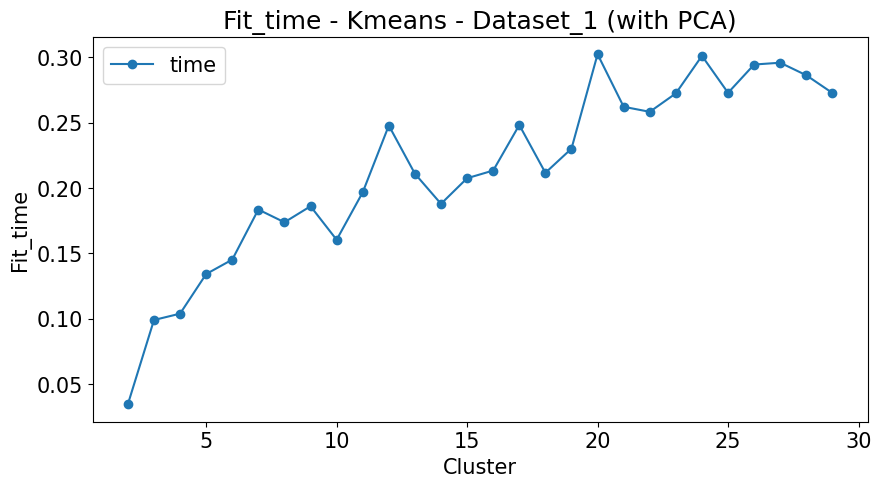

In [973]:



dataset_1.Clustring_with_dim_red['Kmeans']['PCA']= run_kmeans(dataset=dataset_1,
                                                              
                                                              train ='X_train_pca_sel',
                                                              test = 'X_test_pca_sel',
                                                              
                                                              
                                                          cluster_list =np.arange(2,30,1),
                                                          random_state= 42,
                                                          n_init=10, 
                                                          return_labels = True,misc = ' (with PCA)',
                                                          plot_config = {'figsize' :[10,5]},
                                                         Dataset_name = 'Dataset_1'
                                                         )
    

#### 5.1.1.b Dataset 2

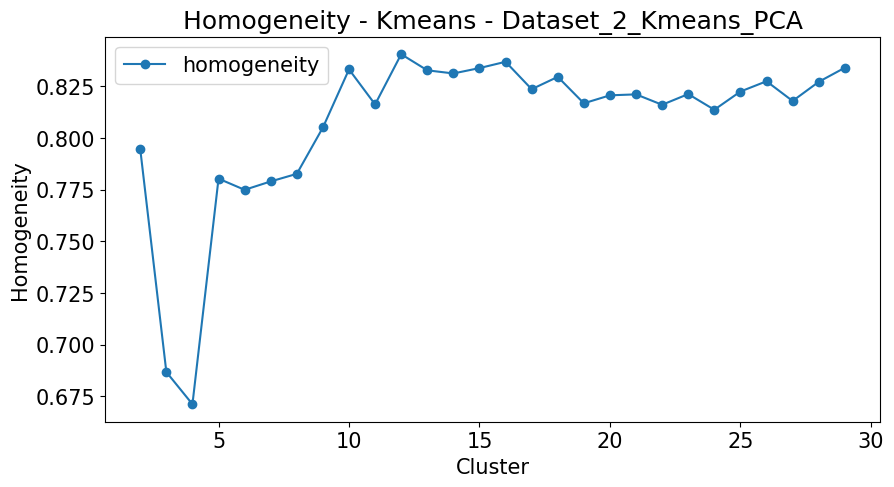

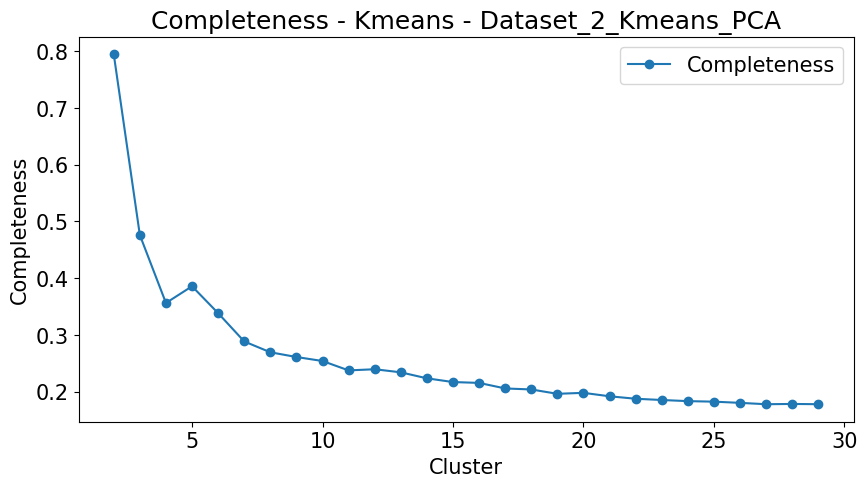

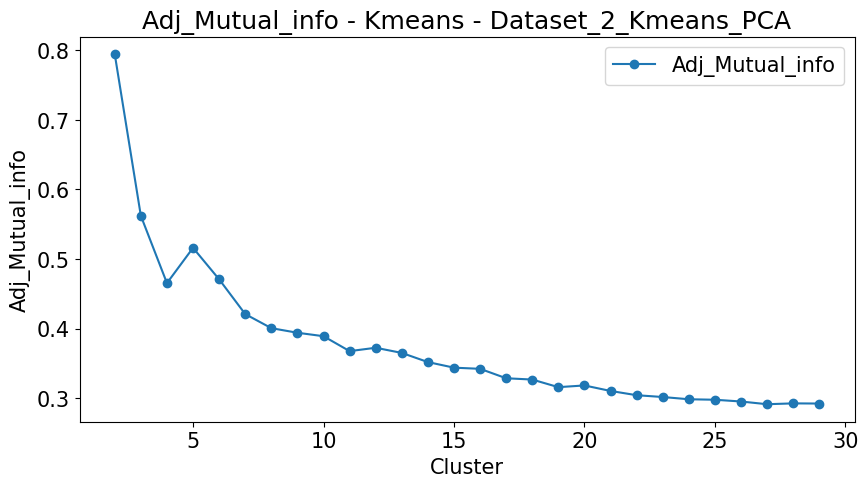

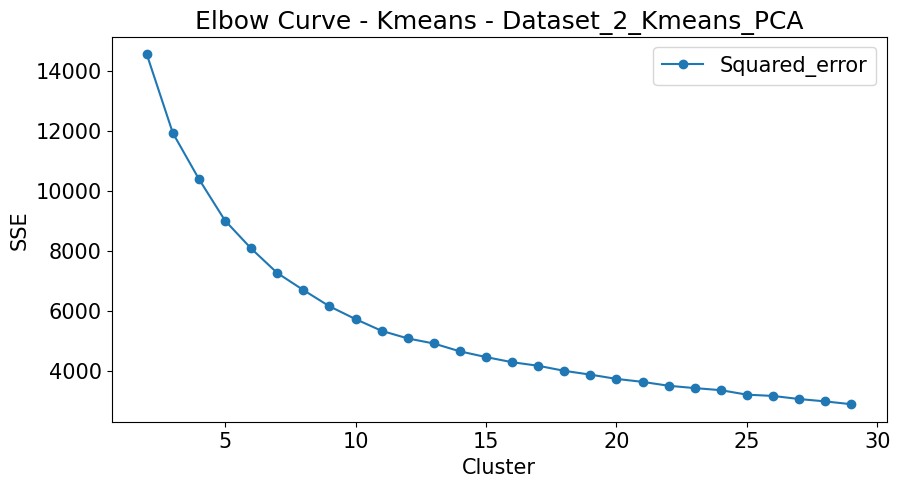

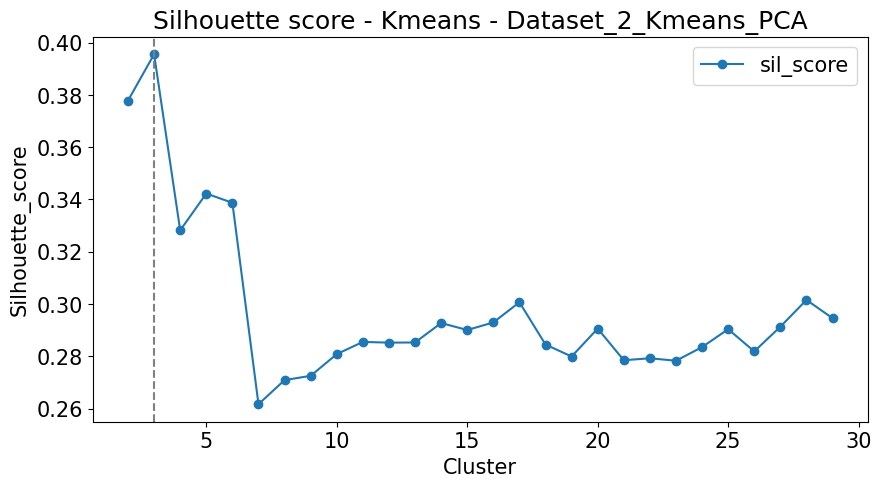

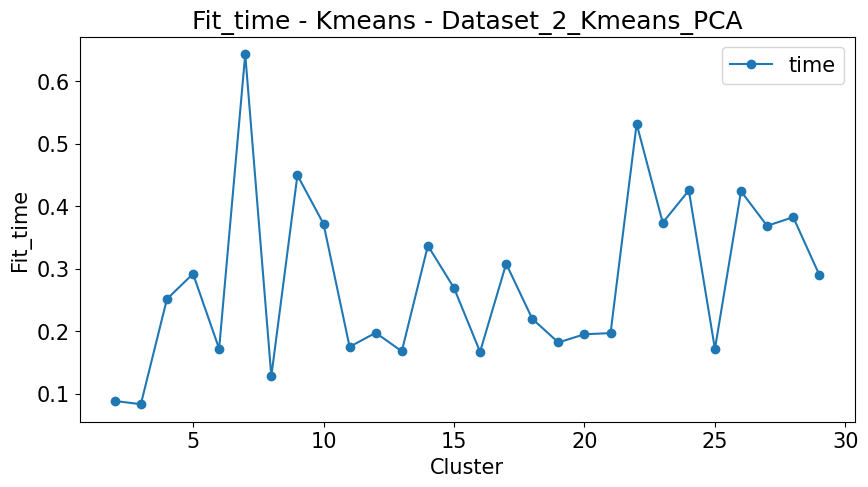

In [974]:


dataset_2.Clustring_with_dim_red['Kmeans']['PCA']= run_kmeans(dataset=dataset_2,
                                                              
                                                              train ='X_train_pca_sel',
                                                              test = 'X_test_pca_sel',
                                                              
                                                              
                                                          cluster_list =np.arange(2,30,1),
                                                          random_state= 42,
                                                          n_init=10, 
                                                          return_labels = True,misc = '_Kmeans_PCA',
                                                          plot_config = {'figsize' :[10,5]},
                                                         Dataset_name = 'Dataset_2'
                                                         )

### 5.1.2 ICA --------

#### 5.1.2.a Dataset 1

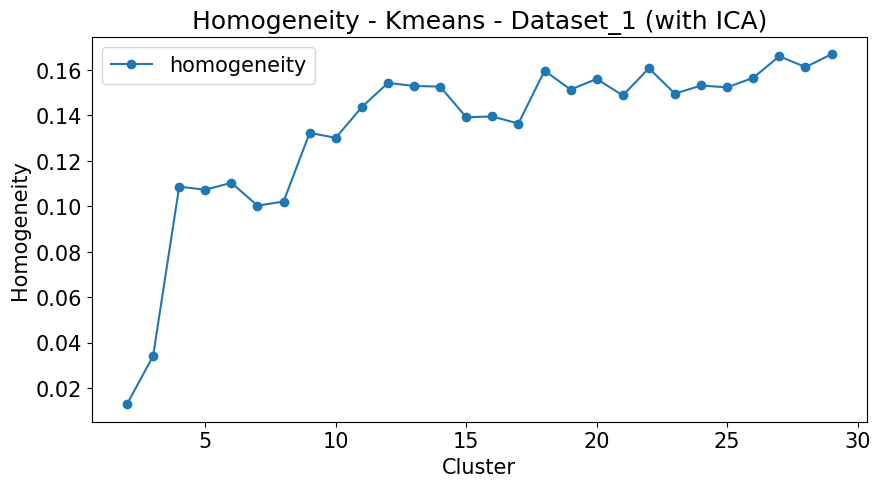

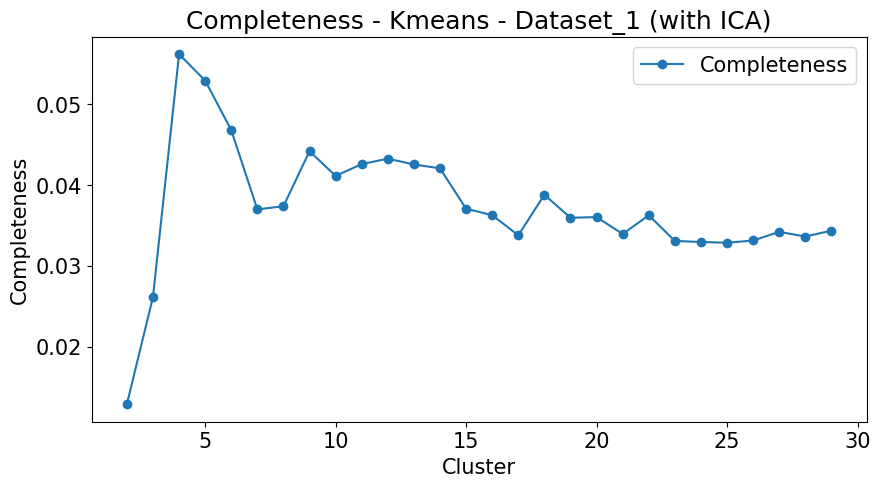

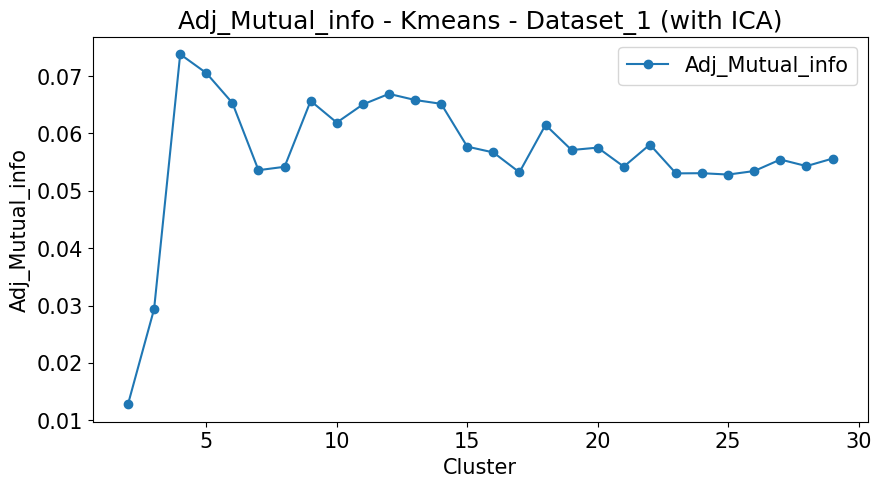

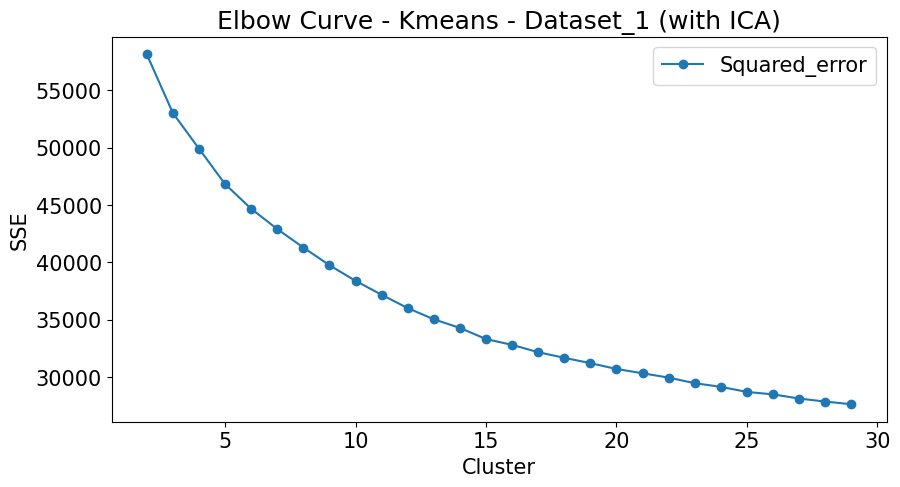

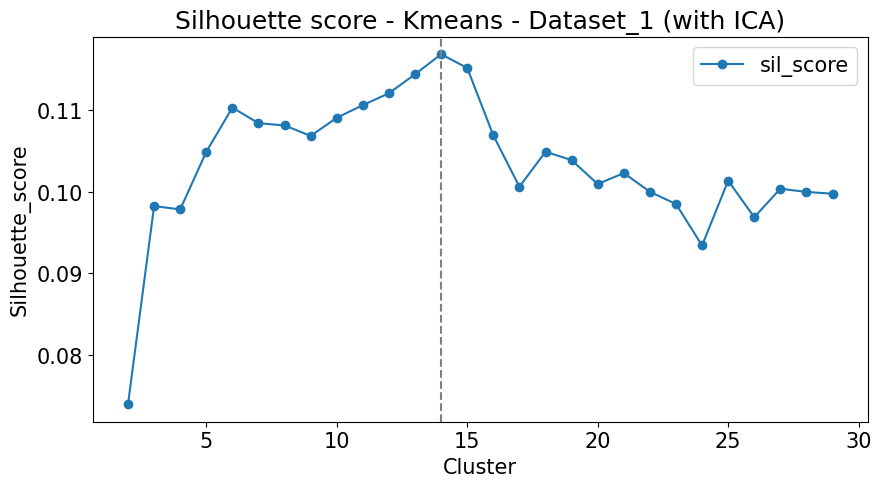

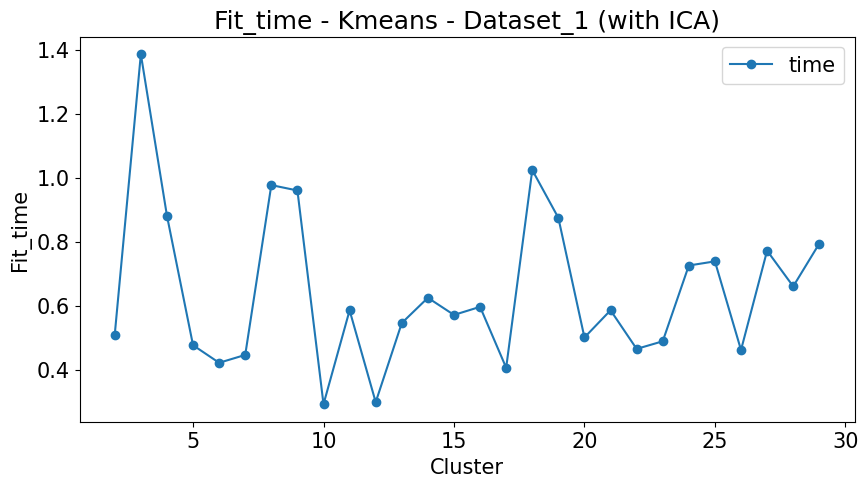

In [975]:



dataset_1.Clustring_with_dim_red['Kmeans']['ICA']= run_kmeans(dataset=dataset_1,
                                                              
                                                              train ='X_train_ica',
                                                              test = 'X_test_ica',
                                                              
                                                              
                                                          cluster_list =np.arange(2,30,1),
                                                          random_state= 42,
                                                          n_init=10, 
                                                          return_labels = True,misc = ' (with ICA)',
                                                          plot_config = {'figsize' :[10,5]},
                                                         Dataset_name = 'Dataset_1'
                                                         )
    

#### 5.1.2.b Dataset 2

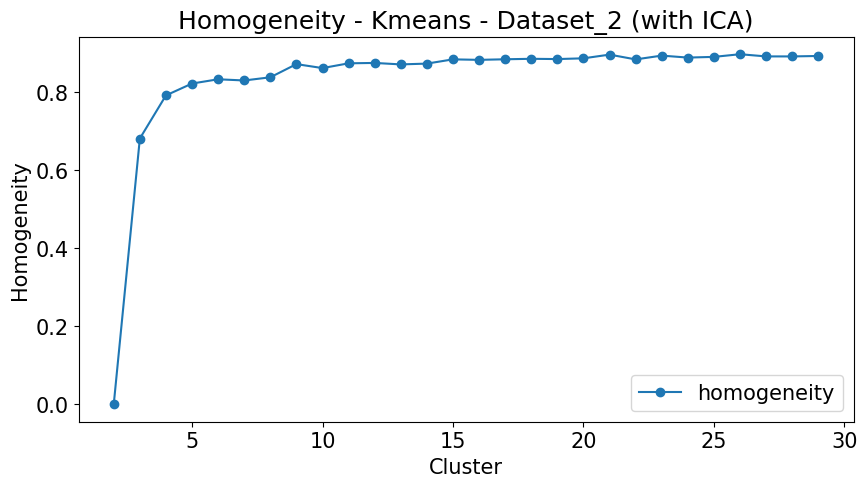

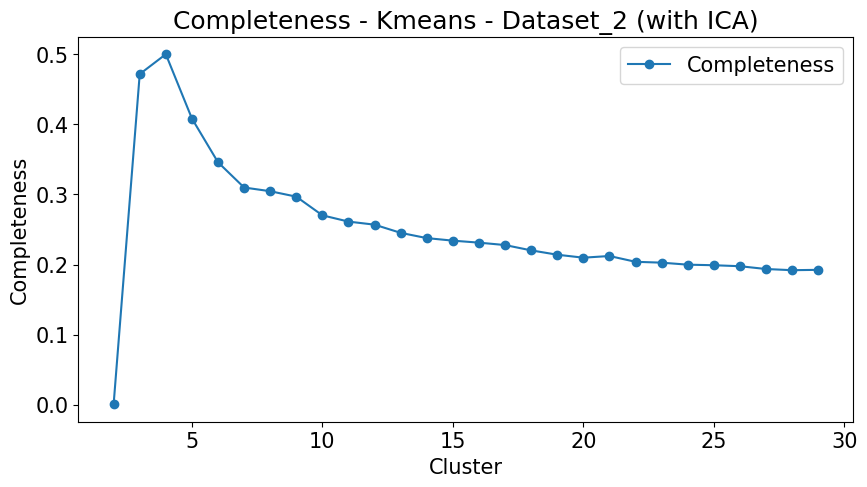

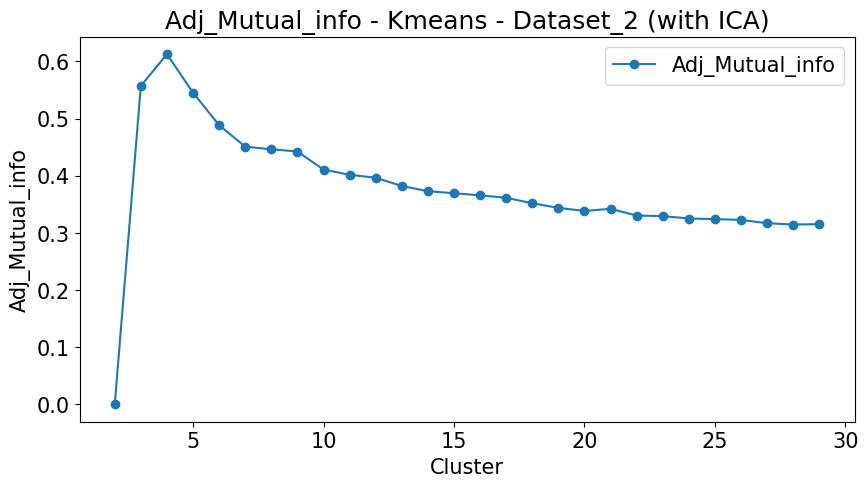

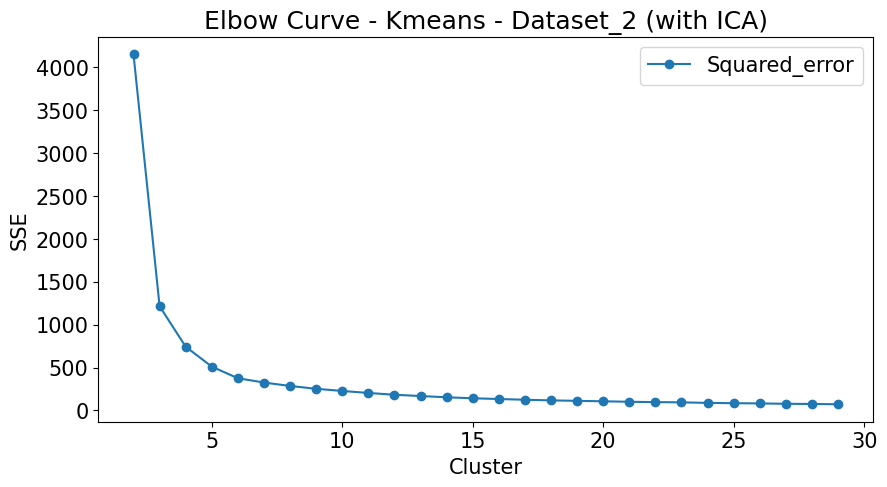

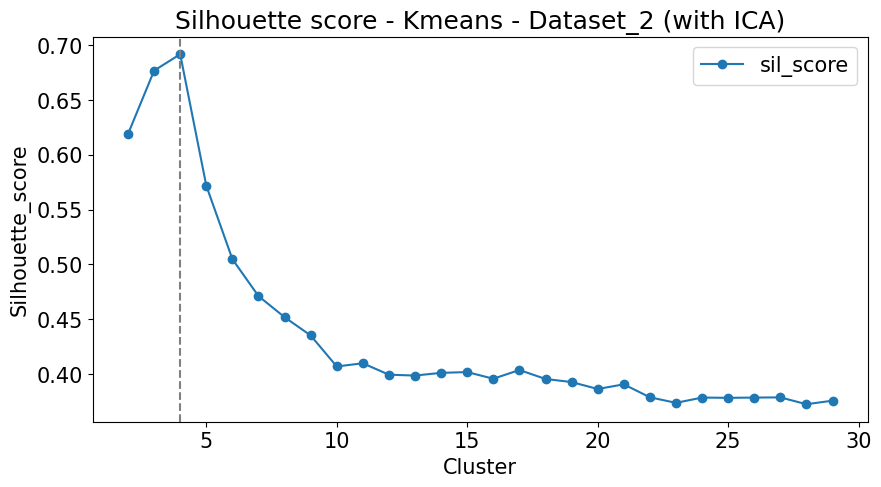

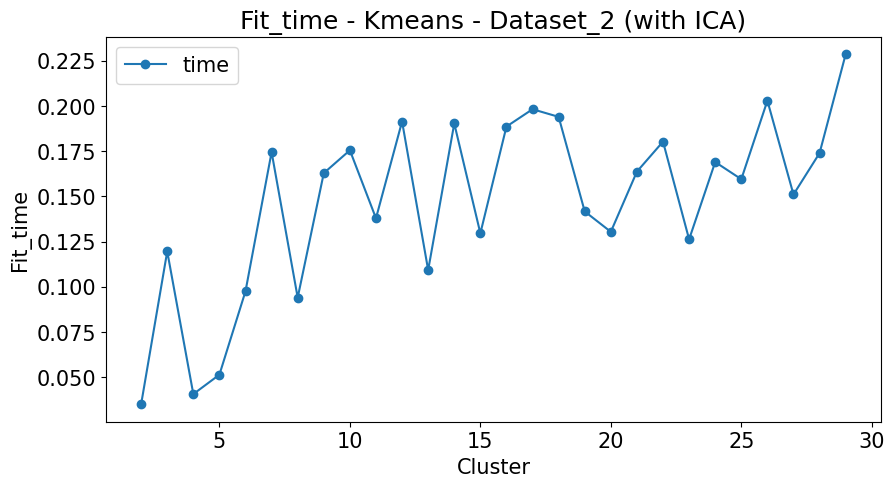

In [976]:



dataset_2.Clustring_with_dim_red['Kmeans']['ICA']= run_kmeans(dataset=dataset_2,
                                                              
                                                              train ='X_train_ica',
                                                              test = 'X_test_ica',
                                                              
                                                              
                                                          cluster_list =np.arange(2,30,1),
                                                          random_state= 42,
                                                          n_init=10, 
                                                          return_labels = True,misc = ' (with ICA)',
                                                          plot_config = {'figsize' :[10,5]},
                                                         Dataset_name = 'Dataset_2'
                                                         )
    

### 5.1.3 RPA --------

#### 5.1.3.a Dataset 1

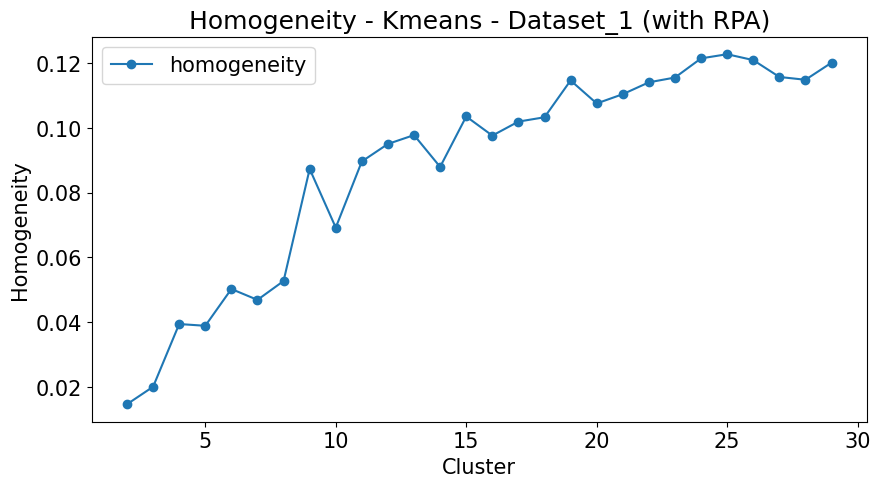

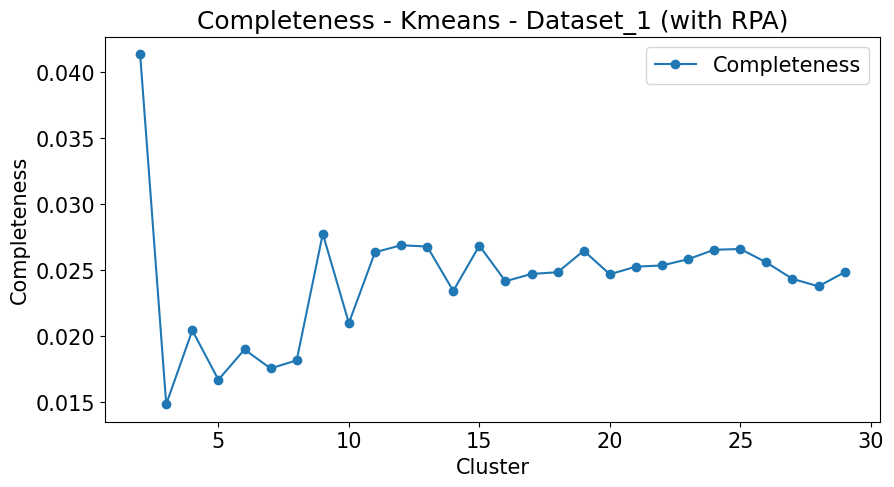

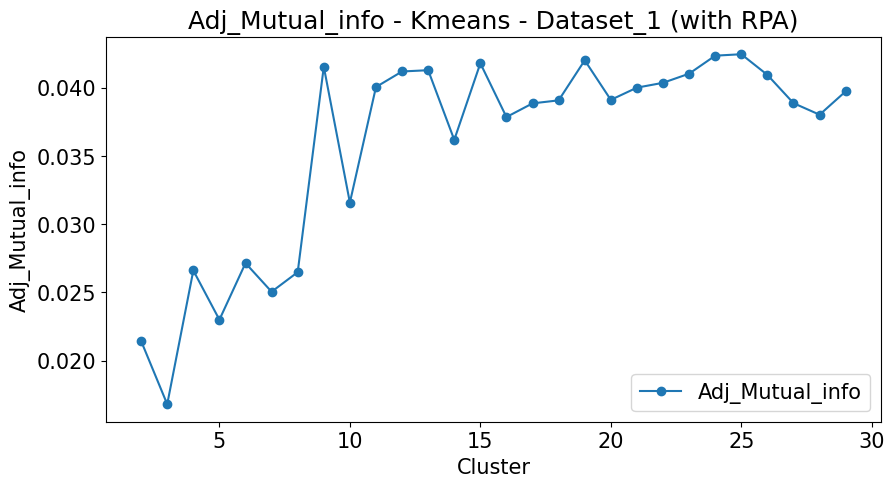

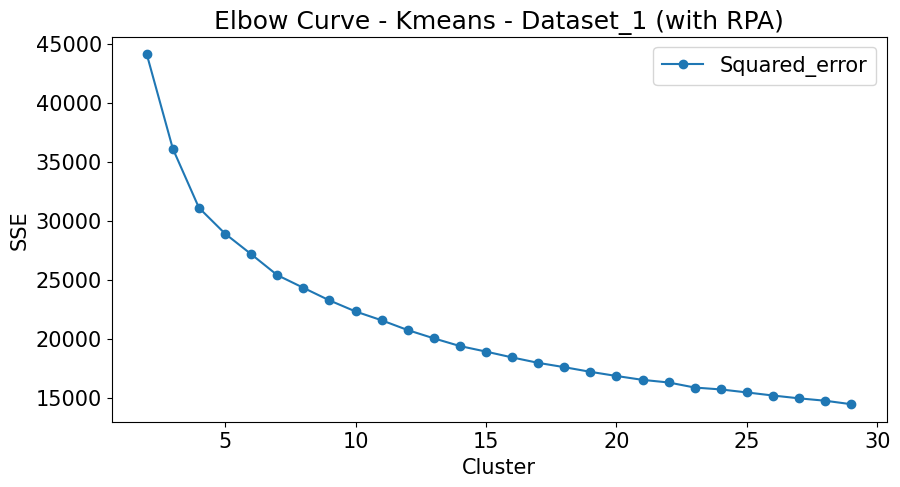

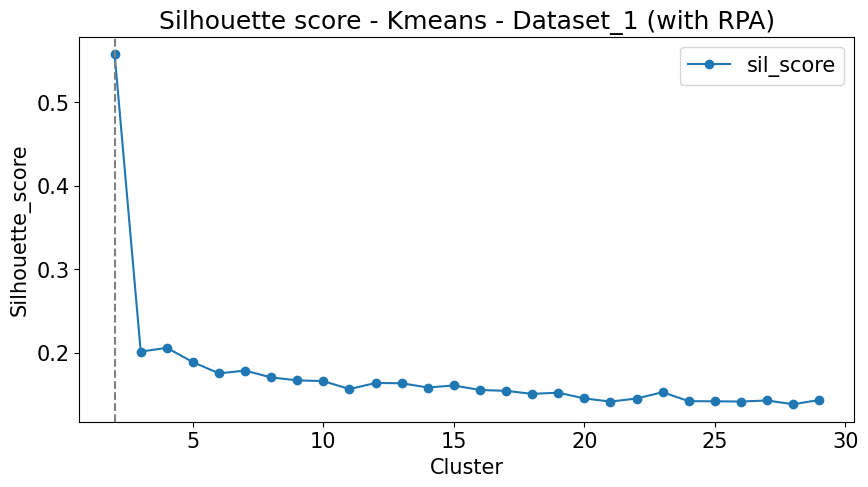

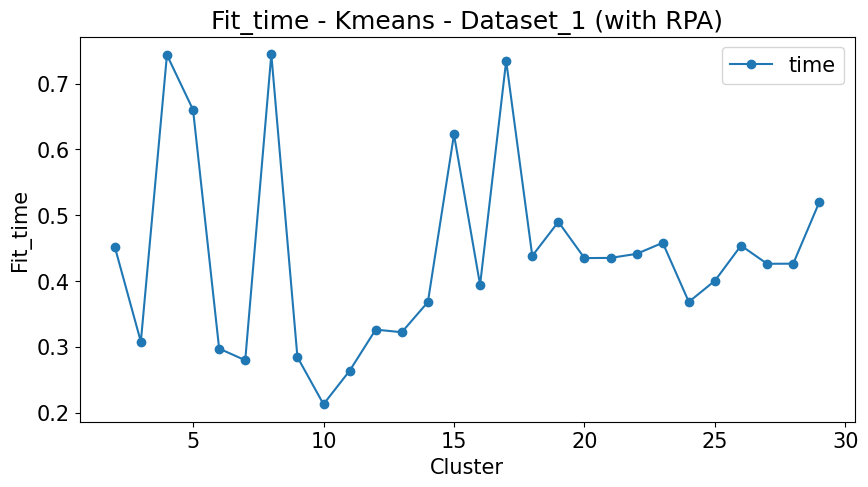

In [977]:



dataset_1.Clustring_with_dim_red['Kmeans']['RPA']= run_kmeans(dataset=dataset_1,
                                                              
                                                              train ='X_train_rpa',
                                                              test = 'X_test_rpa',
                                                              
                                                              
                                                          cluster_list =np.arange(2,30,1),
                                                          random_state= 42,
                                                          n_init=10, 
                                                          return_labels = True,misc = ' (with RPA)',
                                                          plot_config = {'figsize' :[10,5]},
                                                         Dataset_name = 'Dataset_1'
                                                         )
    

#### 5.1.3.b Dataset 2

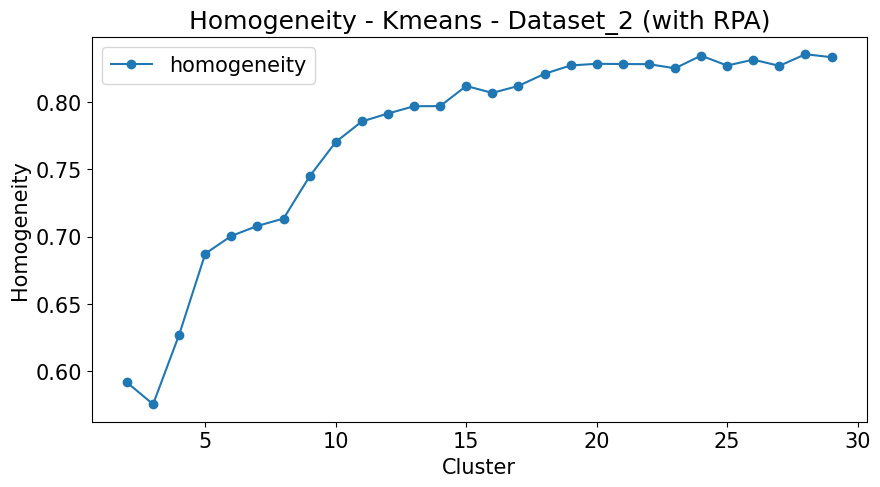

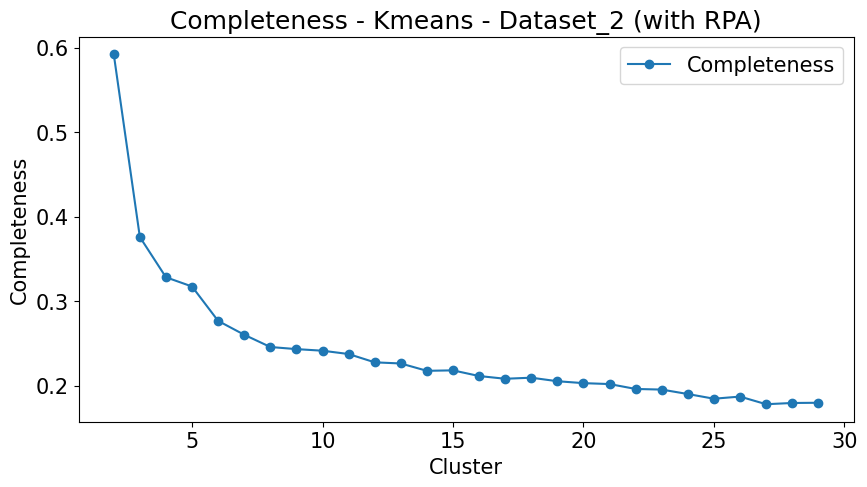

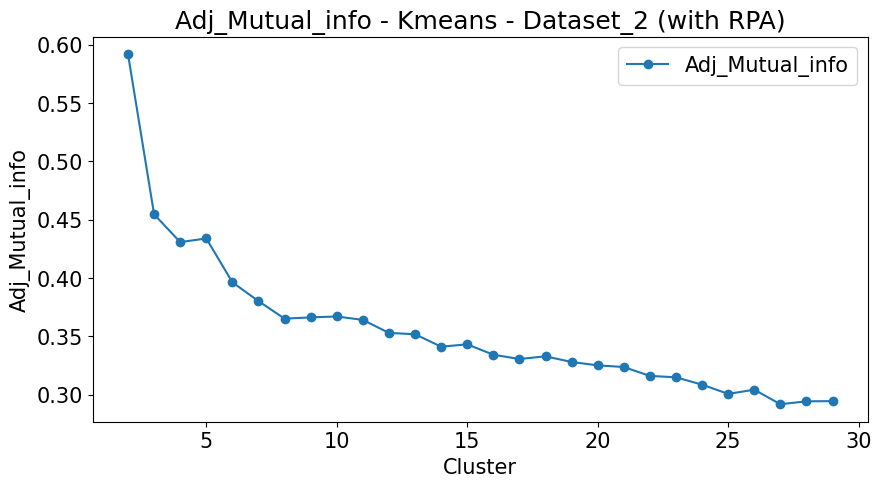

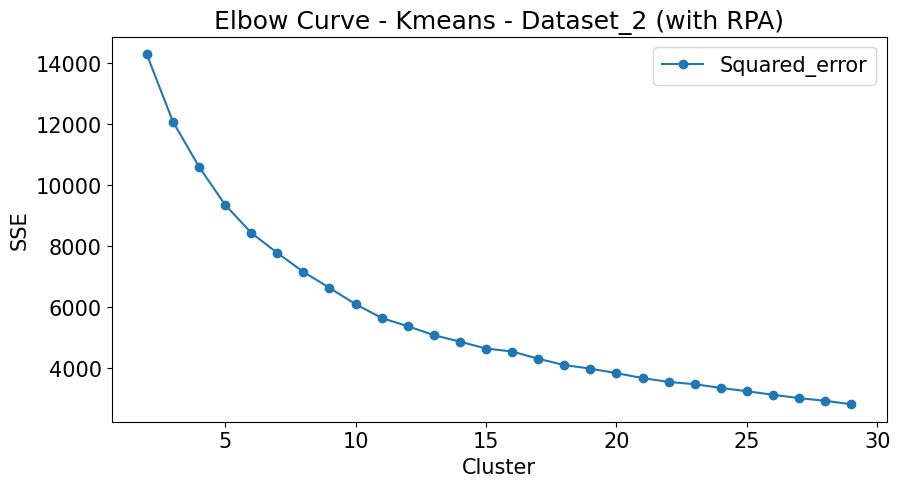

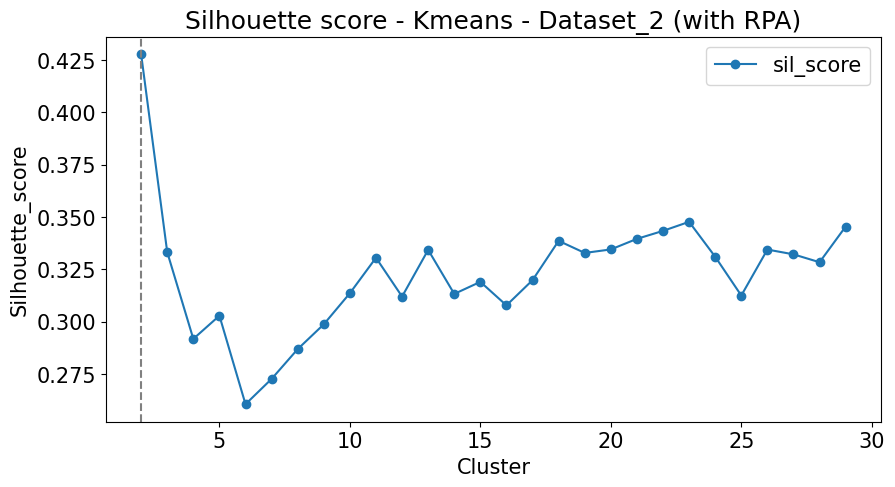

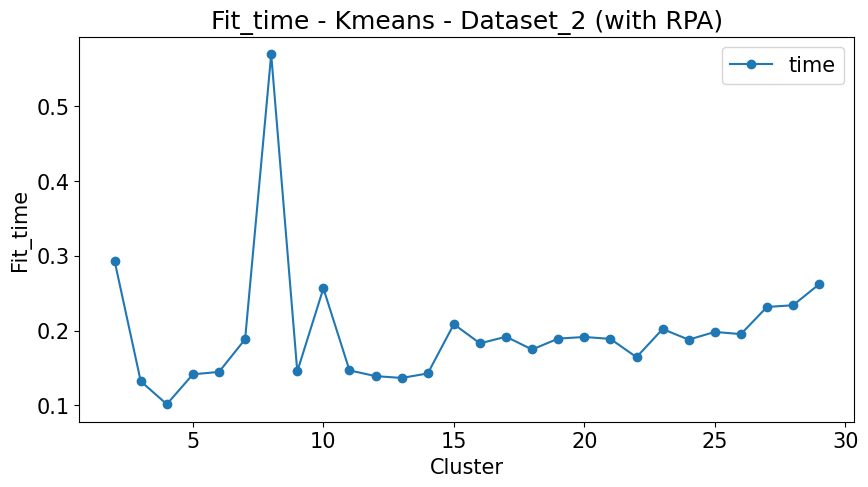

In [978]:

dataset_2.Clustring_with_dim_red['Kmeans']['RPA']= run_kmeans(dataset=dataset_2,
                                                              
                                                              train ='X_train_rpa',
                                                              test = 'X_test_rpa',
                                                              
                                                              
                                                          cluster_list =np.arange(2,30,1),
                                                          random_state= 42,
                                                          n_init=10, 
                                                          return_labels = True,misc = ' (with RPA)',
                                                          plot_config = {'figsize' :[10,5]},
                                                         Dataset_name = 'Dataset_2'
                                                         )

### 5.1.4 Isomap --------

#### 5.1.4.a Dataset 1

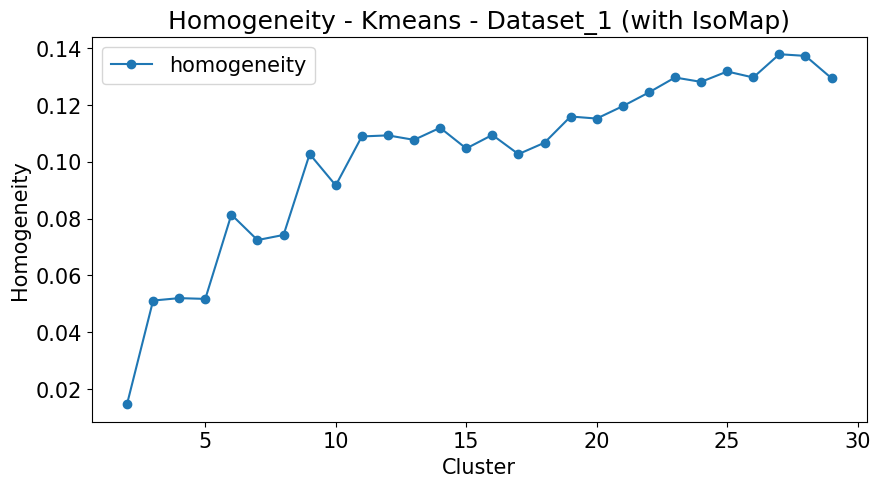

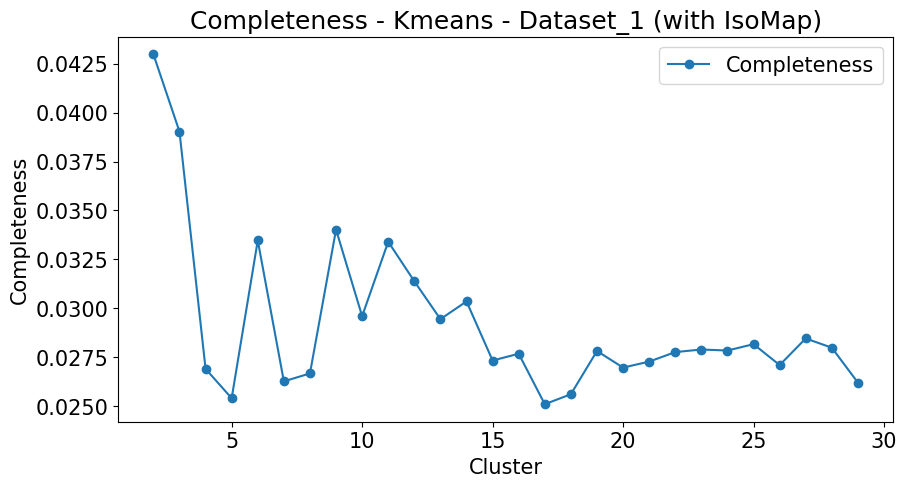

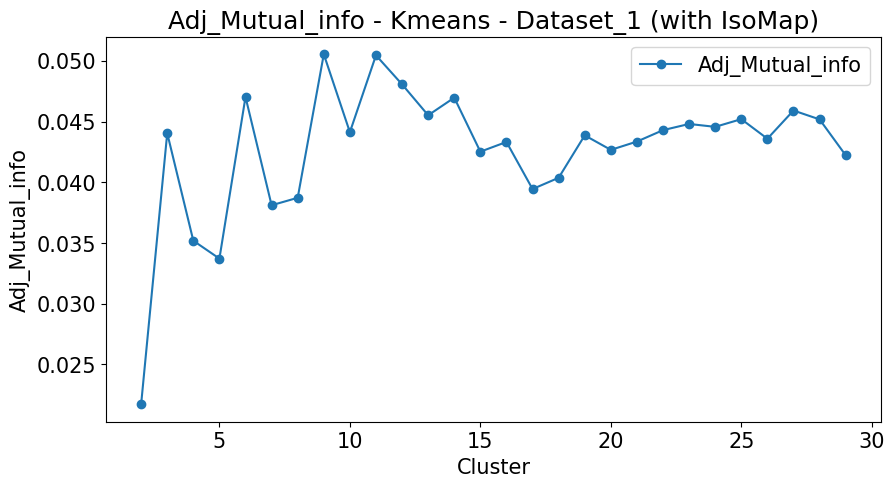

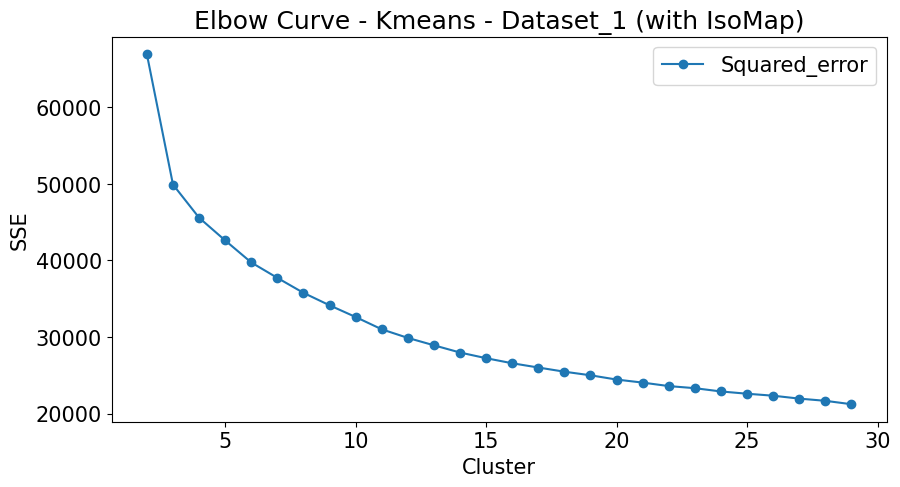

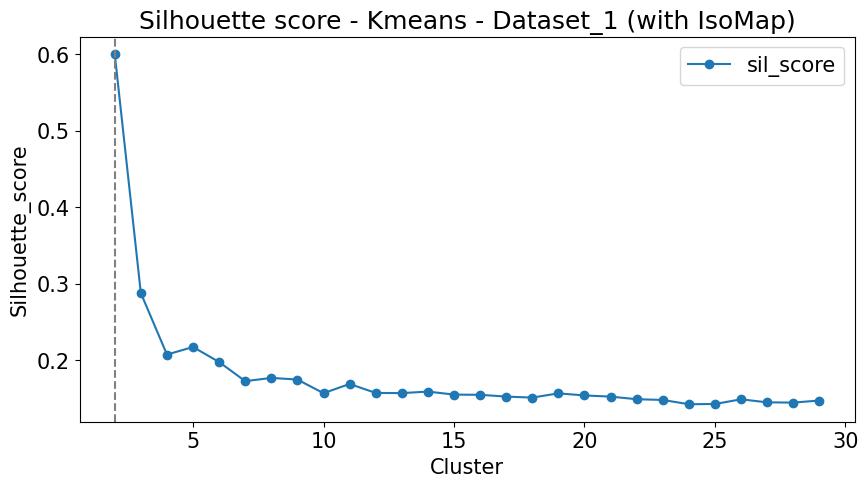

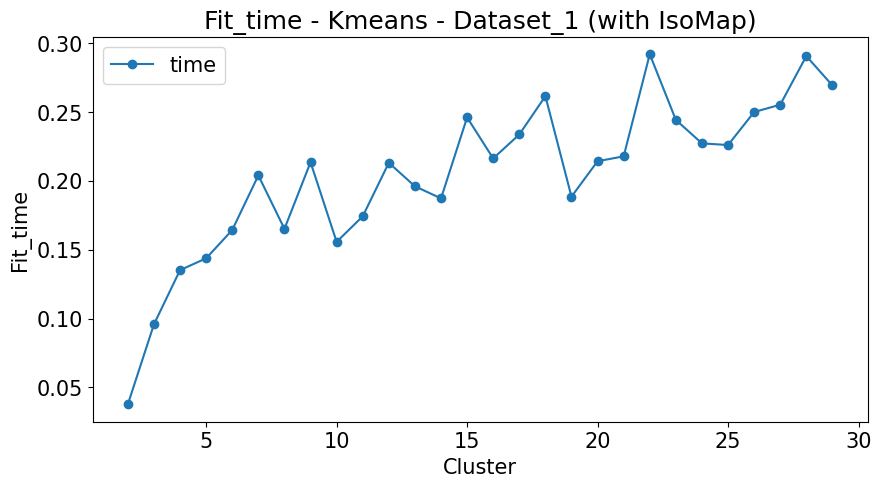

In [986]:
dataset_1.Clustring_with_dim_red['Kmeans']['ISOMAP']= run_kmeans(dataset=dataset_1,
                                                              
                                                              train ='X_train_isomap',
                                                              test = 'X_test_isomap',
                                                              
                                                              
                                                          cluster_list =np.arange(2,30,1),
                                                          random_state= 42,
                                                          n_init=10, 
                                                          return_labels = True,misc = ' (with IsoMap)',
                                                          plot_config = {'figsize' :[10,5]},
                                                         Dataset_name = 'Dataset_1'
                                                         )
    



#### 5.1.4.b Dataset 2

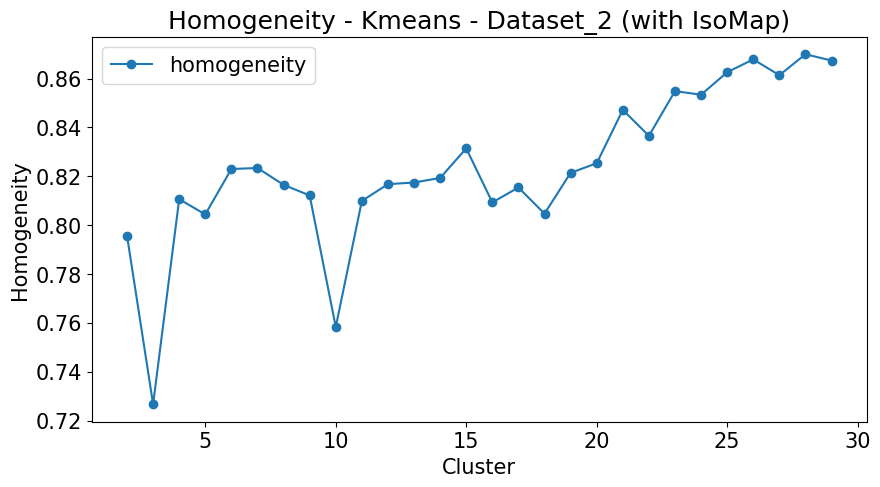

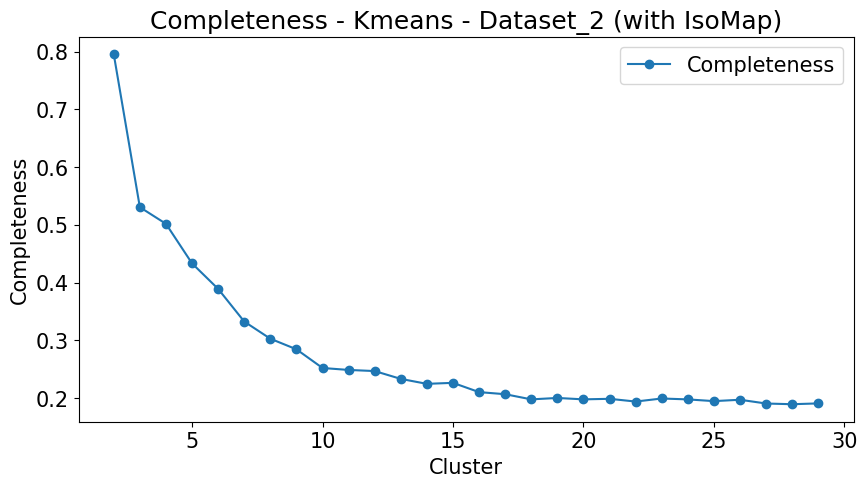

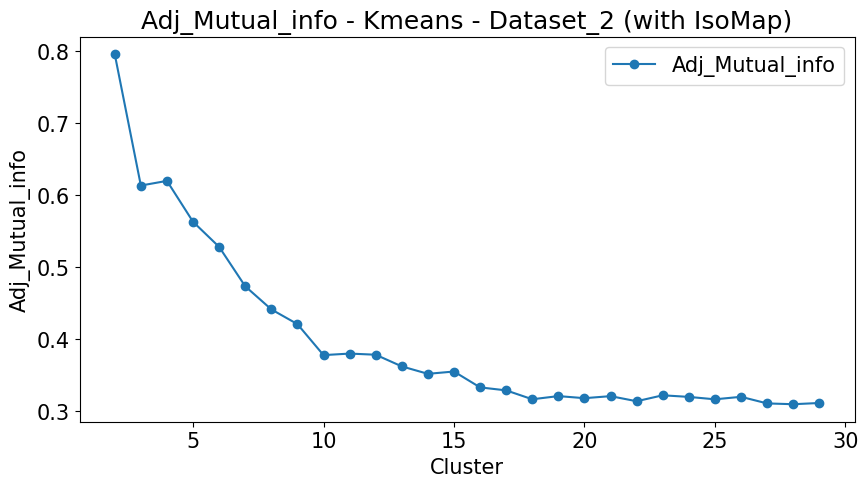

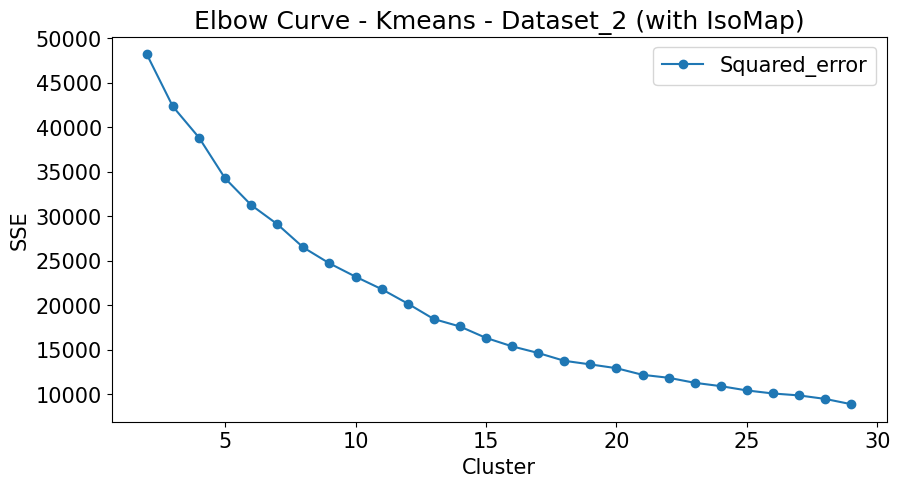

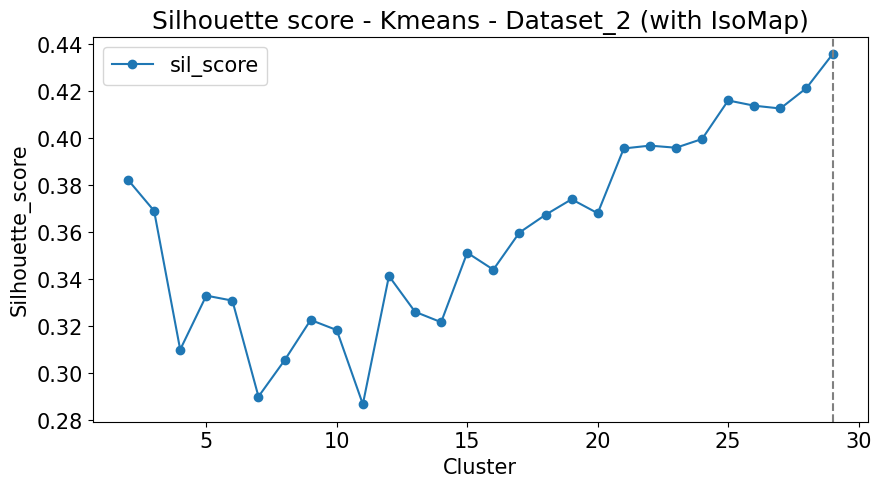

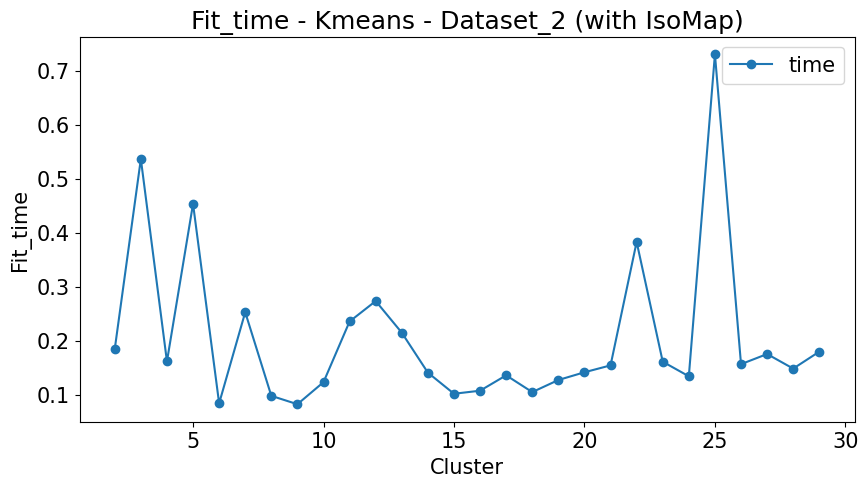

In [987]:


dataset_2.Clustring_with_dim_red['Kmeans']['ISOMAP']= run_kmeans(dataset=dataset_2,
                                                              
                                                              train ='X_train_isomap',
                                                              test = 'X_test_isomap',
                                                              
                                                              
                                                          cluster_list =np.arange(2,30,1),
                                                          random_state= 42,
                                                          n_init=10, 
                                                          return_labels = True,misc = ' (with IsoMap)',
                                                          plot_config = {'figsize' :[10,5]},
                                                         Dataset_name = 'Dataset_2'
                                                         )




### Model comparisons : Create Combined visualization

#### Dataset 1

/var/folders/vq/040zg8m163g9p8bh9v8lz33m0000gn/T/ipykernel_49889/1618030359.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_list_kmeans_dim_red[j][i].rename(columns = {j:i},inplace = True)
/var/folders/vq/040zg8m163g9p8bh9v8lz33m0000gn/T/ipykernel_49889/1618030359.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_list_kmeans_dim_red[j][i].rename(columns = {j:i},inplace = True)
/var/folders/vq/040zg8m163g9p8bh9v8lz33m0000gn/T/ipykernel_49889/1618030359.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pyda

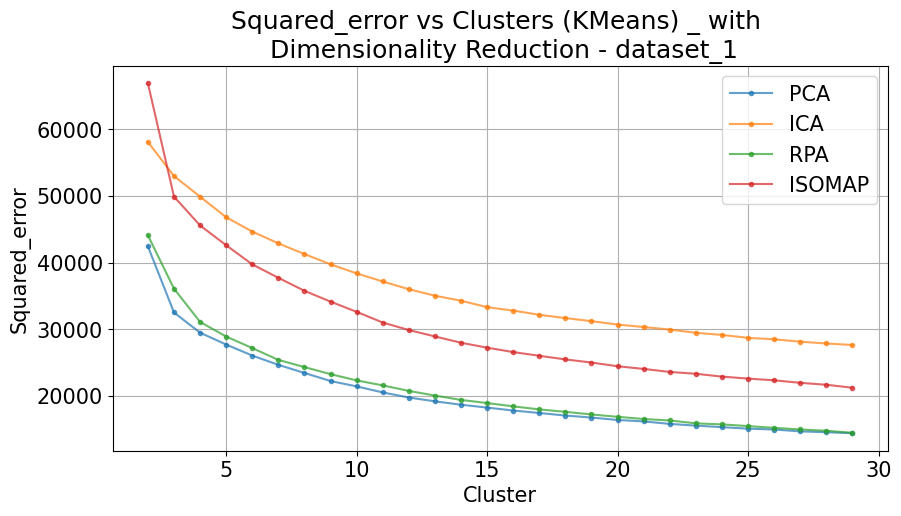

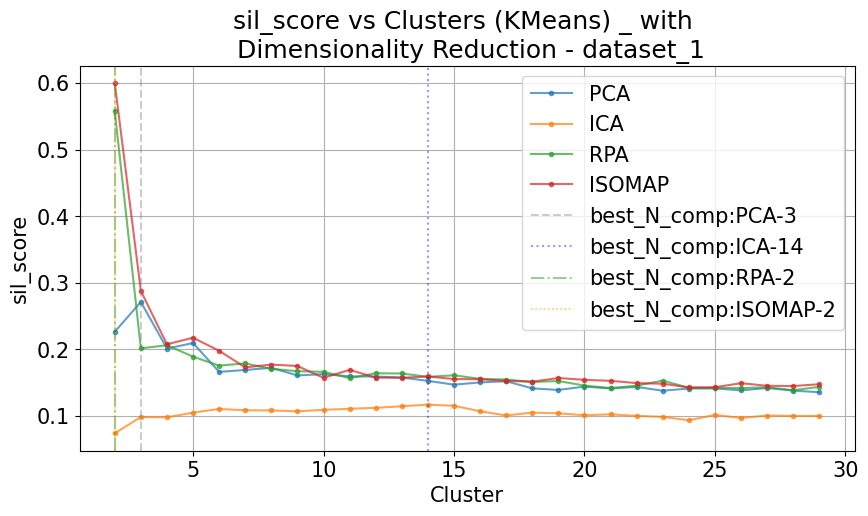

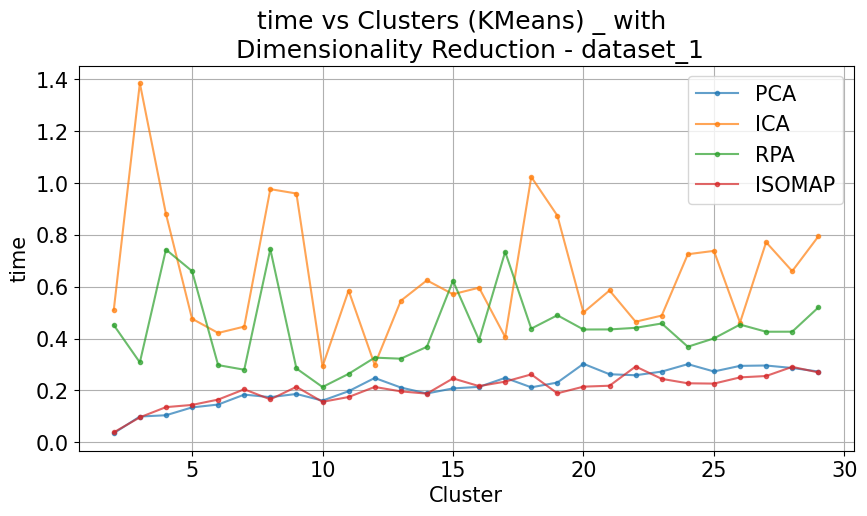

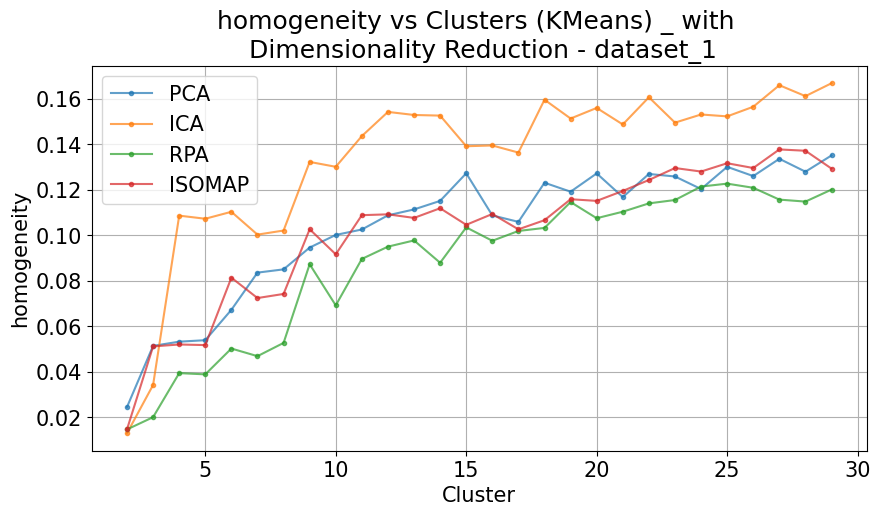

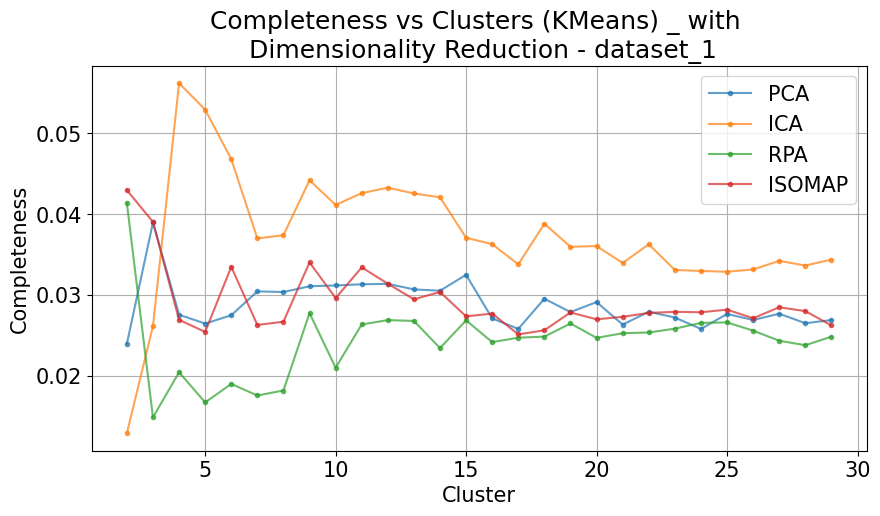

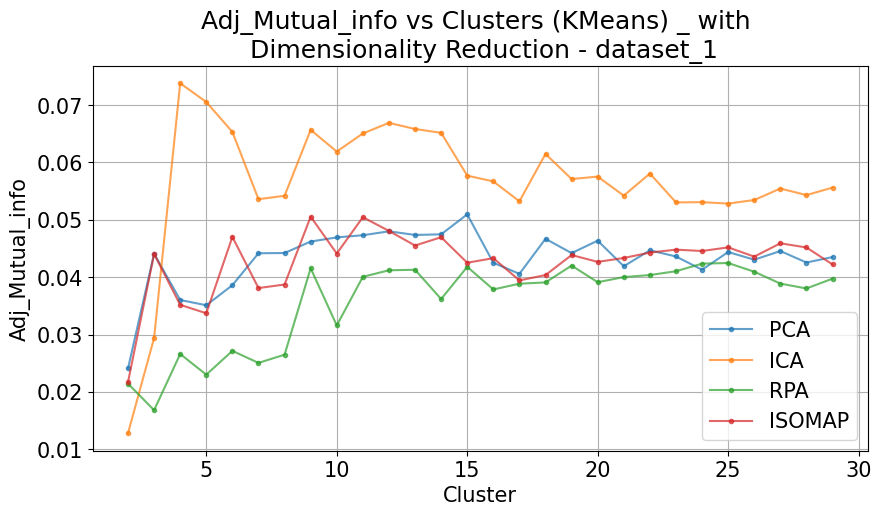

In [1161]:

df_list_kmeans_dim_red = {
i:dict()
for i in dataset_1.Clustring_with_dim_red['Kmeans']['PCA']['score_df'].columns if i != 'Cluster'

}

for i in dataset_1.Clustring_with_dim_red['Kmeans'].keys():
    
    for j in df_list_kmeans_dim_red.keys():
        
        
        
        df_list_kmeans_dim_red[j][i] = dataset_1.Clustring_with_dim_red['Kmeans'][i]['score_df'][[j,'Cluster']]
        
        
        
        #display(df_list_kmeans_dim_red[j][i]['Cluster'].head())
        df_list_kmeans_dim_red[j][i].set_index('Cluster', inplace = True)
        df_list_kmeans_dim_red[j][i].rename(columns = {j:i},inplace = True)
    
    






for j in df_list_kmeans_dim_red.keys():


    fig, ax = plt.subplots()

    
    title = j + ' vs ' + 'Clusters (KMeans) _ with \n Dimensionality Reduction - dataset_1'
    
    df__ = pd.concat(list(df_list_kmeans_dim_red[j].values()),axis =1)
    df__.plot(

    marker = '.', grid = True, ylabel = j, title = title, ax = ax , alpha = 0.7,
        figsize = [10,5]
    )
    
    legend = list(df__.columns.values)
    if j == 'sil_score':
        for l,k in enumerate(df__.columns):
            b = df__[k].idxmax()
            ax.axvline(x=b,
                       #linestyle='--',
                       label ='best_N_comp:', c=color[l],alpha =0.4,
                       linestyle=linestyle[l])
        
            legend.append('best_N_comp:'+k+'-'+str(b))
        
        
        ax.legend( legend) 
    
    
    
    
    plt.show()
    
    save_loss_curve(fig,title)
    

#### Dataset 2

/var/folders/vq/040zg8m163g9p8bh9v8lz33m0000gn/T/ipykernel_49889/58720735.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_list_kmeans_dim_red[j][i].rename(columns = {j:i},inplace = True)
/var/folders/vq/040zg8m163g9p8bh9v8lz33m0000gn/T/ipykernel_49889/58720735.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_list_kmeans_dim_red[j][i].rename(columns = {j:i},inplace = True)
/var/folders/vq/040zg8m163g9p8bh9v8lz33m0000gn/T/ipykernel_49889/58720735.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org

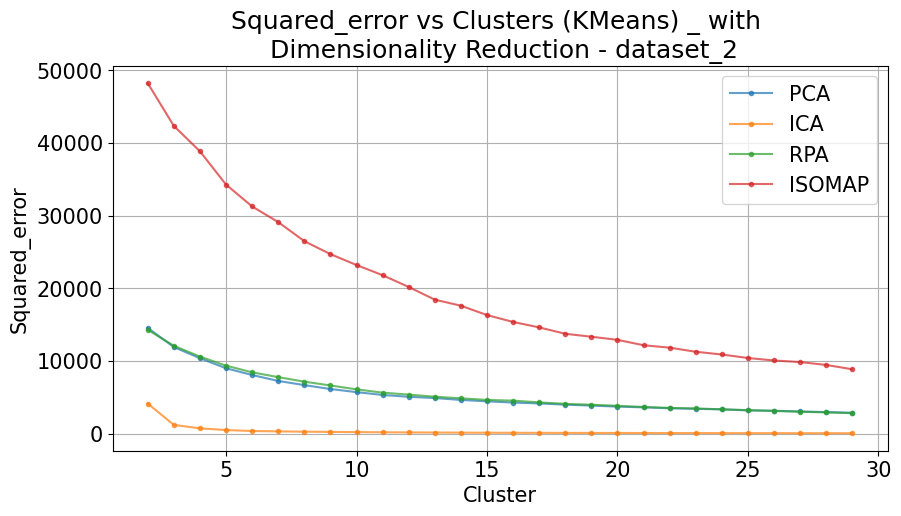

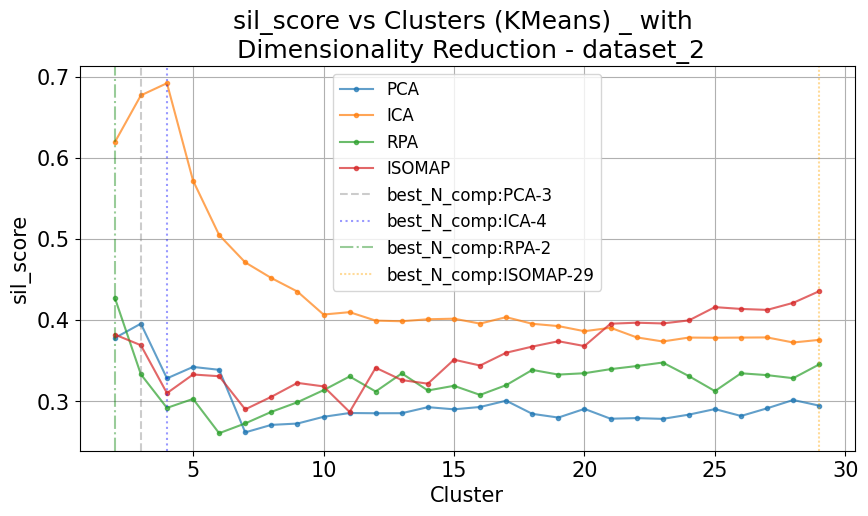

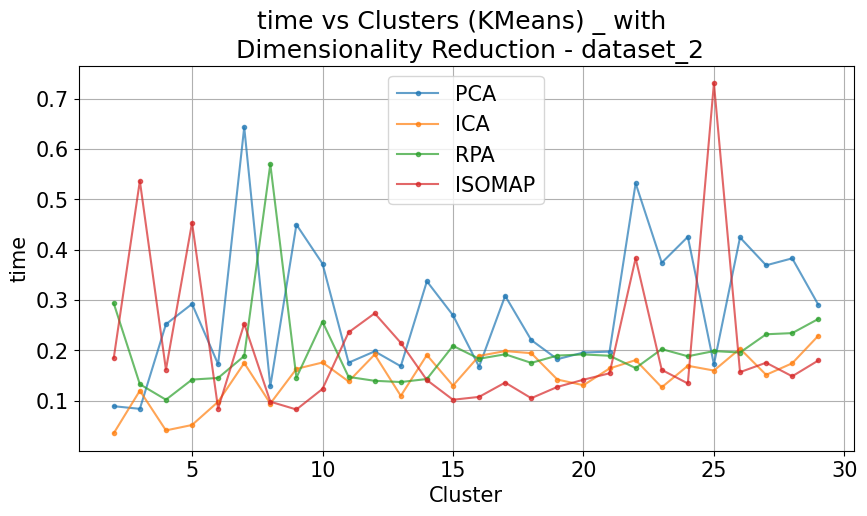

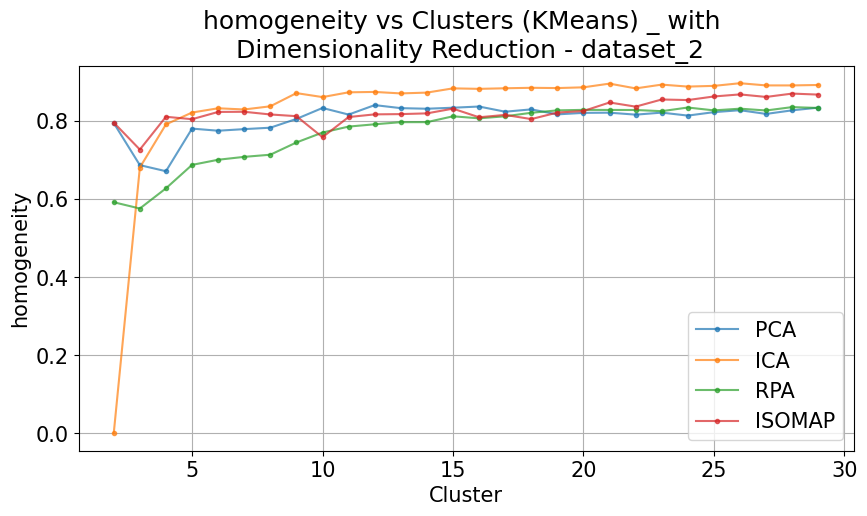

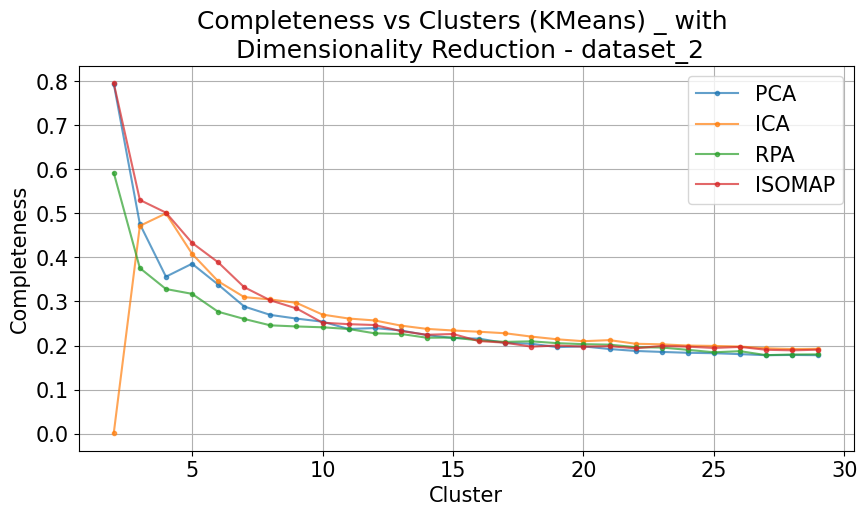

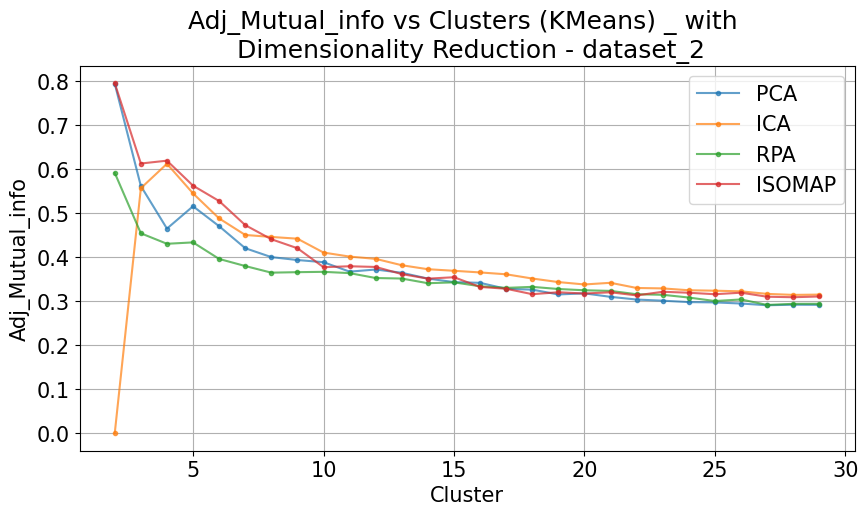

In [1162]:

df_list_kmeans_dim_red = {
i:dict()
for i in dataset_2.Clustring_with_dim_red['Kmeans']['PCA']['score_df'].columns if i != 'Cluster'

}

for i in dataset_2.Clustring_with_dim_red['Kmeans'].keys():
    
    for j in df_list_kmeans_dim_red.keys():
        
        
        
        df_list_kmeans_dim_red[j][i] = dataset_2.Clustring_with_dim_red['Kmeans'][i]['score_df'][[j,'Cluster']]
        
        
        
        #display(df_list_kmeans_dim_red[j][i]['Cluster'].head())
        df_list_kmeans_dim_red[j][i].set_index('Cluster', inplace = True)
        df_list_kmeans_dim_red[j][i].rename(columns = {j:i},inplace = True)
    
    






for j in df_list_kmeans_dim_red.keys():


    fig, ax = plt.subplots()

    
    title = j + ' vs ' + 'Clusters (KMeans) _ with \n Dimensionality Reduction - dataset_2'
    
    df__ = pd.concat(list(df_list_kmeans_dim_red[j].values()),axis =1)
    df__.plot(

    marker = '.', grid = True, ylabel = j, title = title, ax = ax , alpha = 0.7,
        figsize = [10,5]
    )
    
    
    legend = list(df__.columns.values)
    if j == 'sil_score':
        for l,k in enumerate(df__.columns):
            b = df__[k].idxmax()
            ax.axvline(x=b,
                       #linestyle='--',
                       label ='best_N_comp:', c=color[l],alpha =0.4,
                       linestyle=linestyle[l])
        
            legend.append('best_N_comp:'+k+'-'+str(b))
        
        
        ax.legend( legend,fontsize = 12)   
    
    
    
    
    plt.show()
    
    save_loss_curve(fig,title)
    

## 5.2 Expectation maximization==============

### 5.2.1 PCA --------

#### 5.2.1.a Dataset 1

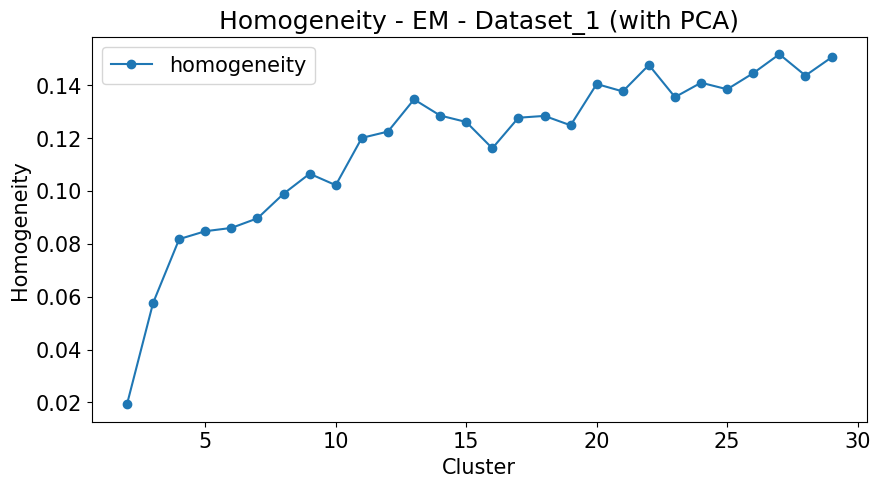

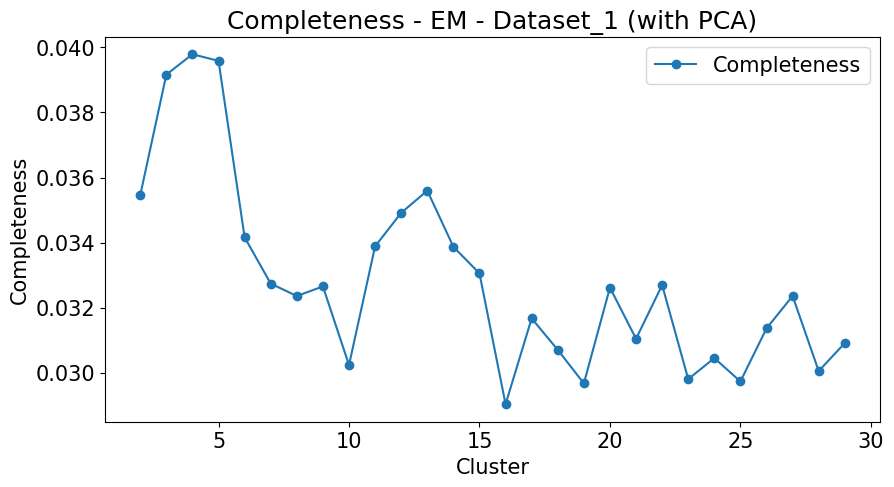

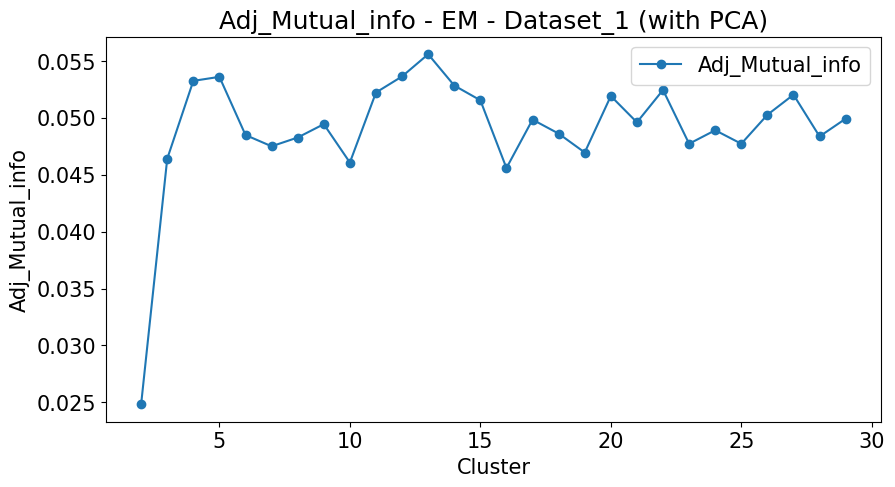

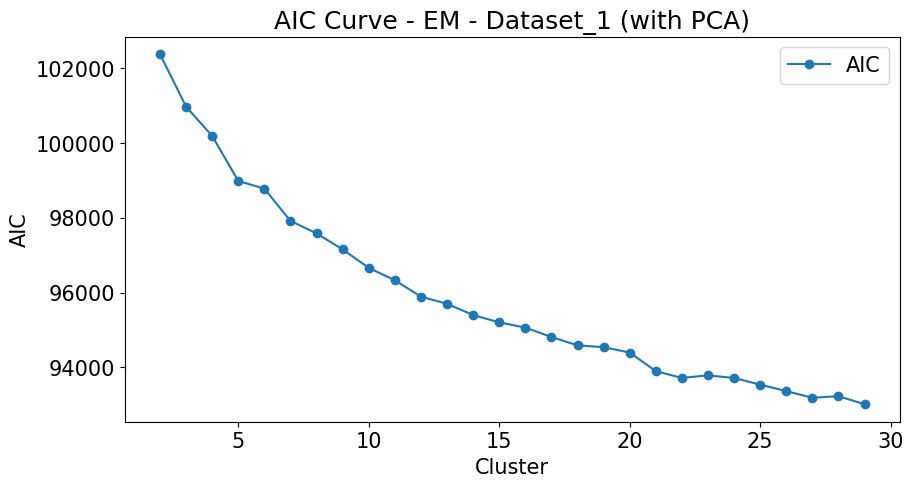

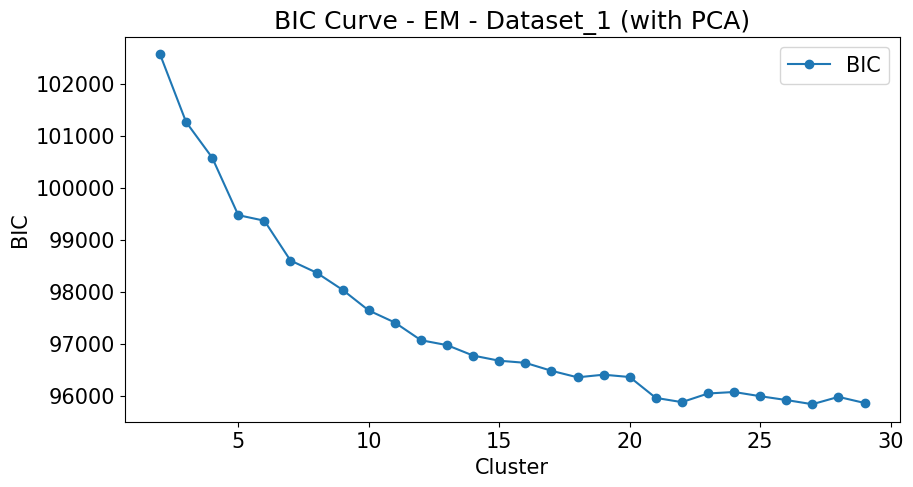

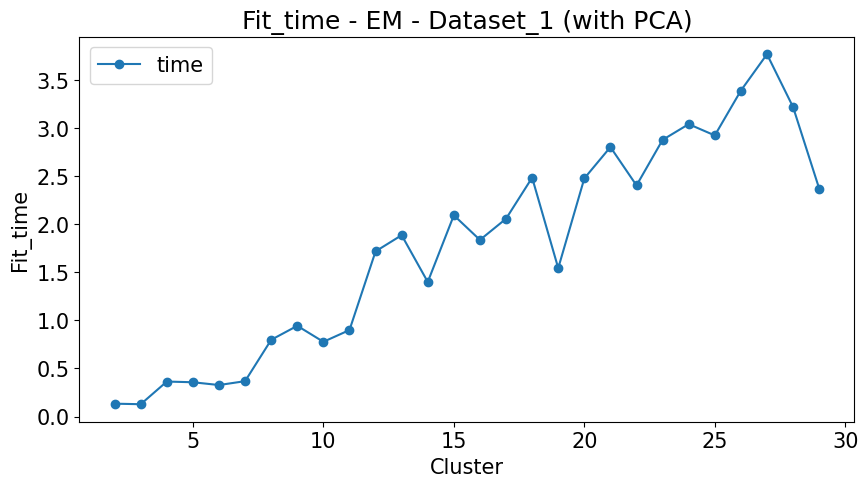

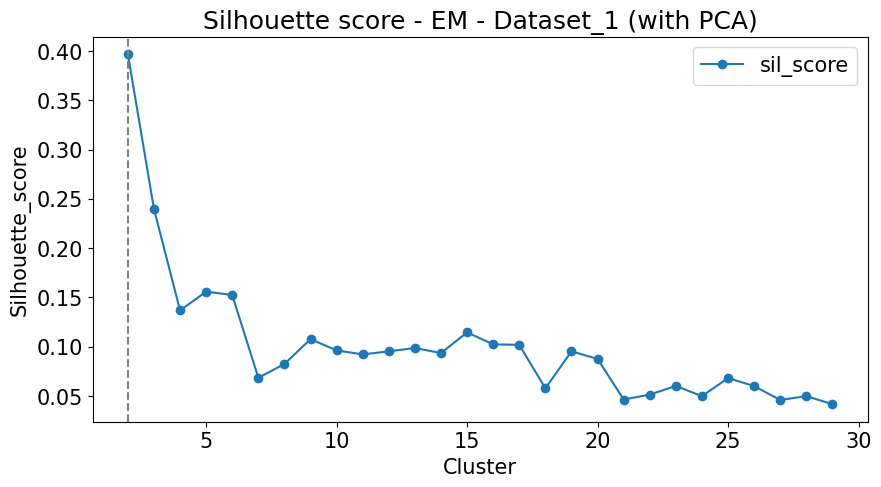

In [979]:



dataset_1.Clustring_with_dim_red['EM']['PCA']= run_EM(dataset=dataset_1,
                                                              
                                                              train ='X_train_pca_sel',
                                                              test = 'X_test_pca_sel',
                                                              
                                                              
                                                          cluster_list =np.arange(2,30,1),
                                                          random_state= 42,
                                                          n_init=10, 
                                                          return_labels = True,misc = ' (with PCA)',
                                                          plot_config = {'figsize' :[10,5]},
                                                         Dataset_name = 'Dataset_1',
                                                      
                                                      EM_params = dict(reg_covar = 1e-5)
                                                      
                                                         )
    

#### 5.2.1.b Dataset 2

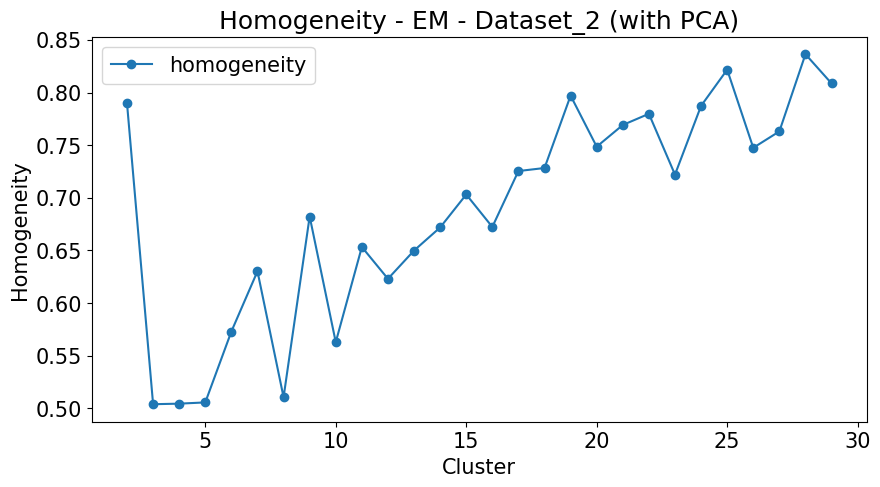

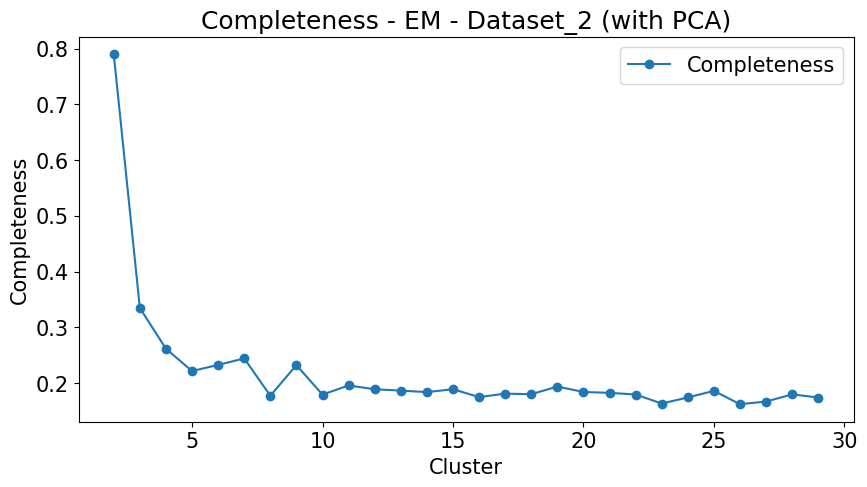

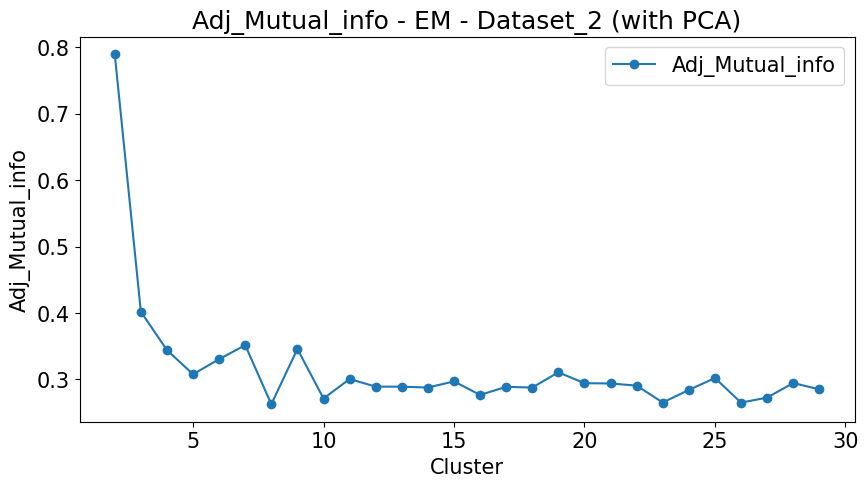

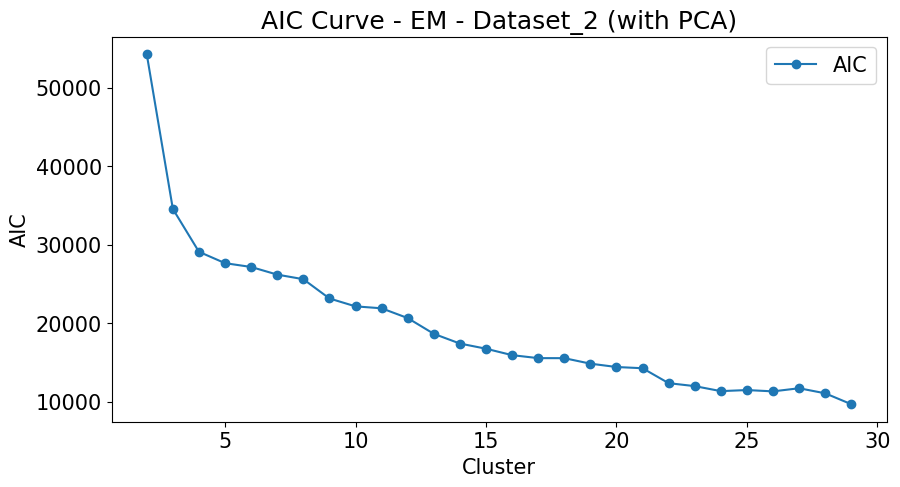

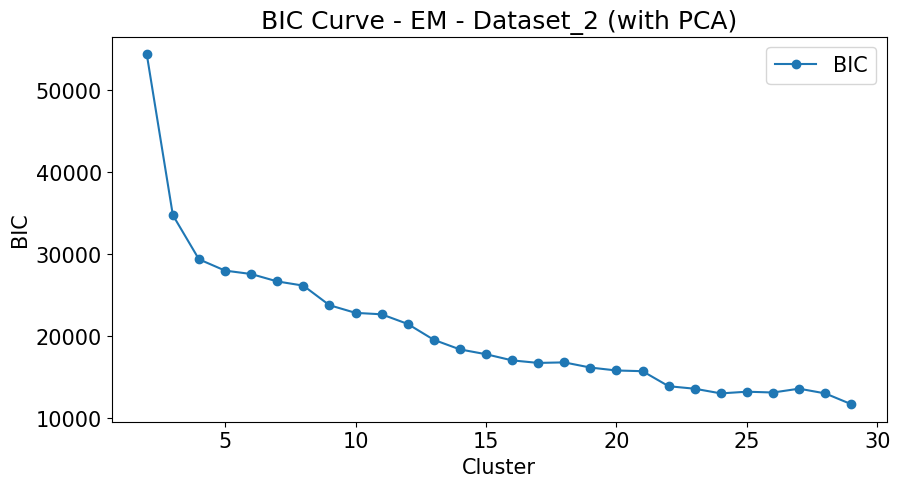

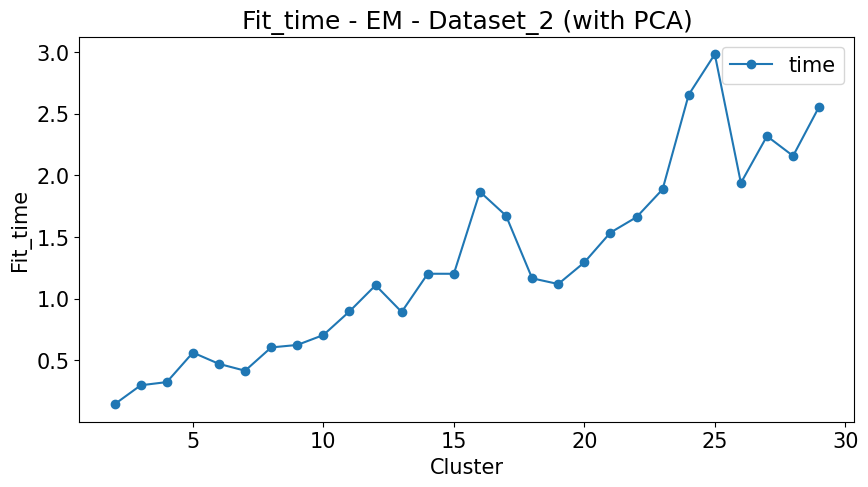

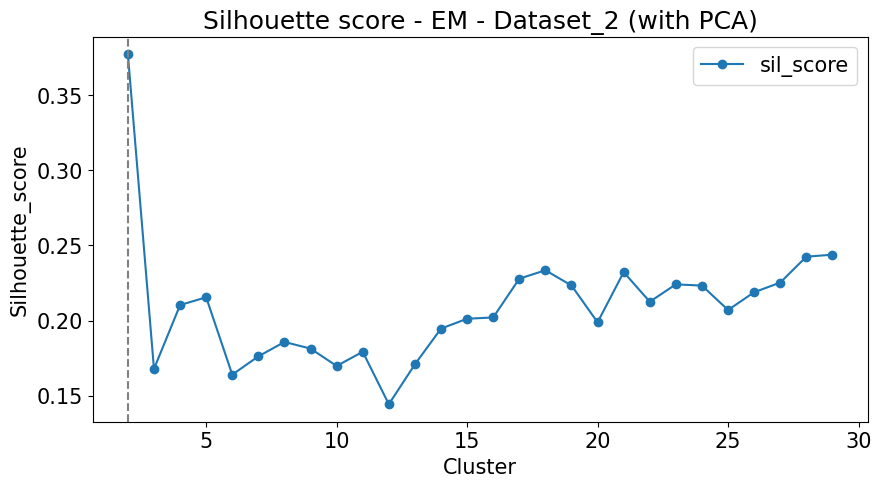

In [980]:



dataset_2.Clustring_with_dim_red['EM']['PCA']= run_EM(dataset=dataset_2,
                                                              
                                                              train ='X_train_pca_sel',
                                                              test = 'X_test_pca_sel',
                                                              
                                                              
                                                          cluster_list =np.arange(2,30,1),
                                                          random_state= 42,
                                                          n_init=10, 
                                                          return_labels = True,misc = ' (with PCA)',
                                                          plot_config = {'figsize' :[10,5]},
                                                         Dataset_name = 'Dataset_2'
                                                         )
    

### 5.2.2 ICA --------

#### 5.2.2.a Dataset 1

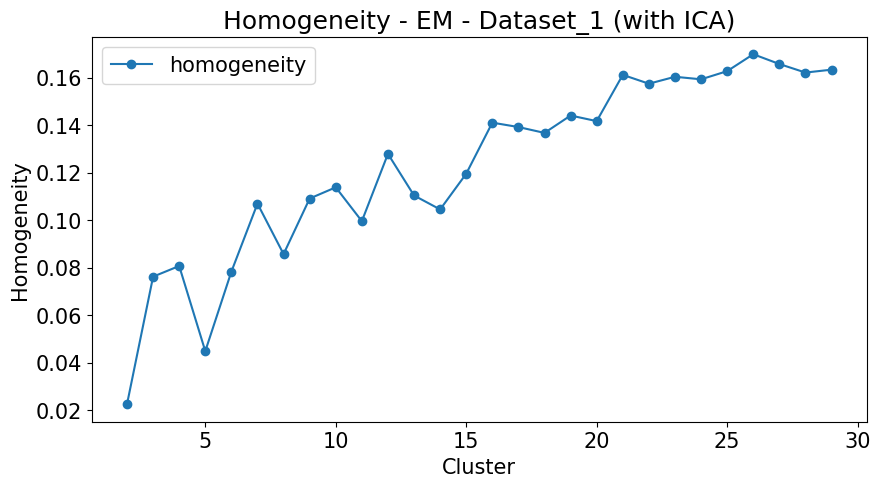

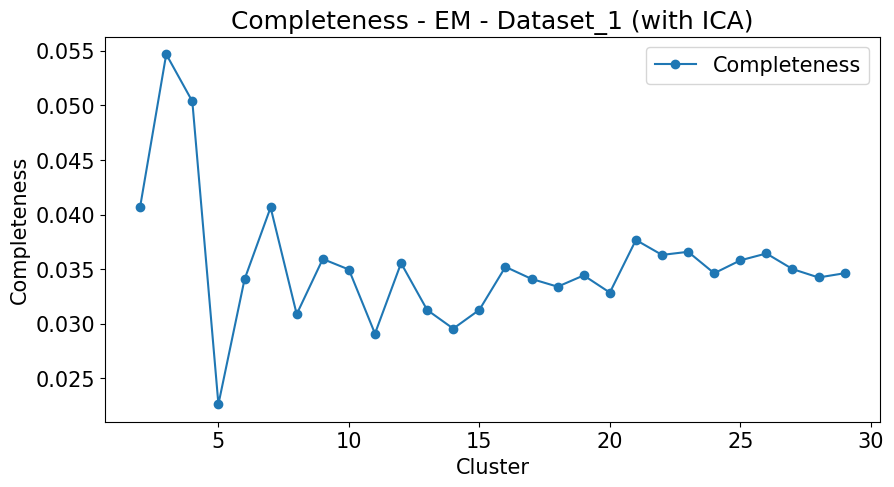

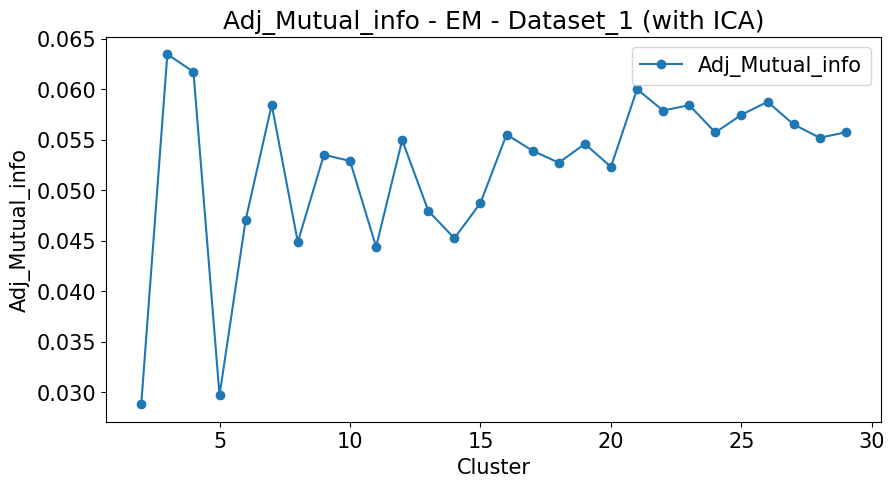

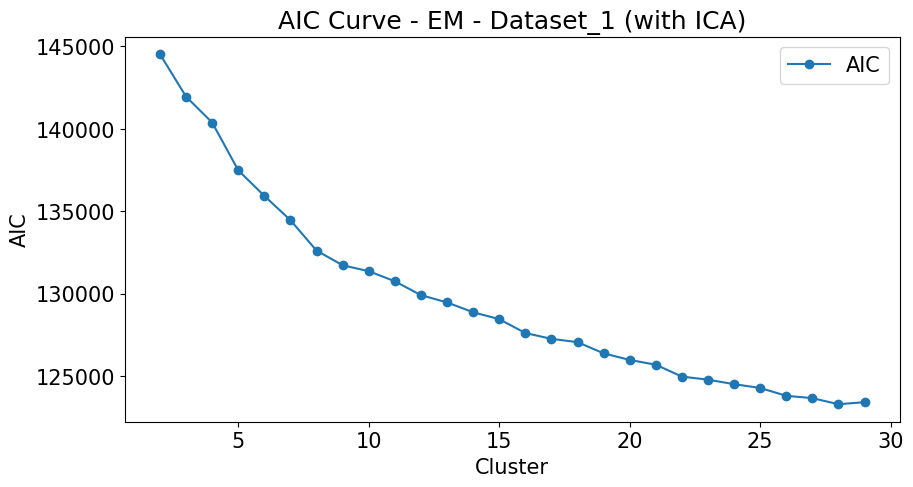

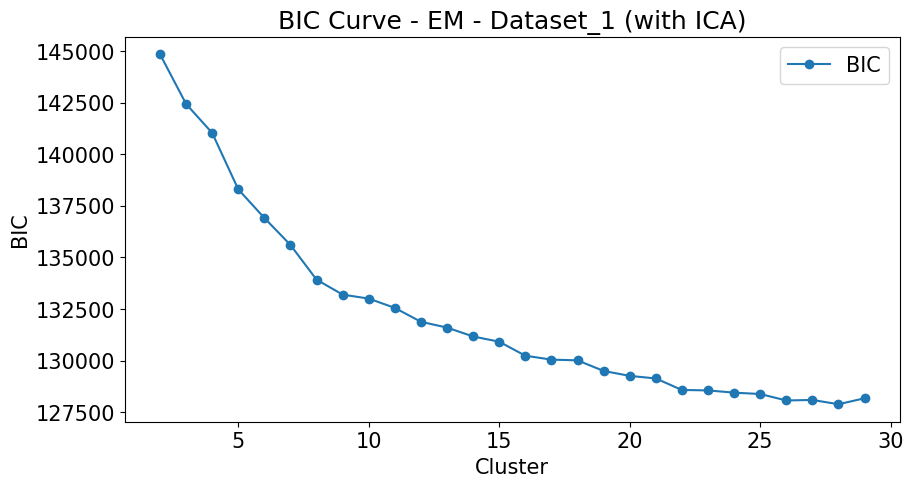

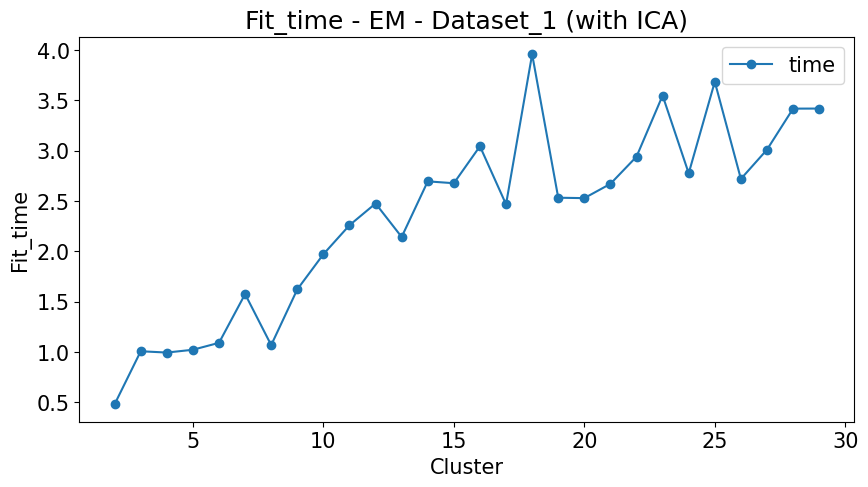

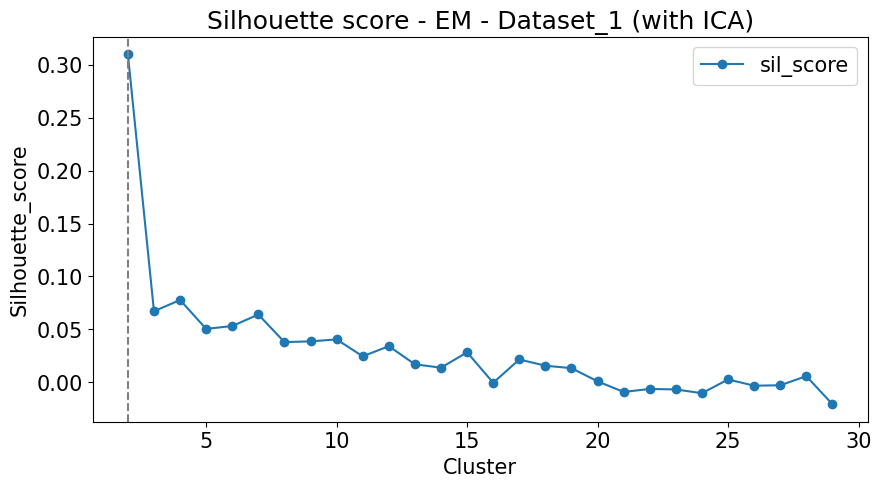

In [981]:



dataset_1.Clustring_with_dim_red['EM']['ICA']= run_EM(dataset=dataset_1,
                                                              
                                                              train ='X_train_ica',#_sel',
                                                              test = 'X_test_ica',#_sel',
                                                              
                                                              
                                                          cluster_list =np.arange(2,30,1),
                                                          random_state= 42,
                                                          n_init=10, 
                                                          return_labels = True,misc = ' (with ICA)',
                                                          plot_config = {'figsize' :[10,5]},
                                                         Dataset_name = 'Dataset_1',
                                                      
                                                      EM_params = dict(reg_covar = 1e-5)
                                                      
                                                         )
    

#### 5.2.2.b Dataset 2

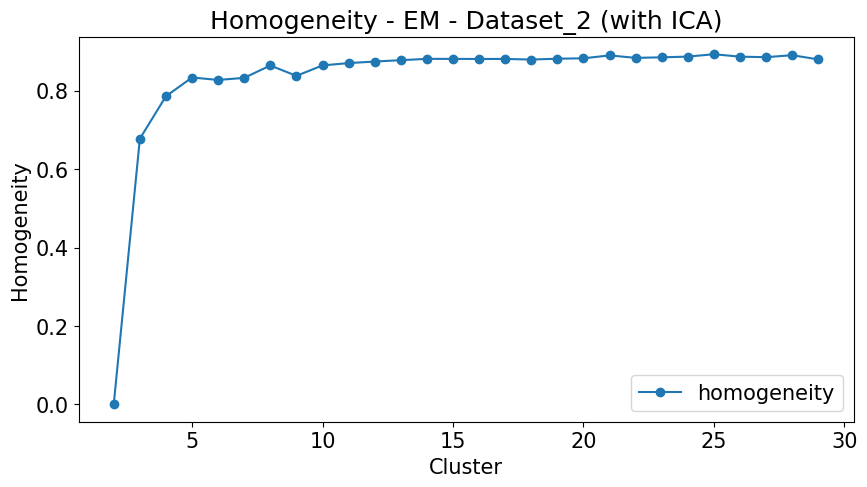

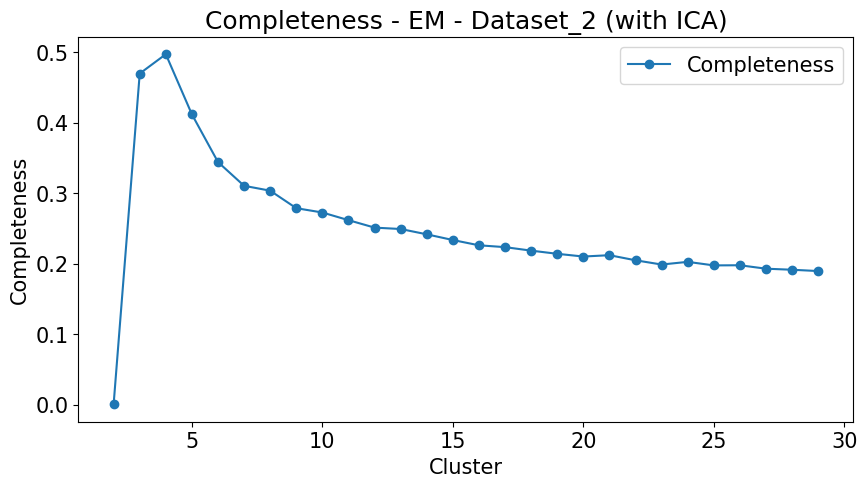

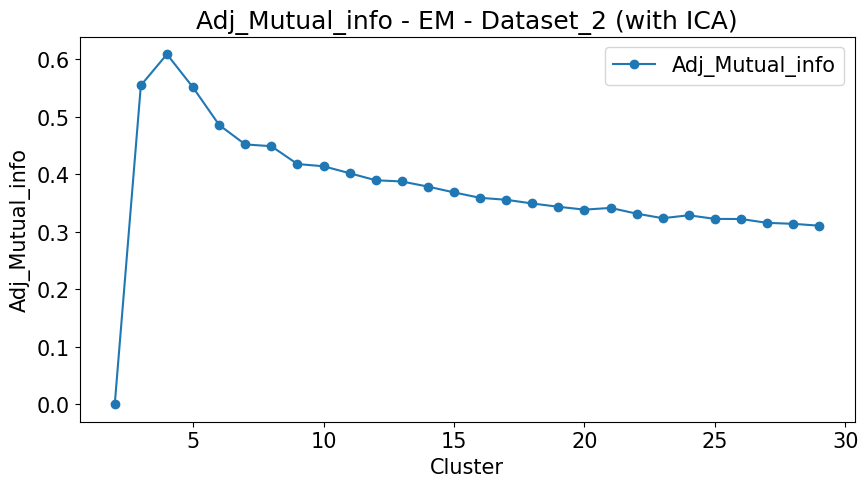

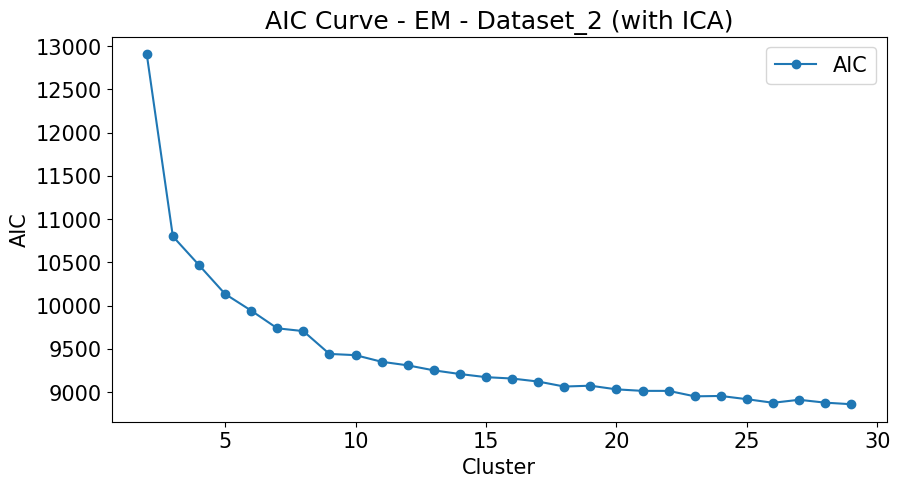

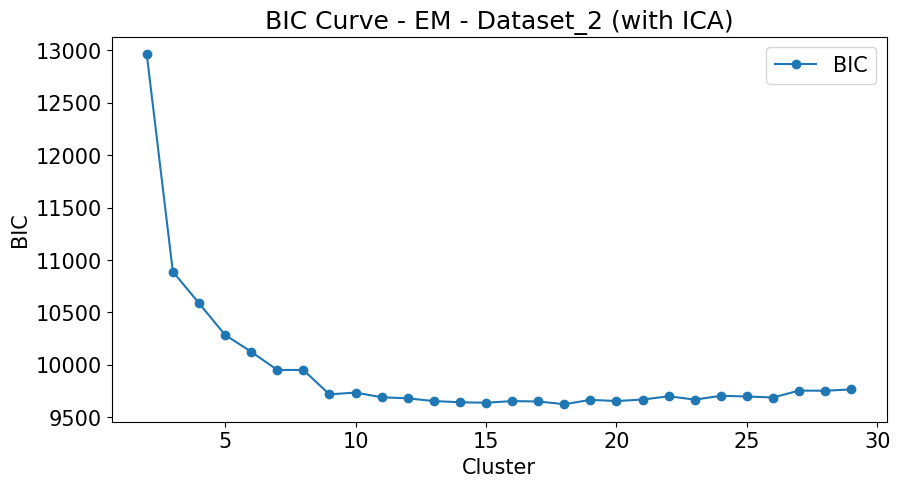

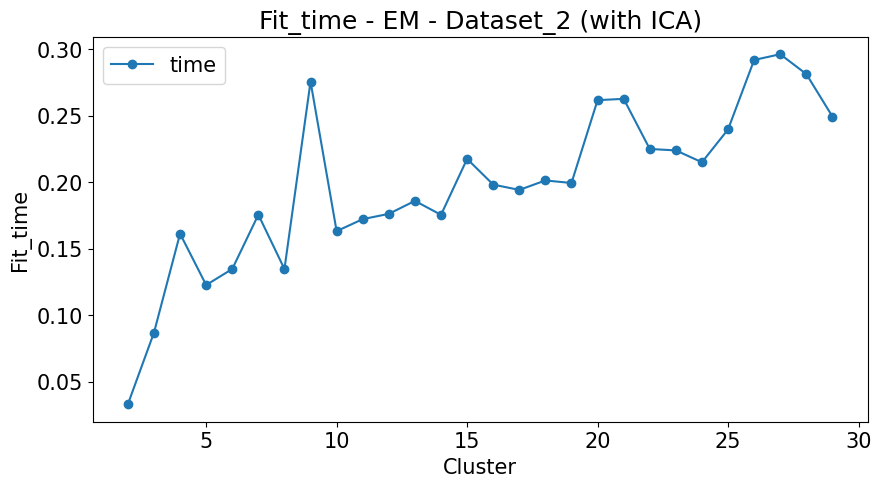

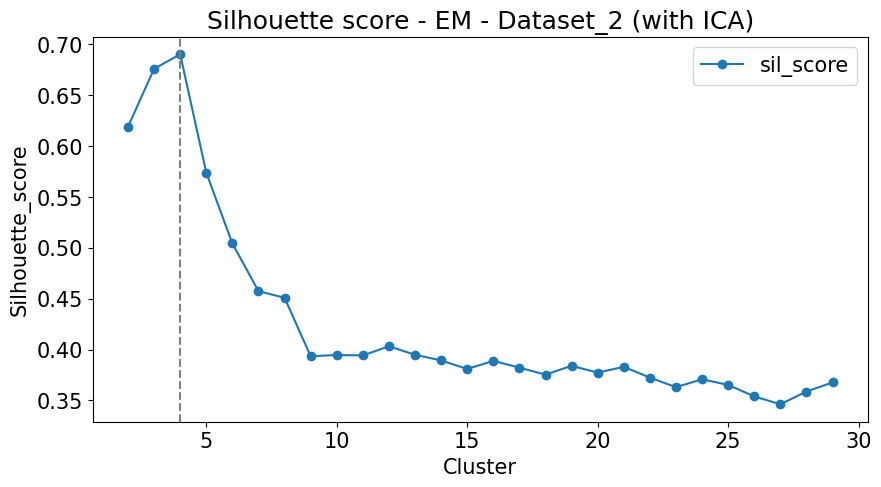

In [982]:
dataset_2.Clustring_with_dim_red['EM']['ICA']= run_EM(dataset=dataset_2,
                                                              
                                                              train ='X_train_ica',#_sel',
                                                              test = 'X_test_ica',#_sel',
                                                              
                                                              
                                                          cluster_list =np.arange(2,30,1),
                                                          random_state= 42,
                                                          n_init=10, 
                                                          return_labels = True,misc = ' (with ICA)',
                                                          plot_config = {'figsize' :[10,5]},
                                                         Dataset_name = 'Dataset_2',
                                                      
                                                      #EM_params = dict(reg_covar = 1e-5)
                                                      
                                                         )

### 5.2.3 RPA --------

#### 5.2.3.a Dataset 1

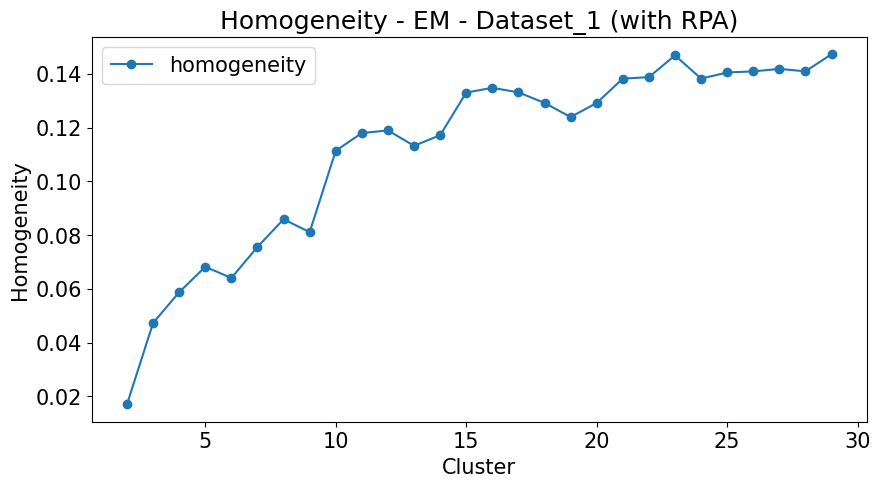

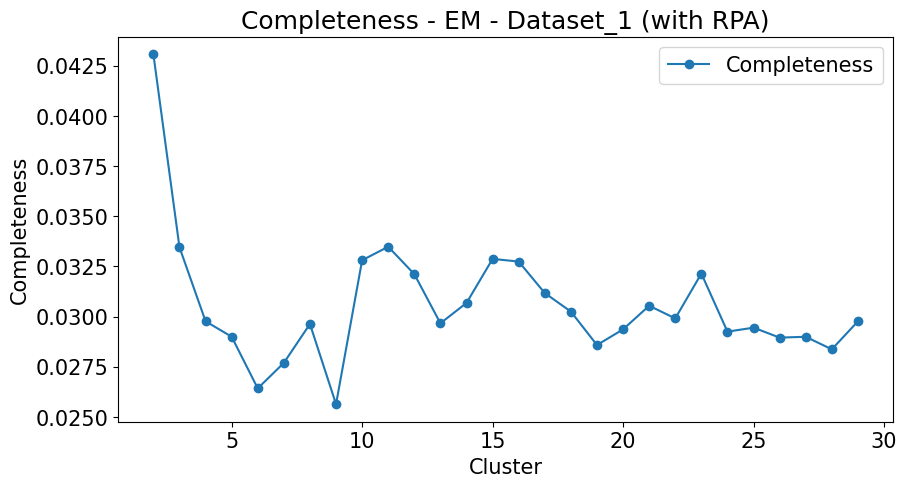

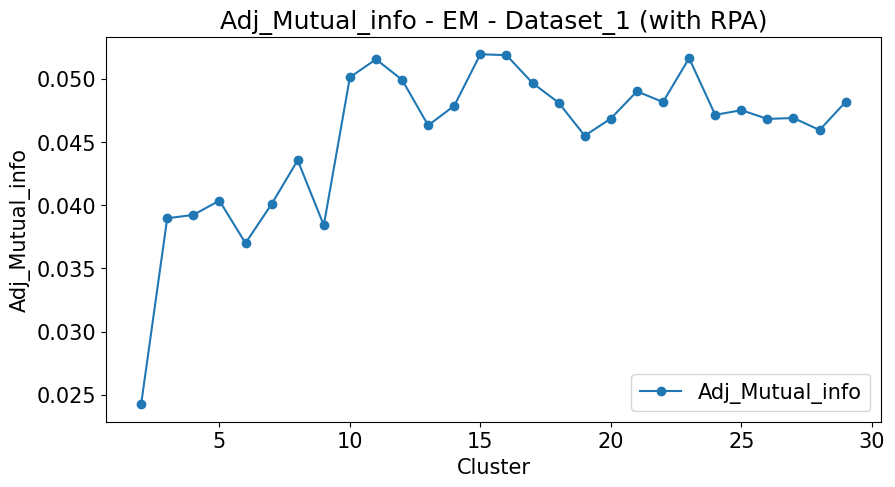

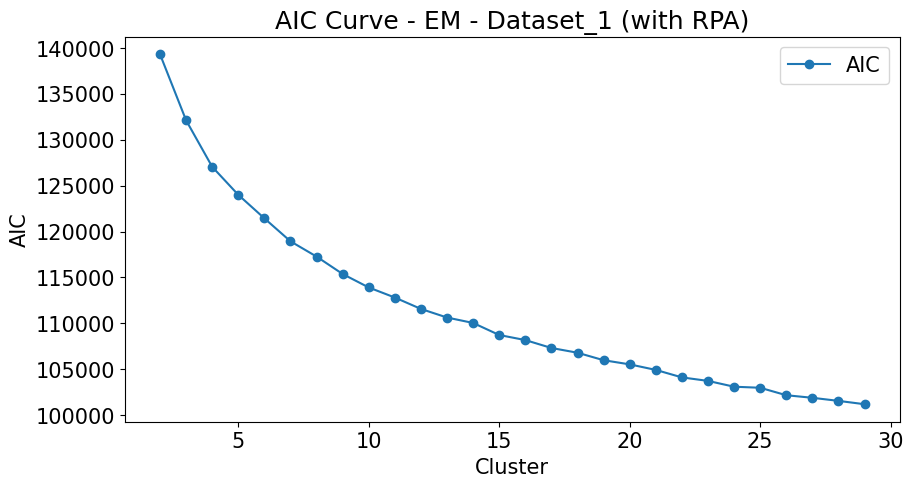

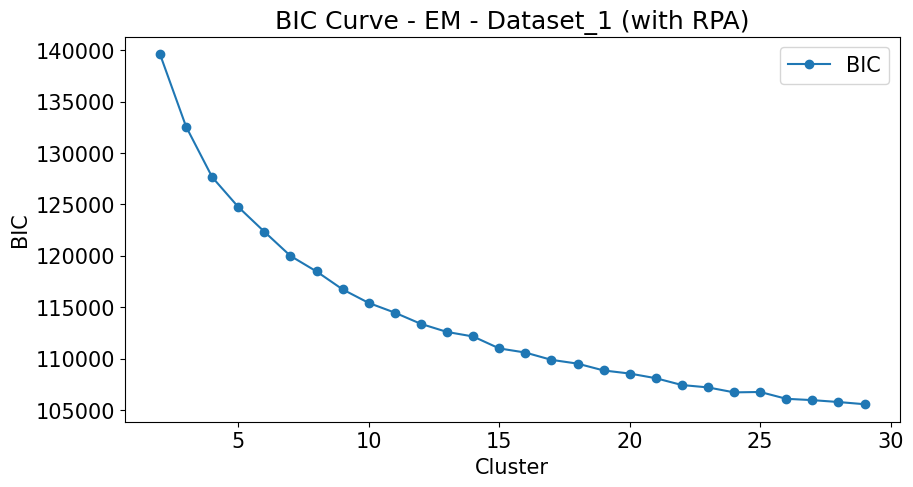

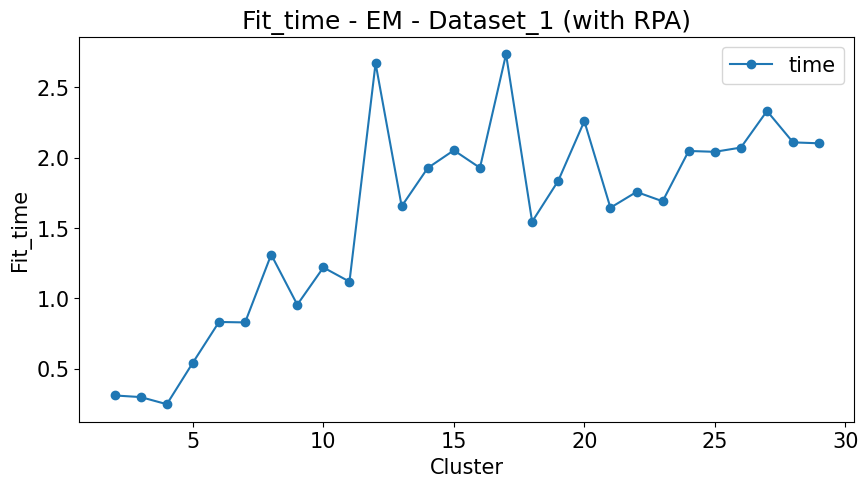

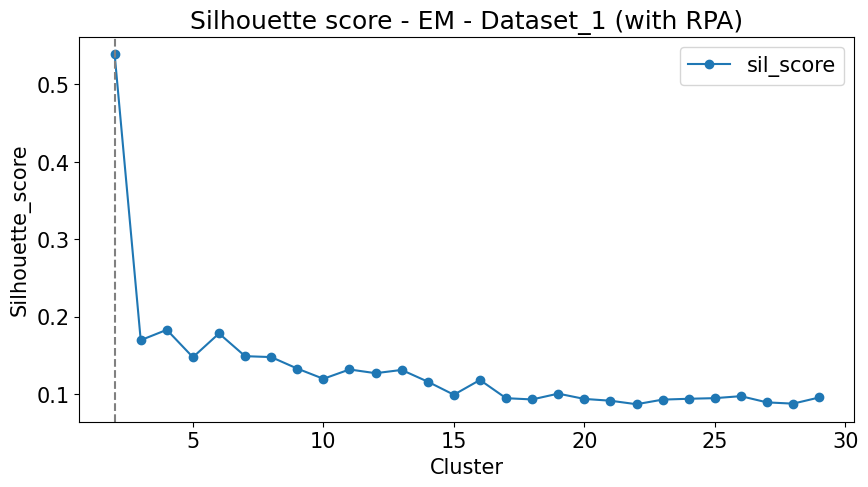

In [983]:



dataset_1.Clustring_with_dim_red['EM']['RPA']= run_EM(dataset=dataset_1,
                                                              
                                                              train ='X_train_rpa',#_sel',
                                                              test = 'X_test_rpa',#_sel',
                                                              
                                                              
                                                          cluster_list =np.arange(2,30,1),
                                                          random_state= 42,
                                                          n_init=10, 
                                                          return_labels = True,misc = ' (with RPA)',
                                                          plot_config = {'figsize' :[10,5]},
                                                         Dataset_name = 'Dataset_1',
                                                      
                                                      EM_params = dict(reg_covar = 1e-5)
                                                      
                                                         )
    

#### 5.2.3.b Dataset 2

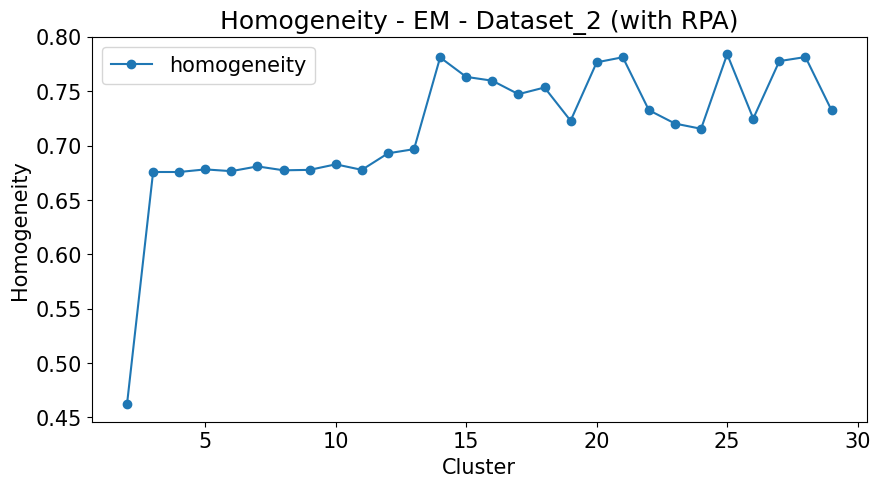

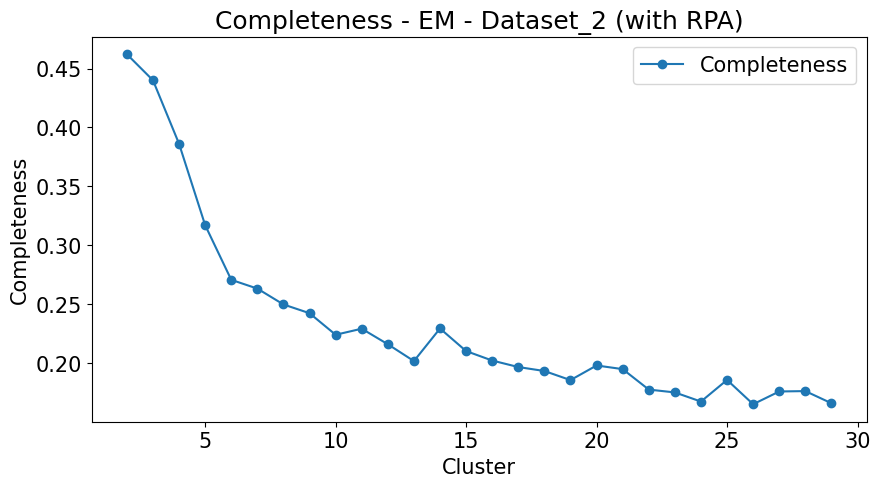

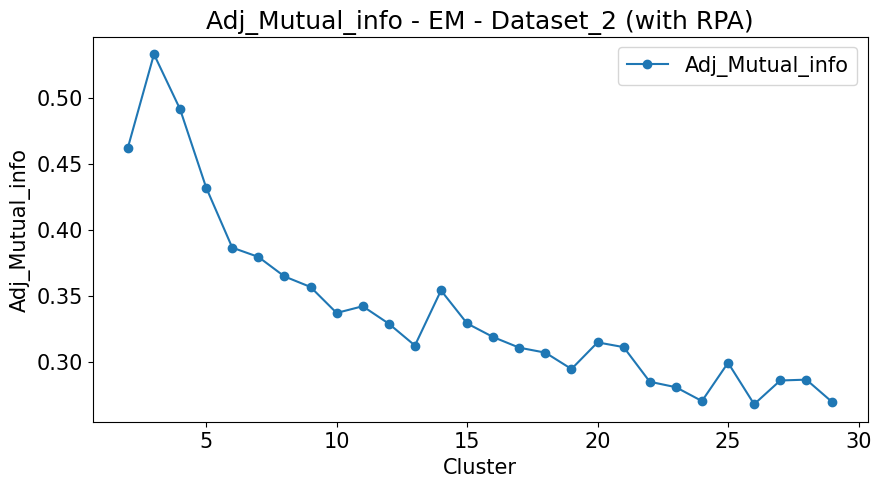

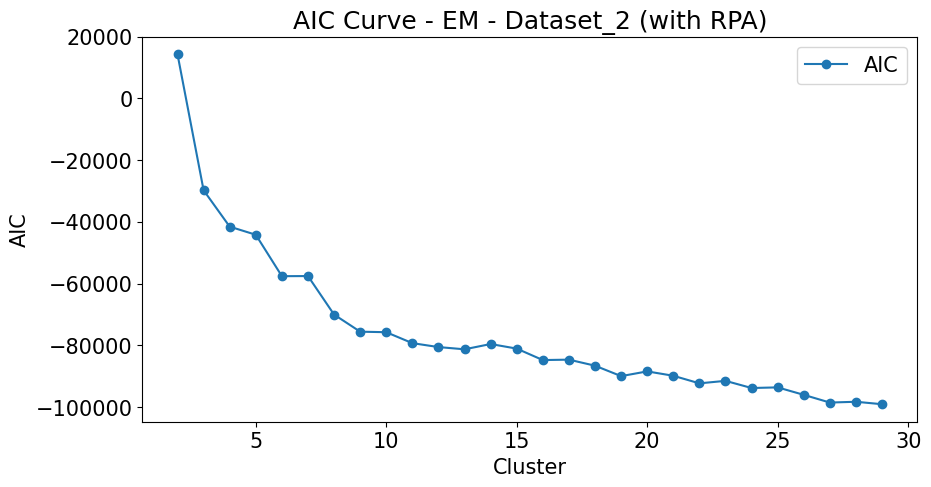

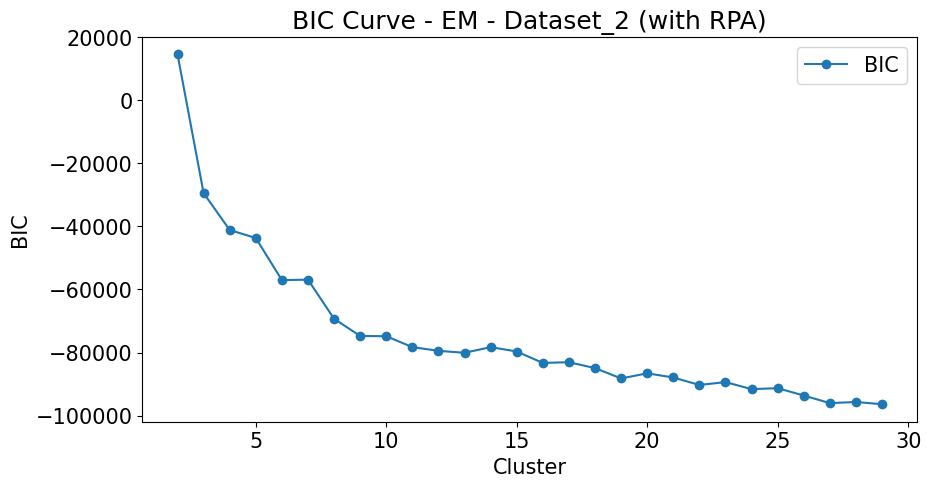

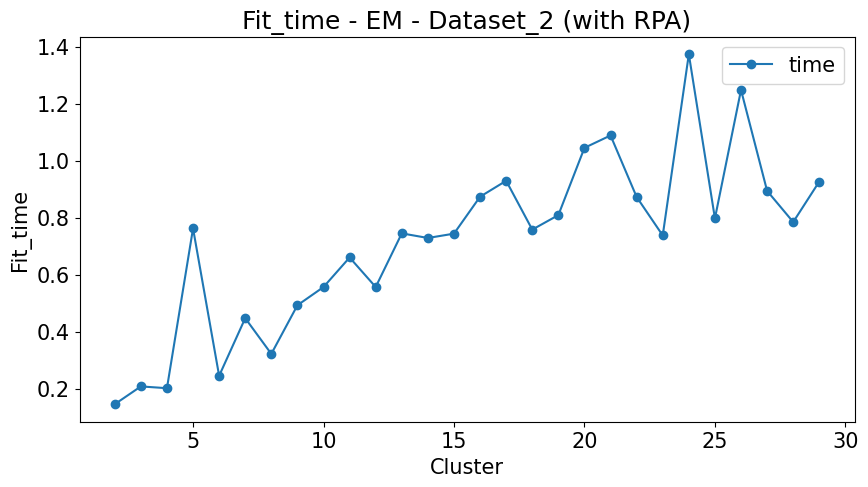

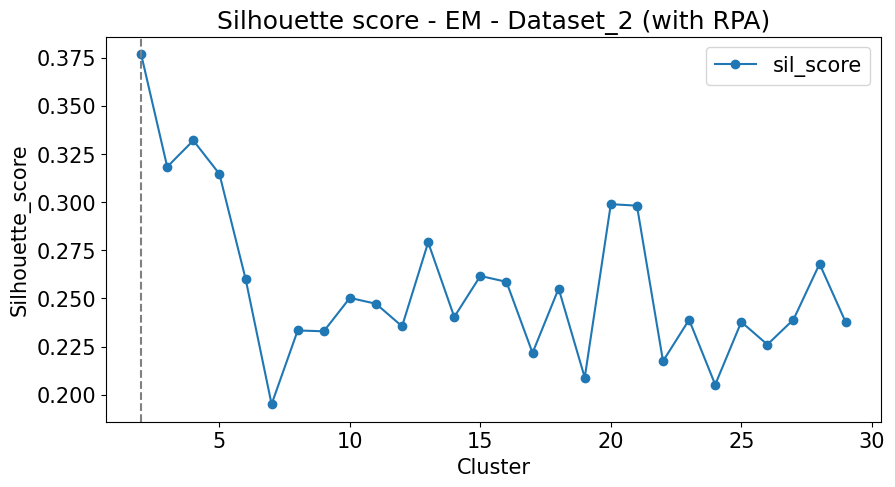

In [984]:
dataset_2.Clustring_with_dim_red['EM']['RPA']= run_EM(dataset=dataset_2,
                                                              
                                                              train ='X_train_rpa',#_sel',
                                                              test = 'X_test_rpa',#_sel',
                                                              
                                                              
                                                          cluster_list =np.arange(2,30,1),
                                                          random_state= 42,
                                                          n_init=10, 
                                                          return_labels = True,misc = ' (with RPA)',
                                                          plot_config = {'figsize' :[10,5]},
                                                         Dataset_name = 'Dataset_2',
                                                      
                                                      #EM_params = dict(reg_covar = 1e-5)
                                                      
                                                         )

### 5.2.4 Isomap --------

#### 5.2.4.a Dataset 1

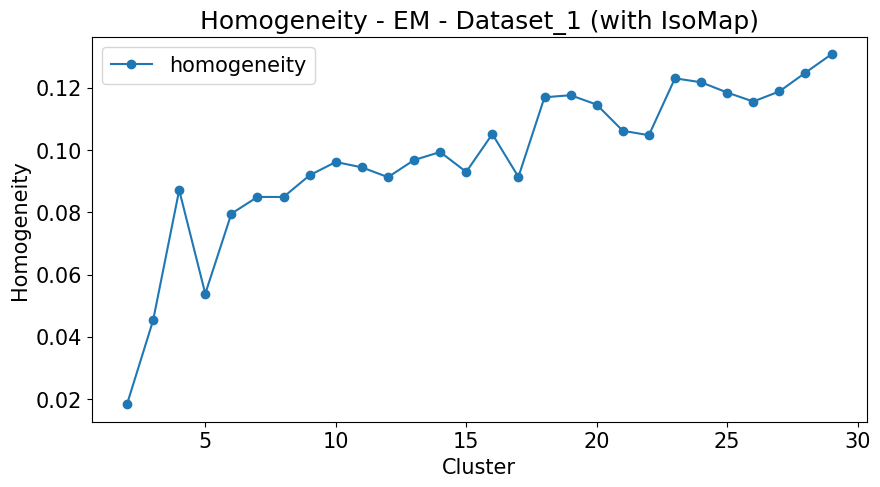

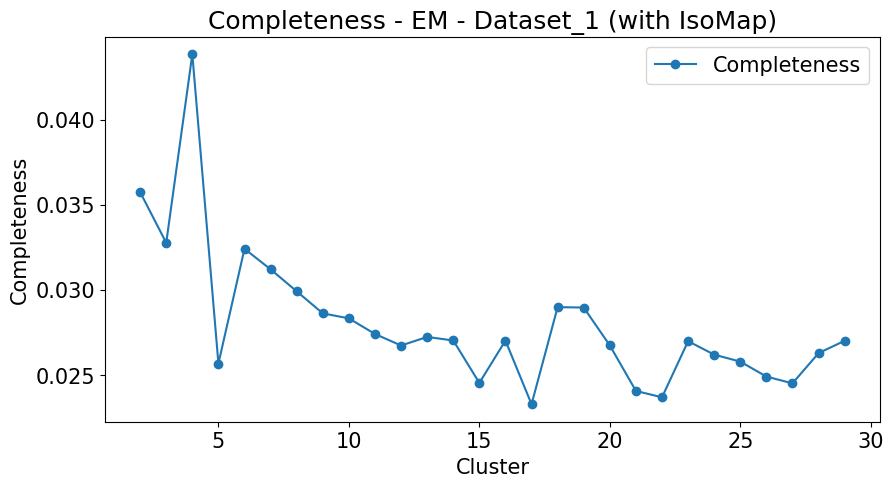

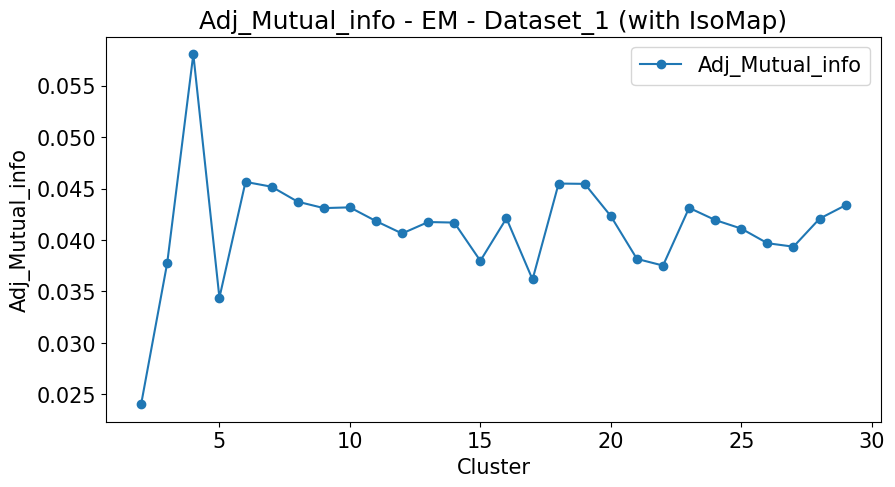

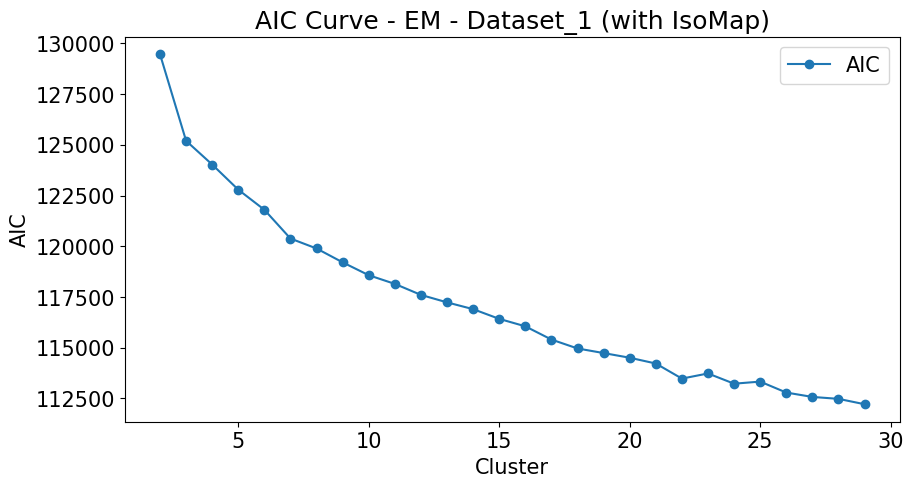

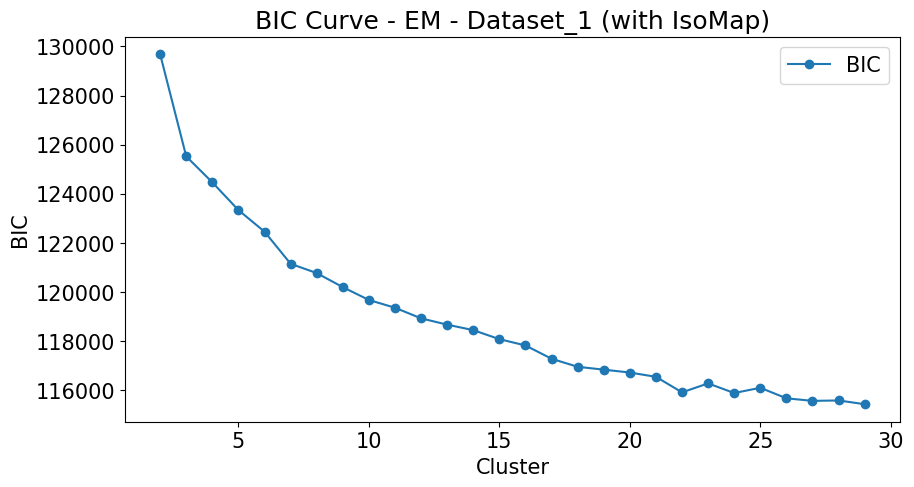

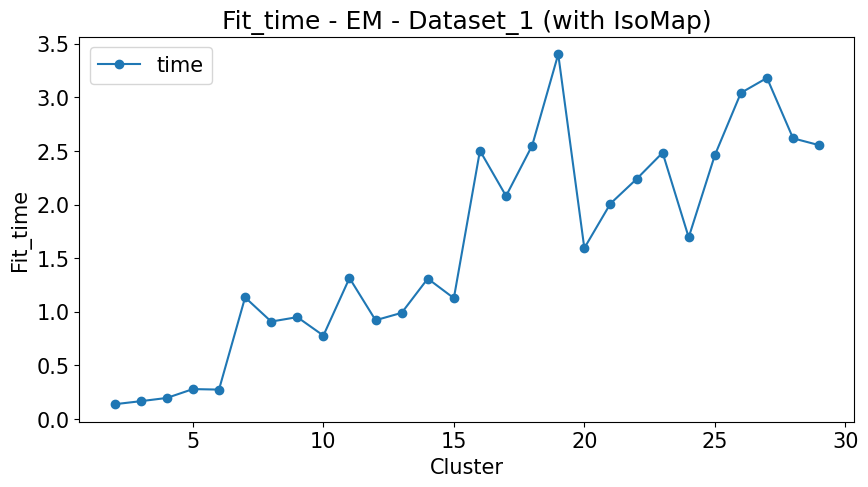

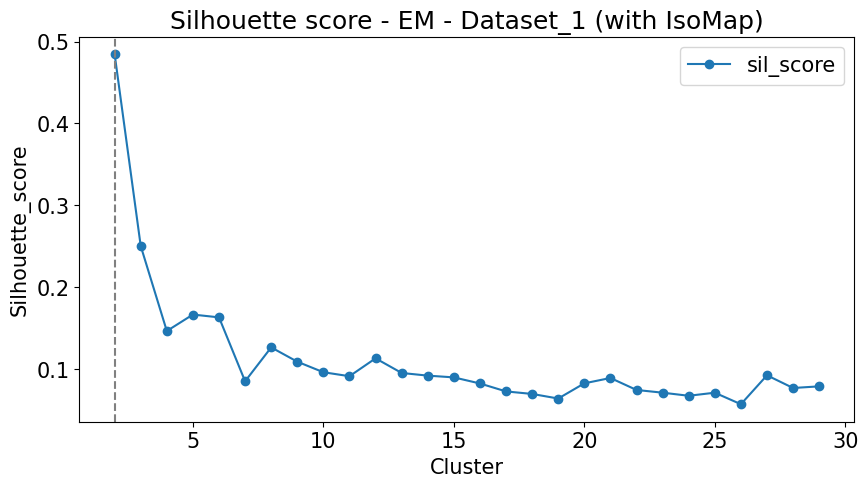

In [988]:
dataset_1.Clustring_with_dim_red['EM']['ISOMAP']= run_EM(dataset=dataset_1,
                                                              
                                                              train ='X_train_isomap',
                                                              test = 'X_test_isomap',
                                                              
                                                              
                                                          cluster_list =np.arange(2,30,1),
                                                          random_state= 42,
                                                          n_init=10, 
                                                          return_labels = True,misc = ' (with IsoMap)',
                                                          plot_config = {'figsize' :[10,5]},
                                                         Dataset_name = 'Dataset_1',
                                                         
                                                         EM_params = dict(reg_covar = 1e-5)
                                                         
                                                         )
    



#### 5.2.4.b Dataset 2

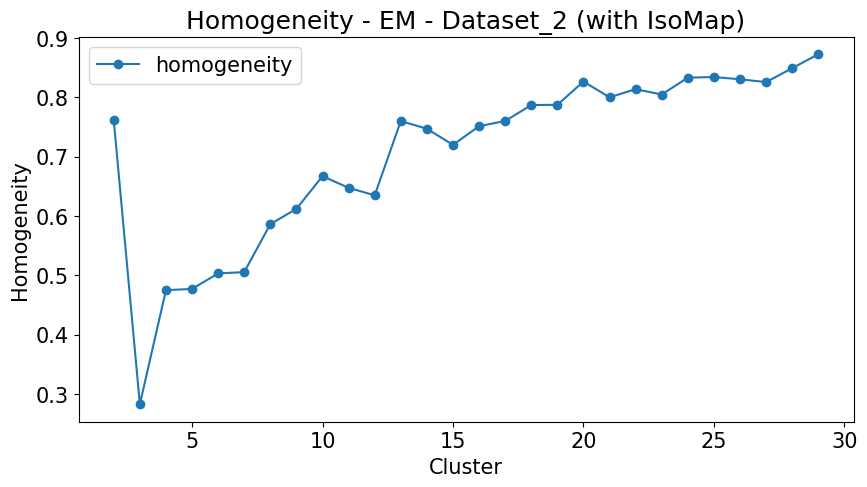

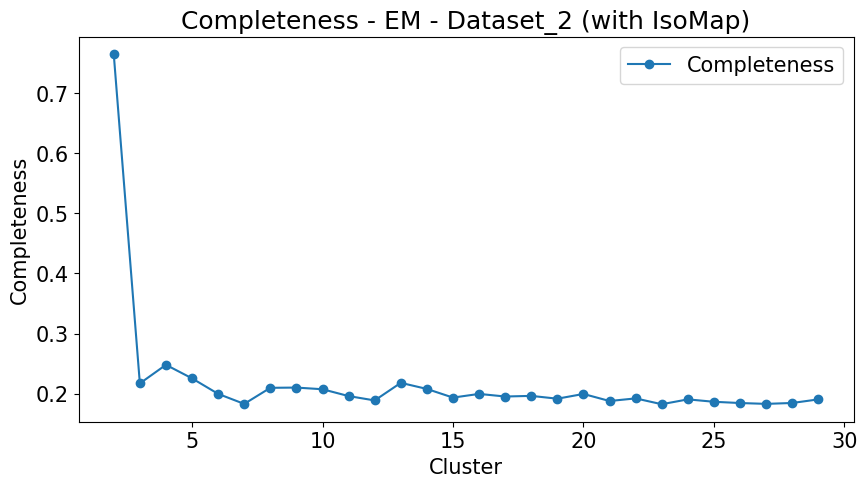

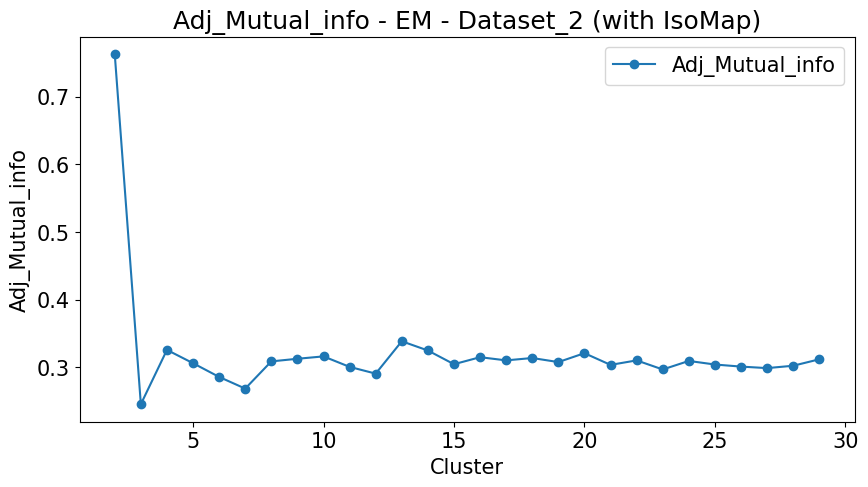

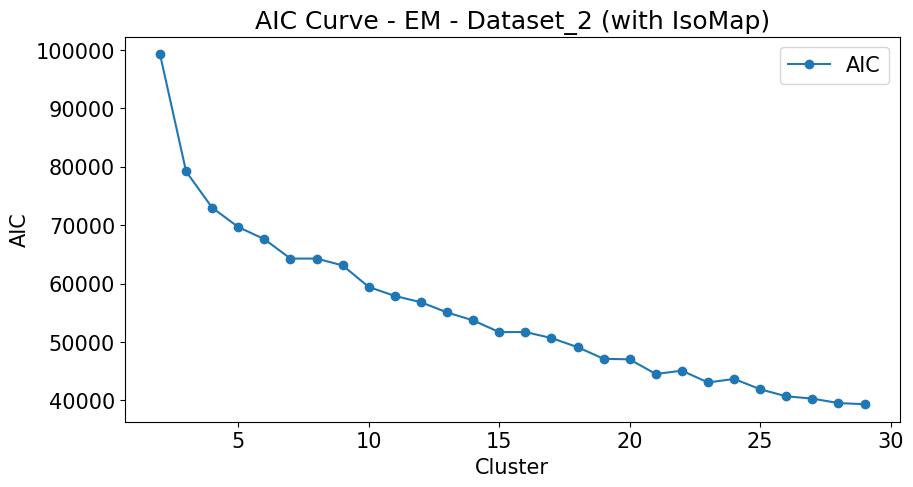

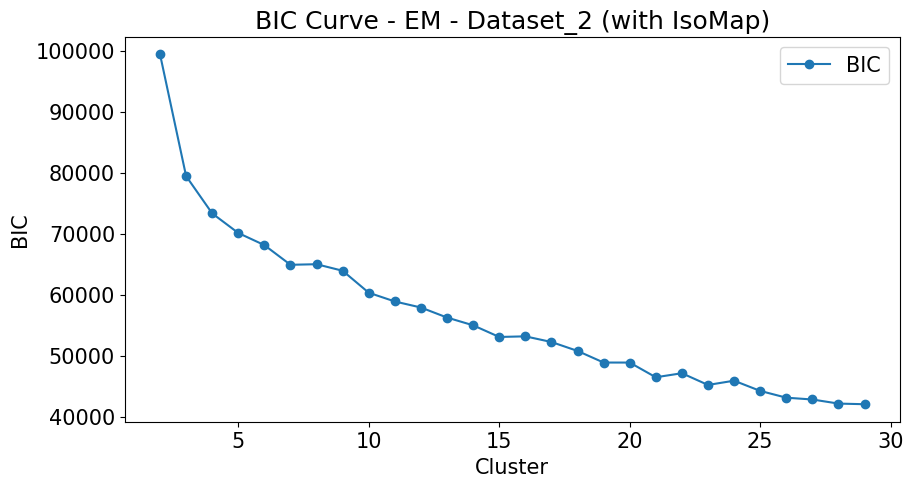

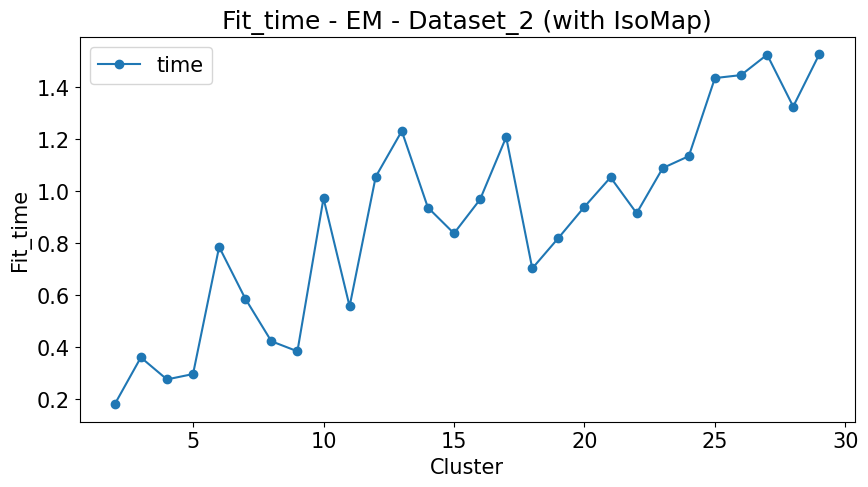

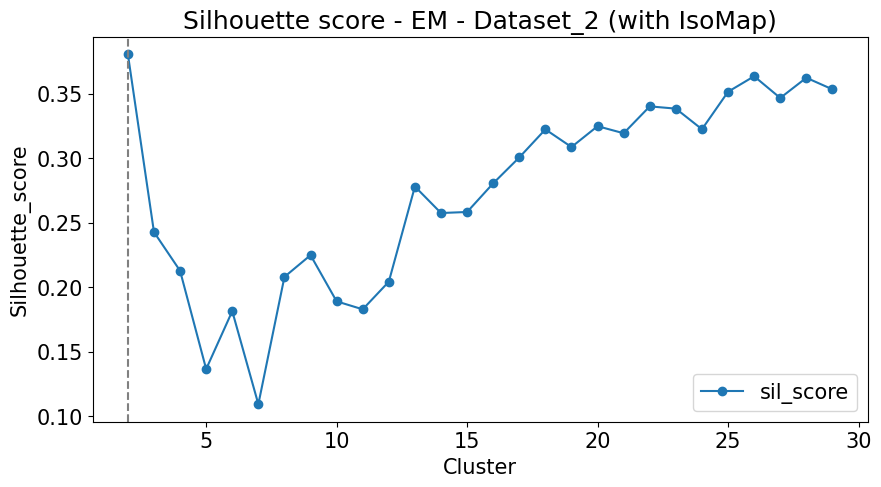

In [989]:


dataset_2.Clustring_with_dim_red['EM']['ISOMAP']= run_EM(dataset=dataset_2,
                                                              
                                                              train ='X_train_isomap',
                                                              test = 'X_test_isomap',
                                                              
                                                              
                                                          cluster_list =np.arange(2,30,1),
                                                          random_state= 42,
                                                          n_init=10, 
                                                          return_labels = True,misc = ' (with IsoMap)',
                                                          plot_config = {'figsize' :[10,5]},
                                                         Dataset_name = 'Dataset_2'
                                                         )


                                                      #EM_params = dict(reg_covar = 1e-5)


### Create Combined Visualization

#### Dataset 1

/var/folders/vq/040zg8m163g9p8bh9v8lz33m0000gn/T/ipykernel_49889/3945296727.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_list_EM_dim_red[j][i].rename(columns = {j:i},inplace = True)
/var/folders/vq/040zg8m163g9p8bh9v8lz33m0000gn/T/ipykernel_49889/3945296727.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_list_EM_dim_red[j][i].rename(columns = {j:i},inplace = True)
/var/folders/vq/040zg8m163g9p8bh9v8lz33m0000gn/T/ipykernel_49889/3945296727.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/p

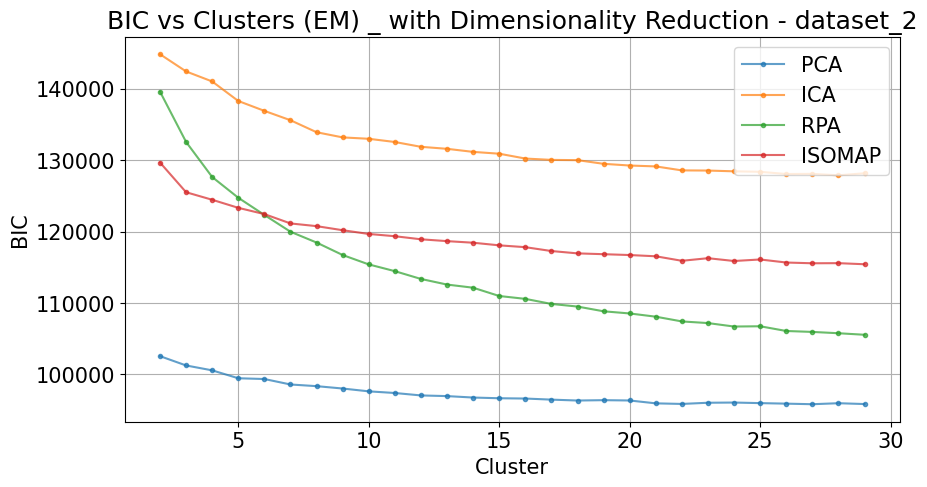

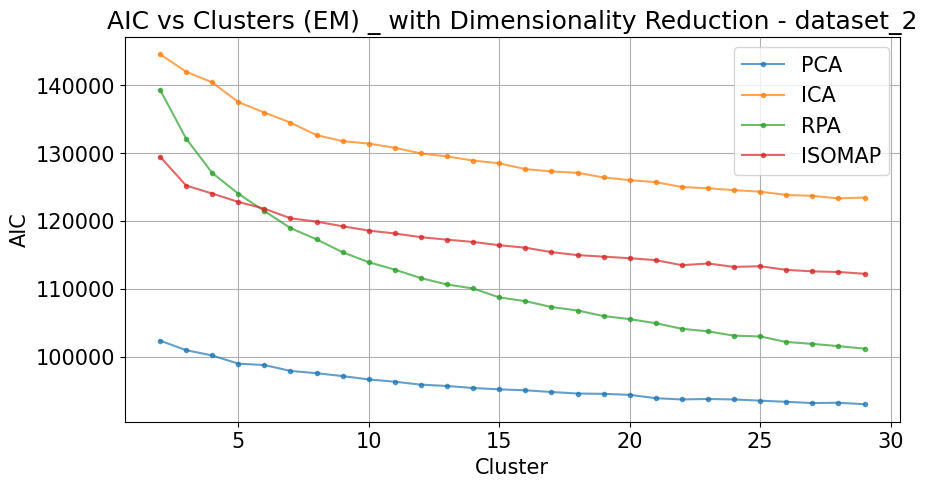

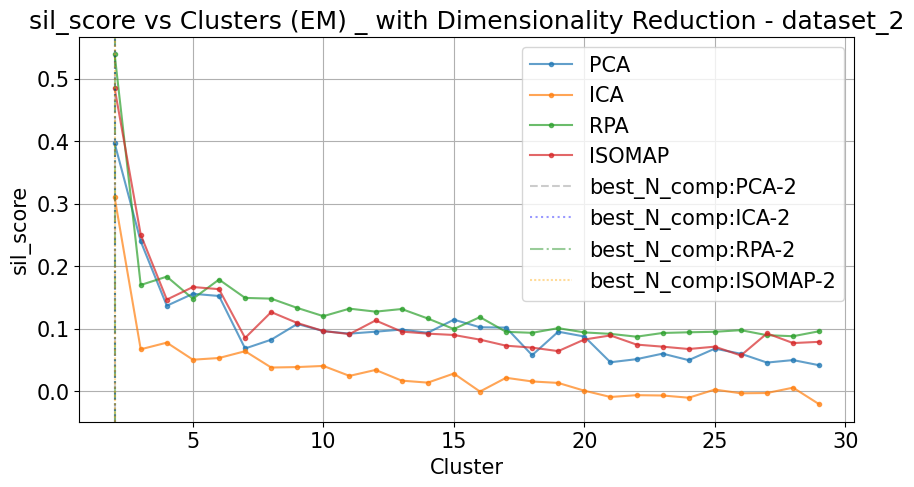

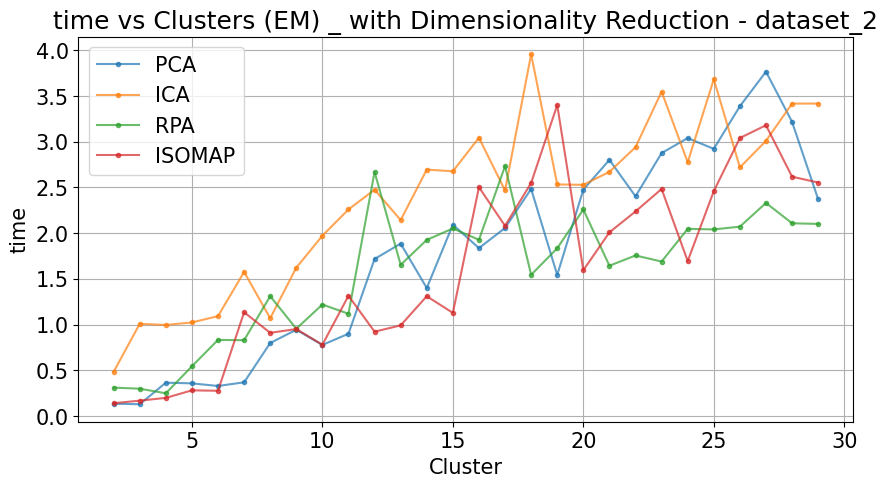

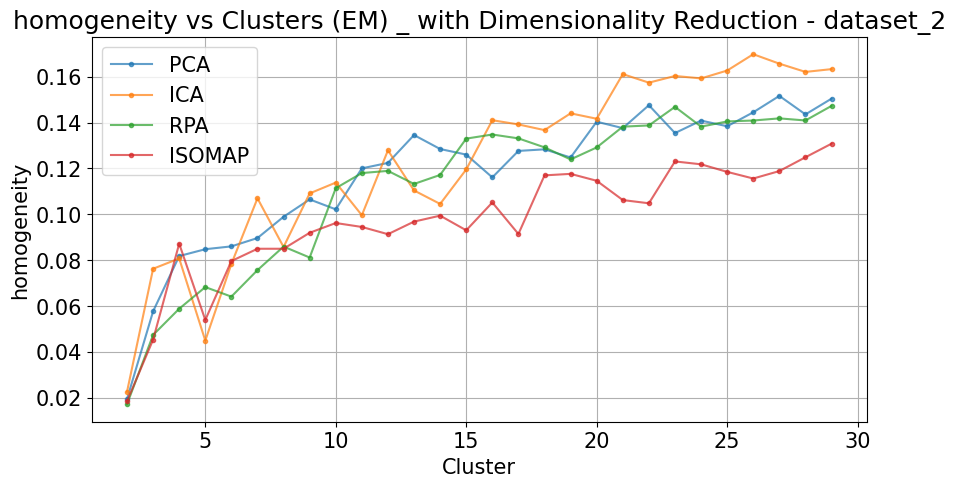

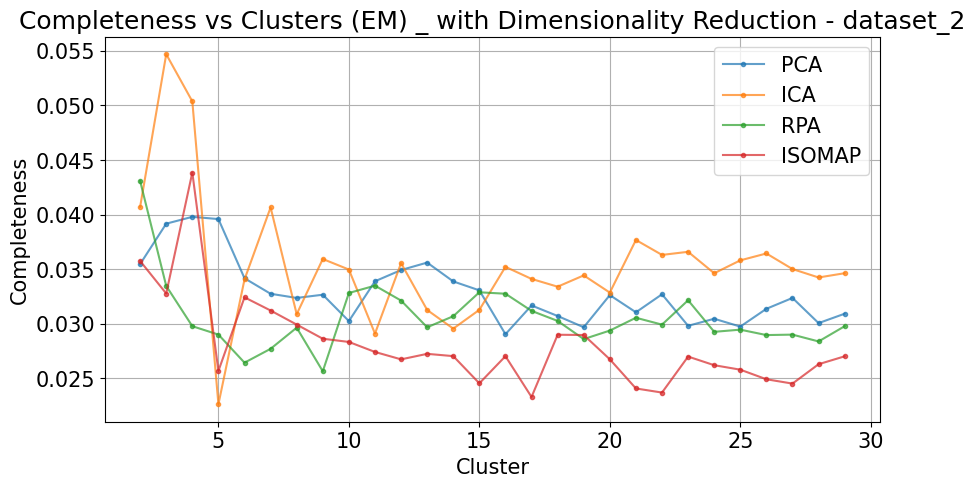

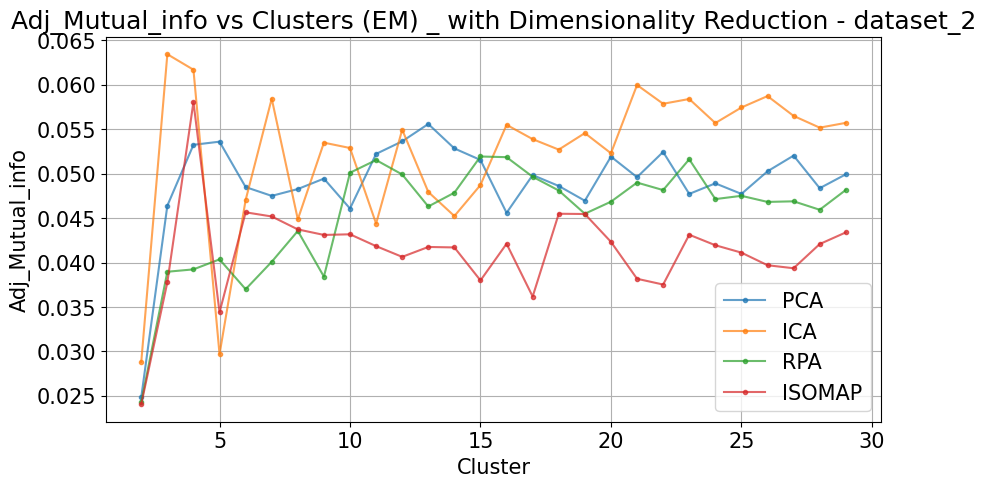

In [1103]:

df_list_EM_dim_red = {
i:dict()
for i in dataset_1.Clustring_with_dim_red['EM']['PCA']['score_df'].columns if i != 'Cluster'

}

for i in dataset_1.Clustring_with_dim_red['EM'].keys():
    
    for j in df_list_EM_dim_red.keys():
        
        
        
        df_list_EM_dim_red[j][i] = dataset_1.Clustring_with_dim_red['EM'][i]['score_df'][[j,'Cluster']]
        
        
        
        #display(df_list_kmeans_dim_red[j][i]['Cluster'].head())
        df_list_EM_dim_red[j][i].set_index('Cluster', inplace = True)
        df_list_EM_dim_red[j][i].rename(columns = {j:i},inplace = True)
    
    






for j in df_list_EM_dim_red.keys():


    fig, ax = plt.subplots()

    
    title = j + ' vs ' + 'Clusters (EM) _ with Dimensionality Reduction - dataset_2'
    
    df__ = pd.concat(list(df_list_EM_dim_red[j].values()),axis =1)
    df__.plot(

    marker = '.', grid = True, ylabel = j, title = title, ax = ax , alpha = 0.7,
        figsize = [10,5]
    )
    
    legend = list(df__.columns.values)
    if j == 'sil_score':
        for l,k in enumerate(df__.columns):
            b = df__[k].idxmax()
            ax.axvline(x=b,
                       #linestyle='--',
                       label ='best_N_comp:', c=color[l],alpha =0.4,
                       linestyle=linestyle[l])
        
            legend.append('best_N_comp:'+k+'-'+str(b))
        
        
        ax.legend( legend)   
    
    
    
    
    
    
    
    plt.show()
    
    save_loss_curve(fig,title)
    

In [990]:
dataset_1.save()
dataset_2.save()

# 6.  Neural Network - with Dim Red.

## 6.1 PCA : dataset 2

### - Grid search

In [ ]:
### Create Combined Visualization

In [712]:
#Grid search over PCA

dataset_2.NN_with_dim_red['PCA'] = handle_nn(dataset_2,
              NN_all_hyps_curves_all=NN_all_hyps_curves_all,
              NN_2_GS_params=NN_2_GS_params,
             NN_pipe = NN_pipe, GS=GS, type_='',
             dataset_name='dataset_2',
             misc ="NN_with_DIM_PCA"
             ,train = 'X_train_pca_sel',
               test = 'X_test_pca_sel',
              plot_config = dict({})             
             )

{'best_score': -0.07073084814657124, 'best_params': {'batch_size': 64, 'hidden_layer_sizes': (64, 32), 'learning_rate_init': 0.1, 'momentum': 1e-04, 'random_state': 1}}
------ dataset_2_NN_with_DIM_PCA
{'homogeneity': 0.8365707545899349, 'Completeness': 0.8371185648551159, 'Adj_Mutual_info': 0.8368151283336465, 'best_test_accuracy': -0.06566061428325964}


### - Finding best iteration : epoch learning curve

val -0.05207211476834469 epoch (array([813]),)


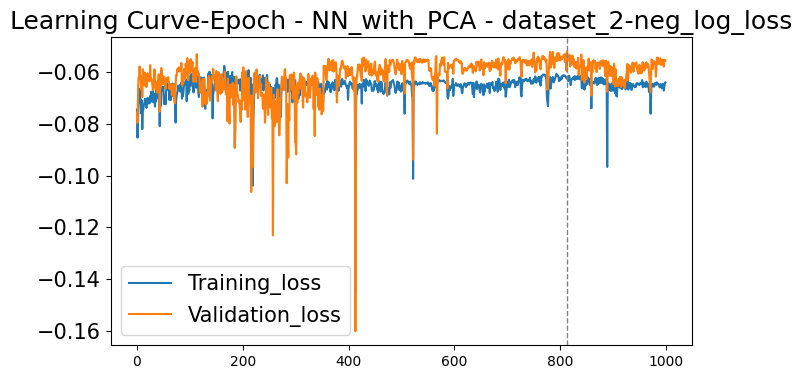

In [720]:



#epochs
epochs = 200

NN_pipe_epochs_2 = NNC(early_stopping=False,
                                   random_state = 1,
                                  
                                  **{'batch_size': 64, 
                                     'hidden_layer_sizes': (64, 32),
                                     'learning_rate_init': 0.1, 
                                     'momentum': 1e-04} 
                                     
                                     
                                     
                                     # please note learning rate was altered for the best model, to visualize the impact better
                                 #'momentum': 1e-04}
                                   
                                  ,max_iter = 1000
                                  )


dataset_2.NN_with_dim_red['PCA']['learning_curve_epoch_2'] = epoch_learning_curve(
                                model = NN_pipe_epochs_2,
                                 dataset = dataset_2,
                                  scorer = dataset_2.NN_with_dim_red['PCA']['clf'].scorer_,
                                                                        
                                    scoring = 'neg_log_loss',
                                    #algorithm='NN_',data_set_name='data 2',
                                    plot_config = dict(logx =False),
                                                                          
                                 dataset_name='dataset_2',
                                 misc ="NN_with_PCA"
                                ,train = 'X_train_pca_sel',
                                 test = 'X_test_pca_sel',                                           
                                                                          
                                                                          
                                                                          
                                                                          
                                 )

### - Learning curve


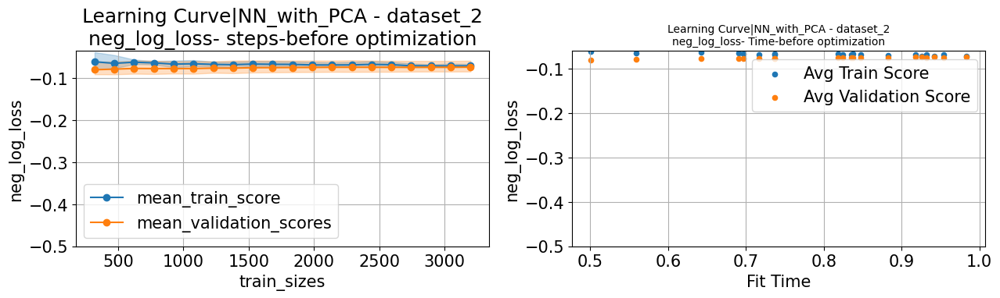

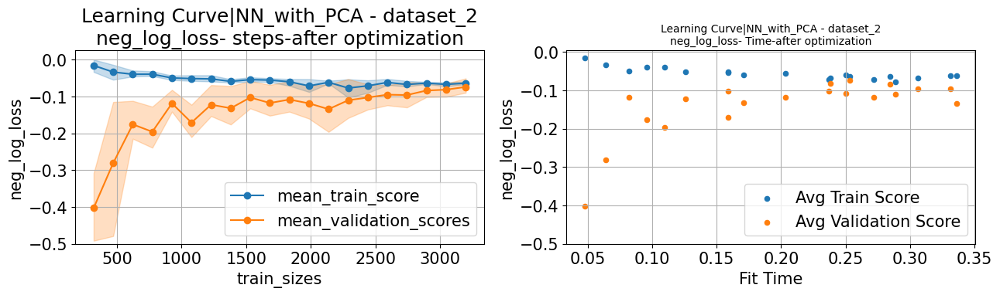

In [736]:

    
    
plt.rc('xtick', labelsize=15) 

learning_curve_config_NN_2 = dict(cv=5, 
                            train_sizes=np.linspace(0.1, 1.0, 20),
                         n_jobs=-1,return_times =True,shuffle=True,
                        scoring = 'neg_log_loss',
                        random_state = 1)


NN_pipe_epochs_2_before_optim = NNC(early_stopping=False,
                                   random_state = 1,
                                  
                                  **{'batch_size': 32,
                                 'hidden_layer_sizes': (64,),
                                 'learning_rate_init': 1e-04,
                                 'momentum': 1e-04}
                                   
                                  ,max_iter = 813
                                  )





NN_pipe_epochs_2_after_optim = NNC(early_stopping=False,
                                   random_state = 1,
                                  
                                  **{'batch_size': 64, 
                                     'hidden_layer_sizes': (64, 32),
                                     'learning_rate_init': 0.1, 
                                     'momentum': 1e-04}
                                   
                                  ,max_iter = 813
                                  )











 
    





dataset_2.NN_with_dim_red['PCA']['learning_curve'] = learning_curve_cover(
                    dataset=dataset_2,
                    scorer = dataset_2.NN_with_dim_red['PCA']['clf'].scorer_,
                    learning_curve_config_NN_2=learning_curve_config_NN_2,
                    NN_pipe_epochs_2_before_optim = NN_pipe_epochs_2_before_optim,
                    NN_pipe_epochs_2_after_optim = NN_pipe_epochs_2_after_optim,

                    scoring = 'neg_log_loss',
                    dataset_name='dataset_2',
                     misc ="NN_with_PCA"
                     ,train = 'X_train_pca_sel',
                       test = 'X_test_pca_sel',   

                    plot_config = dict(marker= 'o',logx =False,grid= True),
                    ylim=dict(ymax=None,ymin=-0.5), save = True

                    )

## 6.2 ICA : dataset 2

### Grid Search

In [713]:

dataset_2.NN_with_dim_red['ICA'] = handle_nn(dataset_2,
              NN_all_hyps_curves_all=NN_all_hyps_curves_all,
              NN_2_GS_params=NN_2_GS_params,
             NN_pipe = NN_pipe, GS=GS, type_='',
             dataset_name='dataset_2',
             misc ="NN_with_DIM_ICA"
             ,train = 'X_train_ica',
               test = 'X_test_ica',
              plot_config = dict({})             
             )

{'best_score': -0.07820553485383737, 'best_params': {'batch_size': 32, 'hidden_layer_sizes': (64, 32), 'learning_rate_init': 0.0031622776, 'momentum': 1e-04, 'random_state': 1}}
------ dataset_2_NN_with_DIM_ICA
{'homogeneity': 0.8063804917732602, 'Completeness': 0.8066387326894524, 'Adj_Mutual_info': 0.8064746816569492, 'best_test_accuracy': -0.07253709281703835}


### - Finding best iteration : epoch learning curve

val -0.05751240171164893 epoch (array([401]),)


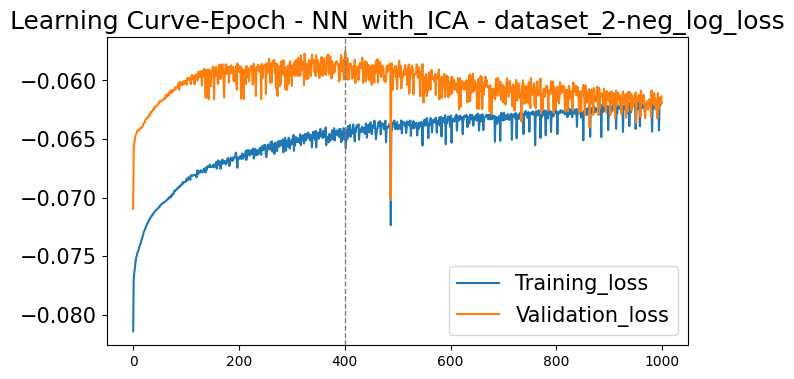

In [721]:





#epochs
epochs = 200

NN_pipe_epochs_2 = NNC(early_stopping=False,
                                   random_state = 1,
                                  
                                  **{'batch_size': 32, 
                                     'hidden_layer_sizes': (64, 32),
                                     'learning_rate_init': 0.0031622776, 
                                     'momentum': 1e-04} 
                                     
                                     
                                     
                                     # please note learning rate was altered for the best model, to visualize the impact better
                                 #'momentum': 1e-04}
                                   
                                  ,max_iter = 1000
                                  )


dataset_2.NN_with_dim_red['ICA']['learning_curve_epoch_2'] = epoch_learning_curve(
                                model = NN_pipe_epochs_2,
                                 dataset = dataset_2,
                                  scorer = dataset_2.NN_with_dim_red['ICA']['clf'].scorer_,
                                                                        
                                    scoring = 'neg_log_loss',
                                    #algorithm='NN_',data_set_name='data 2',
                                    plot_config = dict(logx =False),
                                                                          
                                 dataset_name='dataset_2',
                                 misc ="NN_with_ICA"
                                ,train = 'X_train_ica',
                                 test = 'X_test_ica',                                           
                                                                          
                                                                          
                                                                          
                                                                          
                                 )

### - learning curve

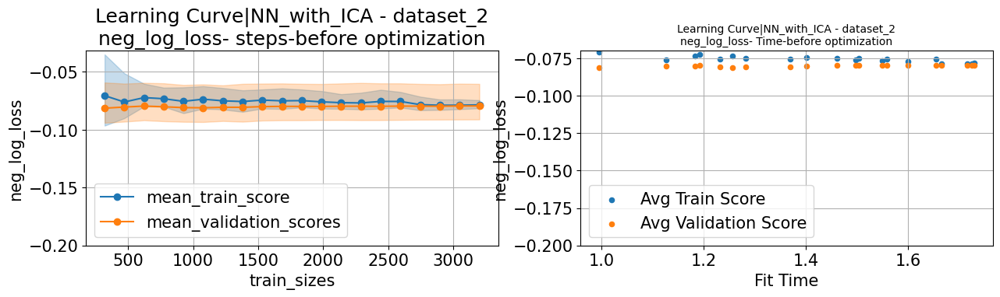

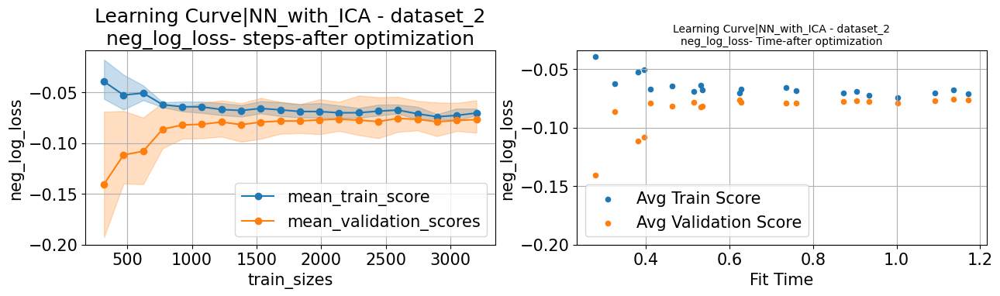

In [738]:

    
    
plt.rc('xtick', labelsize=15) 

learning_curve_config_NN_2 = dict(cv=5, 
                            train_sizes=np.linspace(0.1, 1.0, 20),
                         n_jobs=-1,return_times =True,shuffle=True,
                        scoring = 'neg_log_loss',
                        random_state = 1)


NN_pipe_epochs_2_before_optim = NNC(early_stopping=False,
                                   random_state = 1,
                                  
                                  **{'batch_size': 8,
                                 'hidden_layer_sizes': (32,),
                                 'learning_rate_init': 1e-04,
                                 'momentum': 1e-04}
                                   
                                  ,max_iter = 401
                                  )


NN_pipe_epochs_2_after_optim = NNC(early_stopping=False,
                                   random_state = 1,
                                  
                                  **{'batch_size': 32, 
                                     'hidden_layer_sizes': (64, 32),
                                     'learning_rate_init': 0.0031622776, 
                                     'momentum': 1e-04}
                                   
                                  ,max_iter = 401
                                  )






dataset_2.NN_with_dim_red['ICA']['learning_curve'] = learning_curve_cover(
                    dataset=dataset_2,
                    scorer = dataset_2.NN_with_dim_red['ICA']['clf'].scorer_,
                    learning_curve_config_NN_2=learning_curve_config_NN_2,
                    NN_pipe_epochs_2_before_optim = NN_pipe_epochs_2_before_optim,
                    NN_pipe_epochs_2_after_optim = NN_pipe_epochs_2_after_optim,

                    scoring = 'neg_log_loss',
                    dataset_name='dataset_2',
                     misc ="NN_with_ICA"
                     ,train = 'X_train_ica',
                       test = 'X_test_ica',   

                    plot_config = dict(marker= 'o',logx =False,grid= True),
                    ylim=dict(ymax=None,ymin=-0.2), save = True

                    )

## 6.3 RPA : dataset 2

### - Grid Search

In [714]:

dataset_2.NN_with_dim_red['RPA'] = handle_nn(dataset_2,
              NN_all_hyps_curves_all=NN_all_hyps_curves_all,
              NN_2_GS_params=NN_2_GS_params,
             NN_pipe = NN_pipe, GS=GS, type_='',
             dataset_name='dataset_2',
             misc ="NN_with_DIM_RPA"
             ,train = 'X_train_rpa',
               test = 'X_test_rpa',
              plot_config = dict({})             
             )

{'best_score': -0.07835777431824846, 'best_params': {'batch_size': 32, 'hidden_layer_sizes': (64,), 'learning_rate_init': 0.0031622776, 'momentum': 1e-04, 'random_state': 1}}
------ dataset_2_NN_with_DIM_RPA
{'homogeneity': 0.8175041160842882, 'Completeness': 0.8175191464948413, 'Adj_Mutual_info': 0.8174787113021484, 'best_test_accuracy': -0.06564270936077275}


### - Finding best iteration : epoch learning curve

val -0.05904826936311804 epoch (array([92]),)


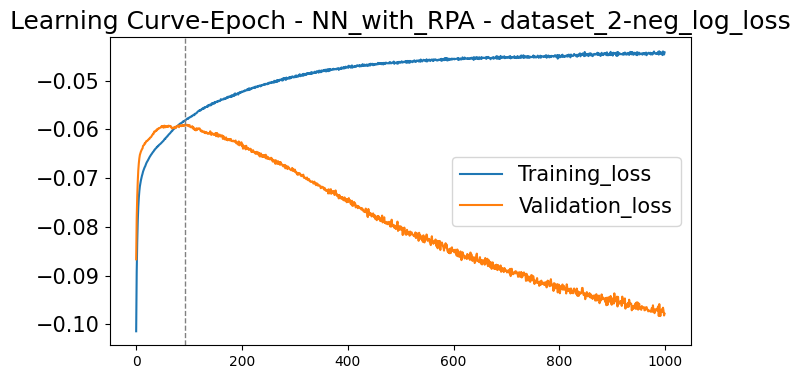

In [724]:





#epochs
epochs = 200

NN_pipe_epochs_2 = NNC(early_stopping=False,
                                   random_state = 1,
                                  
                                  **{'batch_size': 32, 
                                     'hidden_layer_sizes': (64,),
                                     'learning_rate_init': 0.0031622776, 
                                     'momentum': 1e-04} 
                                     
                                     
                                     
                                     # please note learning rate was altered for the best model, to visualize the impact better
                                 #'momentum': 1e-04}
                                   
                                  ,max_iter = 1000
                                  )


dataset_2.NN_with_dim_red['RPA']['learning_curve_epoch_2'] = epoch_learning_curve(
                                model = NN_pipe_epochs_2,
                                 dataset = dataset_2,
                                  scorer = dataset_2.NN_with_dim_red['RPA']['clf'].scorer_,
                                                                        
                                    scoring = 'neg_log_loss',
                                    #algorithm='NN_',data_set_name='data 2',
                                    plot_config = dict(logx =False),
                                                                          
                                 dataset_name='dataset_2',
                                 misc ="NN_with_RPA"
                                ,train = 'X_train_rpa',
                                 test = 'X_test_rpa',                                           
                                                                          
                                                                          
                                                                          
                                                                          
                                 )

In [1227]:
#for i in ['homogeneity', 'Completeness', 'Adj_Mutual_info', 'best_test_accuracy']:
#    print(i,':\t',dataset_2.NN_with_dim_red['RPA'][i])
#
#display(dataset_2.NN_with_dim_red['RPA']['learning_curve']['af_opt']['learning_df'].iloc[-1])

homogeneity :	 0.8175041160842882
Completeness :	 0.8175191464948413
Adj_Mutual_info :	 0.8174787113021484
best_test_accuracy :	 -0.06564270936077275


### - Learning curve

/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (92) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (92) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (92) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (92) reached 

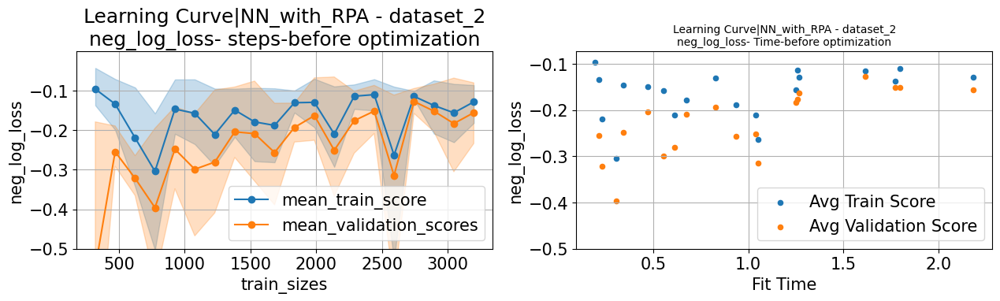

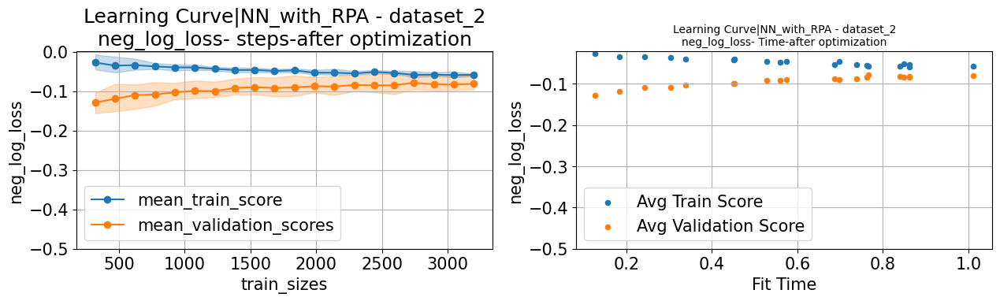

In [739]:

    
    
plt.rc('xtick', labelsize=15) 

learning_curve_config_NN_2 = dict(cv=5, 
                            train_sizes=np.linspace(0.1, 1.0, 20),
                         n_jobs=-1,return_times =True,shuffle=True,
                        scoring = 'neg_log_loss',
                        random_state = 1)


NN_pipe_epochs_2_before_optim = NNC(early_stopping=False,
                                   random_state = 1,
                                  
                                  **{'batch_size': 8,
                                 'hidden_layer_sizes': (32,32),
                                 'learning_rate_init': 0.1,
                                 'momentum': 1e-04}
                                   
                                  ,max_iter = 92
                                  )

NN_pipe_epochs_2_after_optim = NNC(early_stopping=False,
                                   random_state = 1,
                                  
                                  **{'batch_size': 32, 
                                     'hidden_layer_sizes': (64,),
                                     'learning_rate_init': 0.0031622776, 
                                     'momentum': 1e-04}
                                   
                                  ,max_iter = 92
                                  )






dataset_2.NN_with_dim_red['RPA']['learning_curve'] = learning_curve_cover(
                    dataset=dataset_2,
                    scorer = dataset_2.NN_with_dim_red['RPA']['clf'].scorer_,
                    learning_curve_config_NN_2=learning_curve_config_NN_2,
                    NN_pipe_epochs_2_before_optim = NN_pipe_epochs_2_before_optim,
                    NN_pipe_epochs_2_after_optim = NN_pipe_epochs_2_after_optim,

                    scoring = 'neg_log_loss',
                    dataset_name='dataset_2',
                     misc ="NN_with_RPA"
                     ,train = 'X_train_rpa',
                       test = 'X_test_rpa',   

                    plot_config = dict(marker= 'o',logx =False,grid= True),
                    ylim=dict(ymax=None,ymin=-0.5), save = True

                    )

## 6.4 Isomap : dataset 2

### Grid Search

In [715]:
dataset_2.NN_with_dim_red['ISOMAP'] = handle_nn(dataset_2,
              NN_all_hyps_curves_all=NN_all_hyps_curves_all,
              NN_2_GS_params=NN_2_GS_params,
             NN_pipe = NN_pipe, GS=GS, type_='',
             dataset_name='dataset_2',
             misc ="NN_with_DIM_IsoMap"
             ,train = 'X_train_isomap',
               test = 'X_test_isomap',
              plot_config = dict({})             
             )

{'best_score': -0.07668367521391053, 'best_params': {'batch_size': 8, 'hidden_layer_sizes': (64,), 'learning_rate_init': 0.017782794, 'momentum': 1e-04, 'random_state': 1}}
------ dataset_2_NN_with_DIM_IsoMap
{'homogeneity': 0.8387825025850335, 'Completeness': 0.8389007529190052, 'Adj_Mutual_info': 0.838812549697319, 'best_test_accuracy': -0.06238796176159771}


### - Finding best iteration : epoch learning curve

val -0.05653277022247755 epoch (array([24]),)


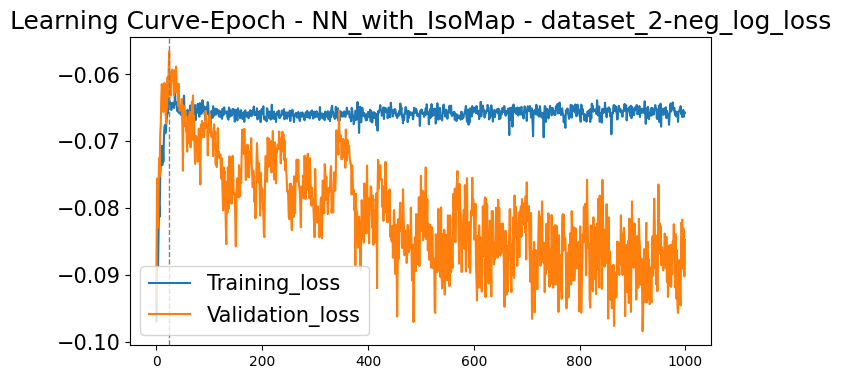

In [723]:





#epochs
epochs = 200

NN_pipe_epochs_2 = NNC(early_stopping=False,
                                   random_state = 1,
                                  
                                  **{'batch_size': 8, 
                                     'hidden_layer_sizes': (64,),
                                     'learning_rate_init': 0.017782794, 
                                     'momentum': 1e-04} 
                                     
                                     
                                     
                                     # please note learning rate was altered for the best model, to visualize the impact better
                                 #'momentum': 1e-04}
                                   
                                  ,max_iter = 1000
                                  )


dataset_2.NN_with_dim_red['ISOMAP']['learning_curve_epoch_2'] = epoch_learning_curve(
                                model = NN_pipe_epochs_2,
                                 dataset = dataset_2,
                                  scorer = dataset_2.NN_with_dim_red['ISOMAP']['clf'].scorer_,
                                                                        
                                    scoring = 'neg_log_loss',
                                    #algorithm='NN_',data_set_name='data 2',
                                    plot_config = dict(logx =False),
                                                                          
                                 dataset_name='dataset_2',
                                 misc ="NN_with_IsoMap"
                                ,train = 'X_train_isomap',
                                 test = 'X_test_isomap',                                           
                                                                          
                                                                          
                                                                          
                                                                          
                                 )

### - learning curve

/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (24) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (24) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (24) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (24) reached 

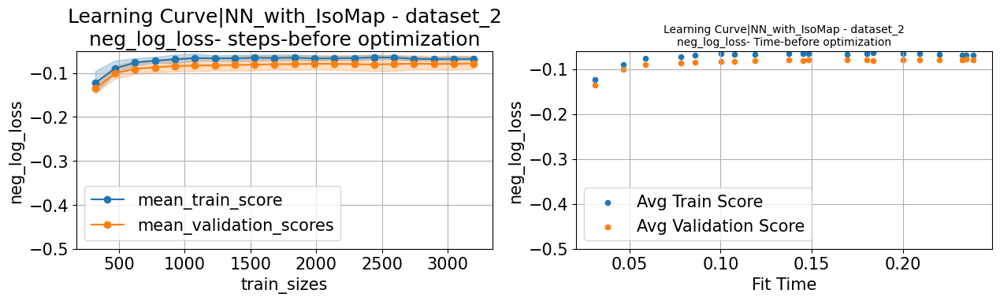

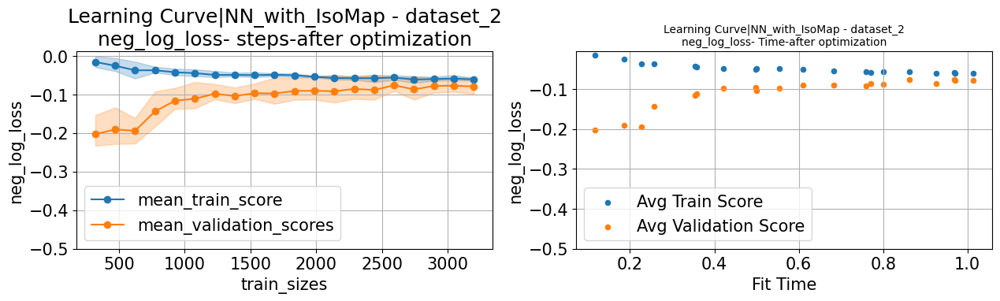

In [740]:

    
    
plt.rc('xtick', labelsize=15) 

learning_curve_config_NN_2 = dict(cv=5, 
                            train_sizes=np.linspace(0.1, 1.0, 20),
                         n_jobs=-1,return_times =True,shuffle=True,
                        scoring = 'neg_log_loss',
                        random_state = 1)


NN_pipe_epochs_2_before_optim = NNC(early_stopping=False,
                                   random_state = 1,
                                  
                                  **{'batch_size': 64,
                                 'hidden_layer_sizes': (32,32),
                                 'learning_rate_init': 0.000562341,
                                 'momentum': 1e-04}
                                   
                                  ,max_iter = 24
                                  )

#64	(32, 32)	0.000562341	1e-04


NN_pipe_epochs_2_after_optim = NNC(early_stopping=False,
                                   random_state = 1,
                                  
                                  **{'batch_size': 8, 
                                     'hidden_layer_sizes': (64,),
                                     'learning_rate_init': 0.017782794, 
                                     'momentum': 1e-04}
                                   
                                  ,max_iter = 24
                                  )






dataset_2.NN_with_dim_red['ISOMAP']['learning_curve'] = learning_curve_cover(
                    dataset=dataset_2,
                    scorer = dataset_2.NN_with_dim_red['ISOMAP']['clf'].scorer_,
                    learning_curve_config_NN_2=learning_curve_config_NN_2,
                    NN_pipe_epochs_2_before_optim = NN_pipe_epochs_2_before_optim,
                    NN_pipe_epochs_2_after_optim = NN_pipe_epochs_2_after_optim,

                    scoring = 'neg_log_loss',
                    dataset_name='dataset_2',
                     misc ="NN_with_IsoMap"
                     ,train = 'X_train_isomap',
                       test = 'X_test_isomap',   

                    plot_config = dict(marker= 'o',logx =False,grid= True),
                    ylim=dict(ymax=None,ymin=-0.5), save = True

                    )

In [741]:
dataset_2.save()

# 7. Neural Network - with Cluster in dataset

## 7.1 Kmeans : dataset 2

### preping data

In [807]:



dataset_2.X_train_kmeans_data = pd.DataFrame(dataset_2.X_train_scaled.copy(),columns=
                                             dataset_2.X_train.columns)



dataset_2.X_train_kmeans_data = pd.concat([

dataset_2.X_train_kmeans_data,

pd.get_dummies(

dataset_2.Clustring_without_dim_red['Kmeans']['Train_labels'][

dataset_2.Clustring_without_dim_red['Kmeans']['score_df'].iloc[
dataset_2.Clustring_without_dim_red['Kmeans']['score_df'].sil_score.argmax()
].Cluster.astype(int)

]

).astype(np.float64).iloc[:,:-1]

], axis =1)




dataset_2.X_train_kmeans_data.columns = dataset_2.X_train_kmeans_data.columns.astype(str)




dataset_2.X_test_kmeans_data = pd.DataFrame(dataset_2.X_test_scaled.copy(),
                               columns=dataset_2.X_test.columns)



dataset_2.X_test_kmeans_data = pd.concat([

dataset_2.X_test_kmeans_data,

pd.get_dummies(

dataset_2.Clustring_without_dim_red['Kmeans']['Test_labels'][

dataset_2.Clustring_without_dim_red['Kmeans']['score_df'].iloc[
dataset_2.Clustring_without_dim_red['Kmeans']['score_df'].sil_score.argmax()
].Cluster.astype(int)

]

).astype(np.float64).reset_index(drop=True).iloc[:,:-1]

], axis =1)



dataset_2.X_test_kmeans_data.columns = dataset_2.X_test_kmeans_data.columns.astype(str)





#['Train_labels']

### Grid Search

In [808]:

#X_train_kmeans_data
#X_test_kmeans_data



dataset_2.NN_with_clusters['Kmeans'] = handle_nn(dataset_2,
              NN_all_hyps_curves_all=NN_all_hyps_curves_all,
              NN_2_GS_params=NN_2_GS_params,
             NN_pipe = NN_pipe, GS=GS, type_='',
             dataset_name='dataset_2',
             misc ="NN_with_Kmeans"
             ,train = 'X_train_kmeans_data',
               test = 'X_test_kmeans_data',
              plot_config = dict({})             
             )



{'best_score': -0.07596135710751598, 'best_params': {'batch_size': 8, 'hidden_layer_sizes': (64, 32), 'learning_rate_init': 0.0005623413, 'momentum': 1e-04, 'random_state': 1}}
------ dataset_2_NN_with_Kmeans
{'homogeneity': 0.8425121607482031, 'Completeness': 0.8426063277003554, 'Adj_Mutual_info': 0.8425308388006912, 'best_test_accuracy': -0.05660967457304826}


### - Finding best iteration : epoch learning curve

val -0.057600548080168026 epoch (array([24]),)


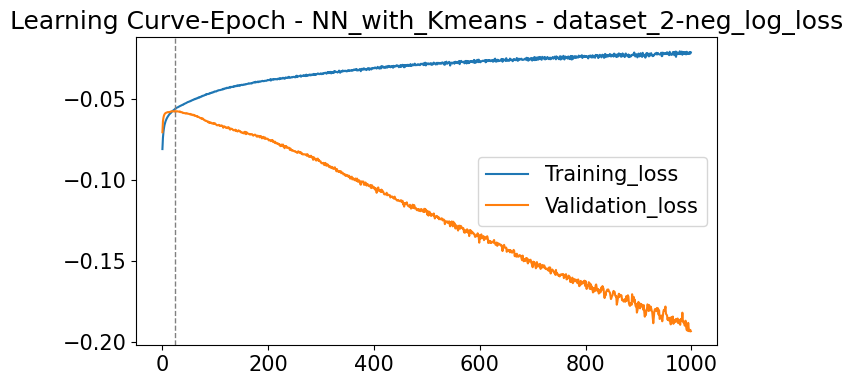

In [809]:





#epochs
epochs = 200

NN_pipe_epochs_2 = NNC(early_stopping=False,
                                   random_state = 1,
                                  
                                  **{'batch_size': 8, 
                                     'hidden_layer_sizes': (64,32),
                                     'learning_rate_init': 0.0005623413, 
                                     'momentum': 1e-04} 
                                     
                                     
                                     
                                     # please note learning rate was altered for the best model, to visualize the impact better
                                 #'momentum': 1e-04}
                                   
                                  ,max_iter = 1000
                                  )


dataset_2.NN_with_clusters['Kmeans']['learning_curve_epoch_2'] = epoch_learning_curve(
                                model = NN_pipe_epochs_2,
                                 dataset = dataset_2,
                                  scorer = dataset_2.NN_with_clusters['Kmeans']['clf'].scorer_,
                                                                        
                                    scoring = 'neg_log_loss',
                                    #algorithm='NN_',data_set_name='data 2',
                                    plot_config = dict(logx =False),
                                                                          
                                 dataset_name='dataset_2',
                                 misc ="NN_with_Kmeans"
                                ,train = 'X_train_kmeans_data',
                                 test = 'X_test_kmeans_data',                                           
                                                                          
                                                                          
                                                                          
                                                                          
                                 )

### - Learning Curve

/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (24) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (24) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (24) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (24) reached 

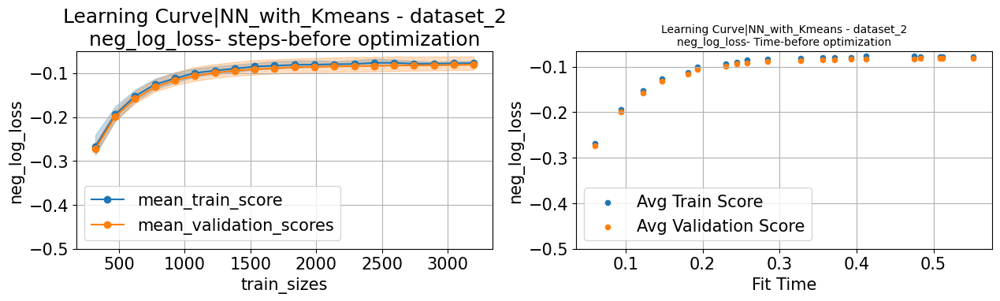

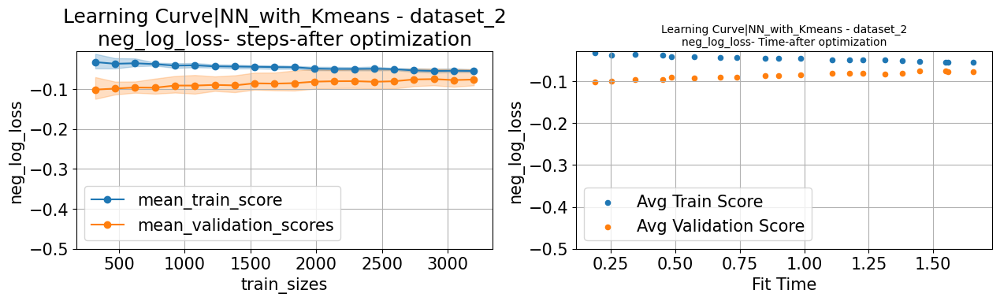

In [810]:

    
    
plt.rc('xtick', labelsize=15) 

learning_curve_config_NN_2 = dict(cv=5, 
                            train_sizes=np.linspace(0.1, 1.0, 20),
                         n_jobs=-1,return_times =True,shuffle=True,
                        scoring = 'neg_log_loss',
                        random_state = 1)


NN_pipe_epochs_2_before_optim = NNC(early_stopping=False,
                                   random_state = 1,
                                  
                                  **{'batch_size': 16,
                                 'hidden_layer_sizes': (64,),
                                 'learning_rate_init': 1e-04,
                                 'momentum': 1e-04}
                                   
                                  ,max_iter = 24
                                  )

NN_pipe_epochs_2_after_optim = NNC(early_stopping=False,
                                   random_state = 1,
                                  
                                  **{'batch_size': 8, 
                                     'hidden_layer_sizes': (64,32),
                                     'learning_rate_init': 0.0005623413, 
                                     'momentum': 1e-04}
                                   
                                  ,max_iter = 24
                                  )






dataset_2.NN_with_clusters['Kmeans']['learning_curve'] = learning_curve_cover(
                    dataset=dataset_2,
                    scorer = dataset_2.NN_with_clusters['Kmeans']['clf'].scorer_,
                    learning_curve_config_NN_2=learning_curve_config_NN_2,
                    NN_pipe_epochs_2_before_optim = NN_pipe_epochs_2_before_optim,
                    NN_pipe_epochs_2_after_optim = NN_pipe_epochs_2_after_optim,

                    scoring = 'neg_log_loss',
                    dataset_name='dataset_2',
                     misc ="NN_with_Kmeans"
                     ,train = 'X_train_kmeans_data',
                       test = 'X_test_kmeans_data',   

                    plot_config = dict(marker= 'o',logx =False,grid= True),
                    ylim=dict(ymax=None,ymin=-0.5), save = True

                    )

## 7.2 Expectation Maximization : dataset 2

### Preping Data

In [811]:



dataset_2.X_train_EM_data = pd.DataFrame(dataset_2.X_train_scaled.copy(),columns=
                                             dataset_2.X_train.columns)



dataset_2.X_train_EM_data = pd.concat([

dataset_2.X_train_EM_data,

pd.get_dummies(

dataset_2.Clustring_without_dim_red['EM']['Train_labels'][

dataset_2.Clustring_without_dim_red['EM']['score_df'].iloc[
dataset_2.Clustring_without_dim_red['EM']['score_df'].sil_score.argmax()
].Cluster.astype(int)

]

).iloc[:,:-1]

], axis =1)


dataset_2.X_train_EM_data.columns = dataset_2.X_train_EM_data.columns.astype(str)





dataset_2.X_test_EM_data = pd.DataFrame(dataset_2.X_test_scaled.copy(),columns=
                                             dataset_2.X_train.columns)



dataset_2.X_test_EM_data = pd.concat([

dataset_2.X_test_EM_data,

pd.get_dummies(

dataset_2.Clustring_without_dim_red['EM']['Test_labels'][

dataset_2.Clustring_without_dim_red['EM']['score_df'].iloc[
dataset_2.Clustring_without_dim_red['EM']['score_df'].sil_score.argmax()
].Cluster.astype(int)

]

).reset_index(drop=True).iloc[:,:-1]

], axis =1)


dataset_2.X_test_EM_data.columns = dataset_2.X_test_EM_data.columns.astype(str)





#['Train_labels']

### - Grid Search

In [812]:


dataset_2.NN_with_clusters['EM'] = handle_nn(dataset_2,
              NN_all_hyps_curves_all=NN_all_hyps_curves_all,
              NN_2_GS_params=NN_2_GS_params,
             NN_pipe = NN_pipe, GS=GS, type_='',
             dataset_name='dataset_2',
             misc ="NN_with_EM"
             ,train = 'X_train_EM_data',
               test = 'X_test_EM_data',
              plot_config = dict({})             
             )


{'best_score': -0.0767680422514038, 'best_params': {'batch_size': 8, 'hidden_layer_sizes': (32,), 'learning_rate_init': 0.017782794, 'momentum': 1e-04, 'random_state': 1}}
------ dataset_2_NN_with_EM
{'homogeneity': 0.8280353096898974, 'Completeness': 0.8281520449002879, 'Adj_Mutual_info': 0.8280626603024327, 'best_test_accuracy': -0.06188497802127777}


### - Finding best iteration : epoch learning curve

val -0.05442500460845899 epoch (array([39]),)


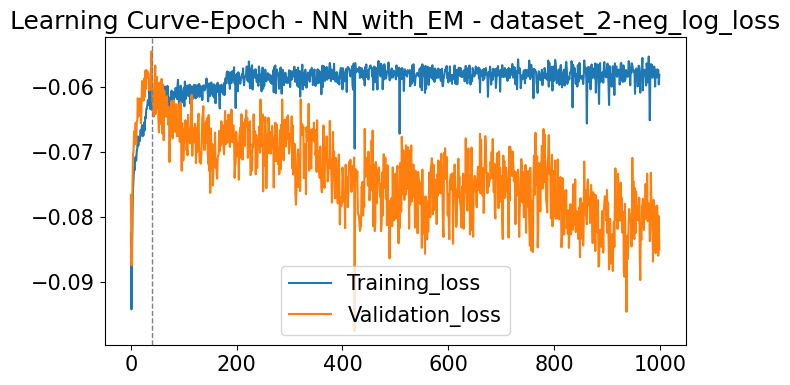

In [815]:





#epochs
epochs = 200

NN_pipe_epochs_2 = NNC(early_stopping=False,
                                   random_state = 1,
                                  
                                  **{'batch_size': 8, 
                                     'hidden_layer_sizes': (32,),
                                     'learning_rate_init': 0.017782794, 
                                     'momentum': 1e-04} 
                                     
                                     
                                     
                                     # please note learning rate was altered for the best model, to visualize the impact better
                                 #'momentum': 1e-04}
                                   
                                  ,max_iter = 1000
                                  )


dataset_2.NN_with_clusters['EM']['learning_curve_epoch_2'] = epoch_learning_curve(
                                model = NN_pipe_epochs_2,
                                 dataset = dataset_2,
                                  scorer = dataset_2.NN_with_clusters['EM']['clf'].scorer_,
                                                                        
                                    scoring = 'neg_log_loss',
                                    #algorithm='NN_',data_set_name='data 2',
                                    plot_config = dict(logx =False),
                                                                          
                                 dataset_name='dataset_2',
                                     misc ="NN_with_EM"
                                     ,train = 'X_train_EM_data',
                                       test = 'X_test_EM_data',                                          

                                                                          
                                                                          
                                                                          
                                 )

### - Learning Curve

/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (39) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (39) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (39) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/ashishpanchal/anaconda3/envs/experiments/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (39) reached 

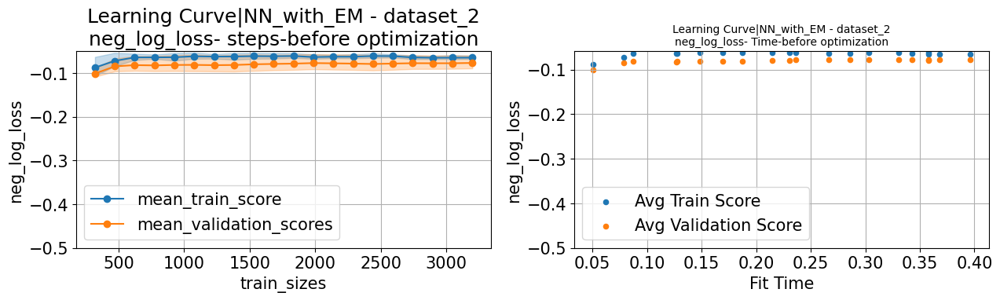

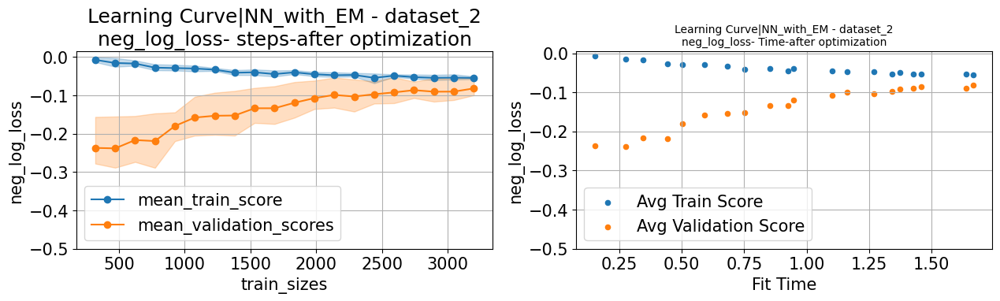

In [816]:

    
    
plt.rc('xtick', labelsize=15) 

learning_curve_config_NN_2 = dict(cv=5, 
                            train_sizes=np.linspace(0.1, 1.0, 20),
                         n_jobs=-1,return_times =True,shuffle=True,
                        scoring = 'neg_log_loss',
                        random_state = 1)


NN_pipe_epochs_2_before_optim = NNC(early_stopping=False,
                                   random_state = 1,
                                  
                                  **{'batch_size': 64,
                                 'hidden_layer_sizes': (32,32),
                                 'learning_rate_init': 0.000562341,
                                 'momentum': 1e-04}
                                   
                                  ,max_iter = 39
                                  )

#64	(32, 32)	0.000562341	1e-04


NN_pipe_epochs_2_after_optim = NNC(early_stopping=False,
                                   random_state = 1,
                                  
                                  **{'batch_size': 8, 
                                     'hidden_layer_sizes': (64,),
                                     'learning_rate_init': 0.017782794, 
                                     'momentum': 1e-04}
                                   
                                  ,max_iter = 39
                                  )






dataset_2.NN_with_clusters['EM']['learning_curve'] = learning_curve_cover(
                    dataset=dataset_2,
                    scorer = dataset_2.NN_with_dim_red['ISOMAP']['clf'].scorer_,
                    learning_curve_config_NN_2=learning_curve_config_NN_2,
                    NN_pipe_epochs_2_before_optim = NN_pipe_epochs_2_before_optim,
                    NN_pipe_epochs_2_after_optim = NN_pipe_epochs_2_after_optim,

                    scoring = 'neg_log_loss',
                    dataset_name='dataset_2',
                     misc ="NN_with_EM"
                     ,train = 'X_train_EM_data',
                       test = 'X_test_EM_data',  

                    plot_config = dict(marker= 'o',logx =False,grid= True),
                    ylim=dict(ymax=None,ymin=-0.5), save = True

                    )